In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
%matplotlib inline
import torch
import pickle
import os
from rdflib import Graph
import rdflib as rdf
import os
from scipy import sparse
import matplotlib.colors as mcolors
import re
from collections import defaultdict
from matplotlib.colors import Normalize
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [80]:
def read_all_pickle_without_ending(path):
    """
    Read all pickle files in a directory and return a list of the dataframes.
    """
    files = os.listdir(path)
    files = [file for file in files[:5] if file.endswith(".pkl")]
    files.sort()
    dfs = []
    for file in files:
        dfs.append(pd.read_pickle(path + file))
    return dfs

def readallcsvinpath(path):
    """
    Read all csv files in a directory and return a list of the dataframes.
    """
    fil = os.listdir(path)
    fil = [file for file in fil if file.endswith(".csv")]
    fil.sort()
    dfs = []
    for file in fil:
        dfs.append(pd.read_csv(path + file))
    return dfs
def get_nameincolfor_index(df,id_list):
    """
    # df: dataframe
    # id_list: list of ids
    # return: list of names of ids
    """
    name_list=[]
    for i in id_list:
        name_list.append(df[df.index==i][0].values[0])
    return name_list
def cut_string(list):
    for i in range(len(list)):
        list[i] = list[i].split('mov')[1]
    return list
def parse_tensor_string(tensor_str):
    values_str = re.search(r'\[(.*?)\]', tensor_str).group(1)
    values = [float(val) for val in values_str.split(', ')]
    return torch.tensor(values)

In [81]:
files = read_all_pickle_without_ending('out/AIFB/RGAT_no_emb/')
csv = readallcsvinpath('out/AIFB/RGAT_no_emb/')
pred_before = torch.load('out/AIFB/RGAT_no_emb/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/AIFB/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/AIFB/RGAT_no_emb/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/AIFB/RGAT_no_emb/i2r.pkl')

test_list = pd.read_pickle('out/AIFB/RGAT_no_emb/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
pred_before[2534]

http://www.aifb.uni-karlsruhe.de/Personen/viewPersonOWL/id2137instance


array([7.2355505e-10, 3.9179696e-08, 7.2363271e-09, 1.0000000e+00],
      dtype=float32)

In [82]:
i2n[902]

'http://swrc.ontoware.org/ontology#PhDStudent'

In [83]:
path = 'out/AIFB/RGAT_no_emb/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)

12


## Pred Änderung RGCN no emb before/after

#### Relevance that prediction changes, if relevance is changed

In [84]:
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before



0
0
0
0
0
0
0
0
0
0
0
0
12 432 0
[]
0.0


(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))

In [85]:
triples = files[2]
#print(triples[:20])
num_rels = triples[:, 1].max() + 1
print(num_rels)
inverse_relations = torch.cat([triples[:, 2, None], triples[:, 1, None] + num_rels, triples[:, 0, None]], dim=1)
#inverse_relations[:20]
files[2][:,1].max()

tensor(21.)


tensor(20.)

12
0
pred_after129adapt_1226_24.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


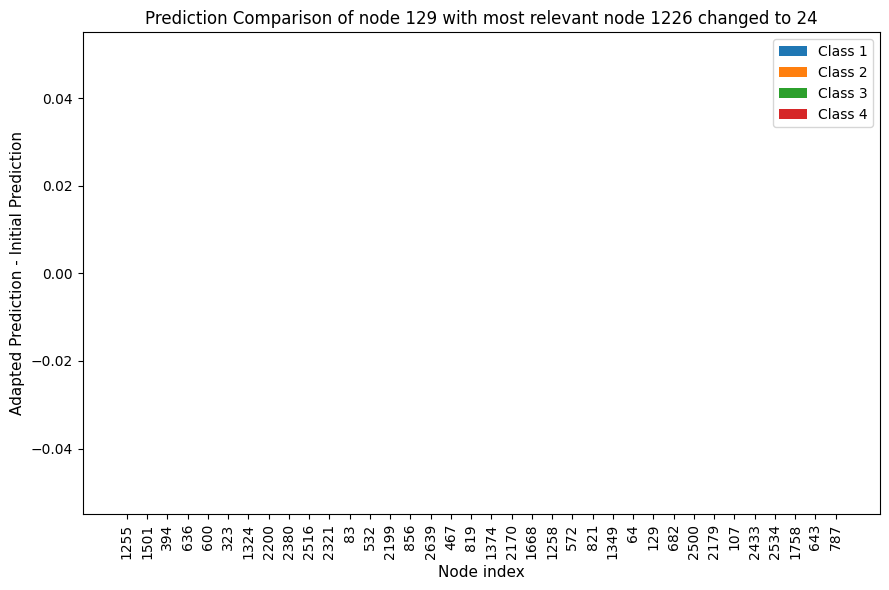

1
pred_after2170adapt_tensor([  27, 1226])_35.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


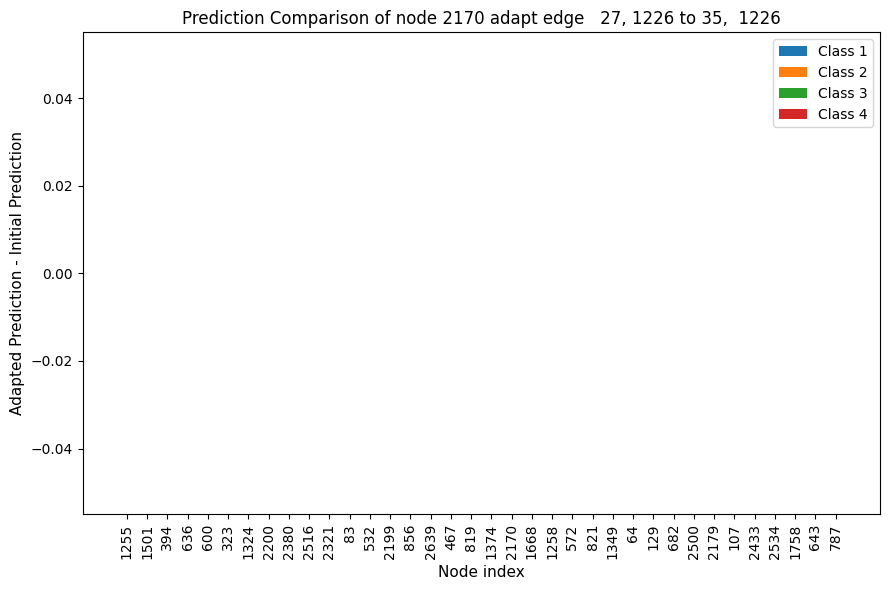

2
pred_after2433adapt_2538_39.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


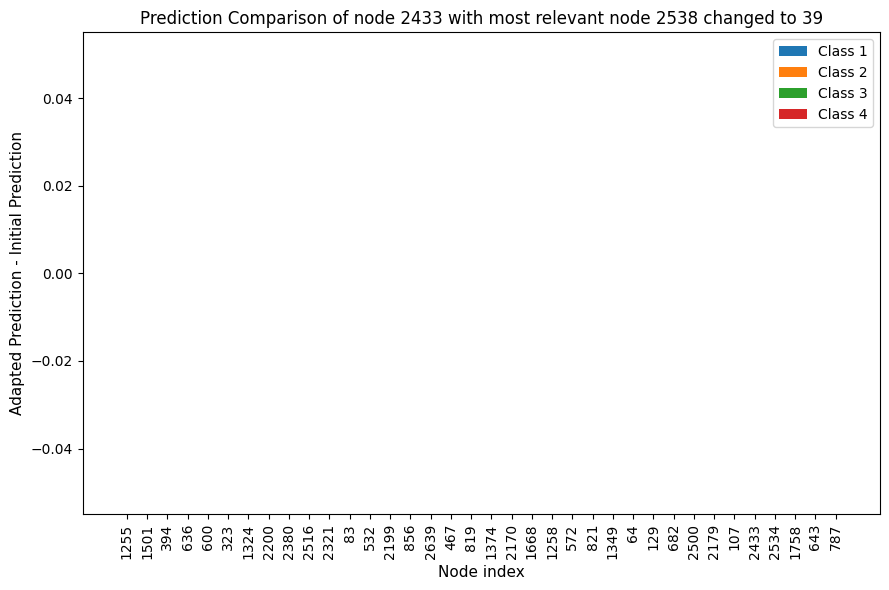

3
pred_after2433adapt_tensor([  27, 2538])_2.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


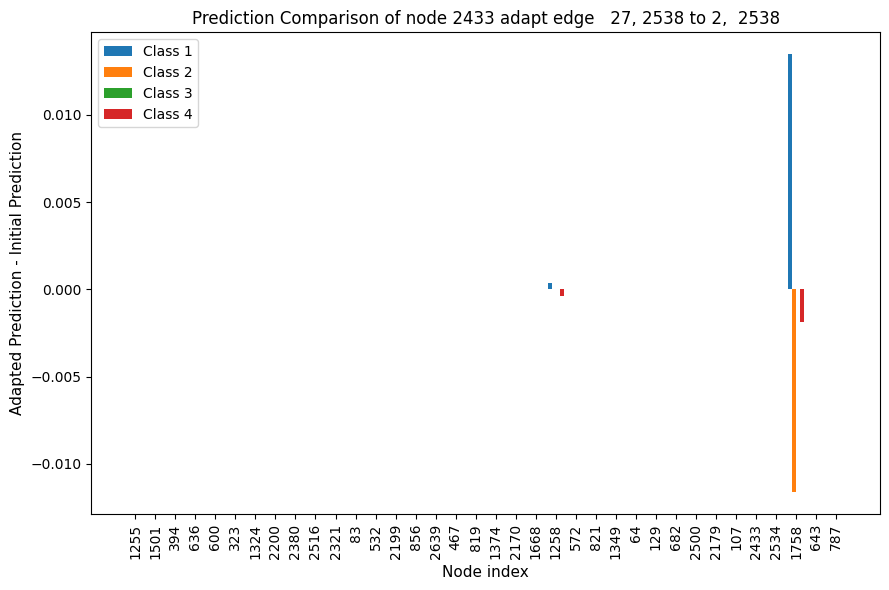

4
pred_after2534adapt_1849_9.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


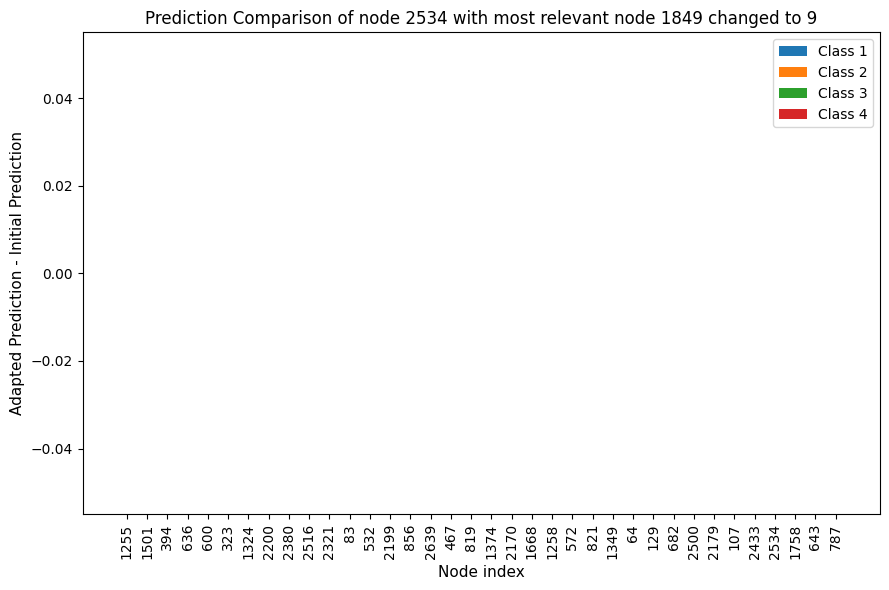

5
pred_after2534adapt_tensor([   0, 1849])_32.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


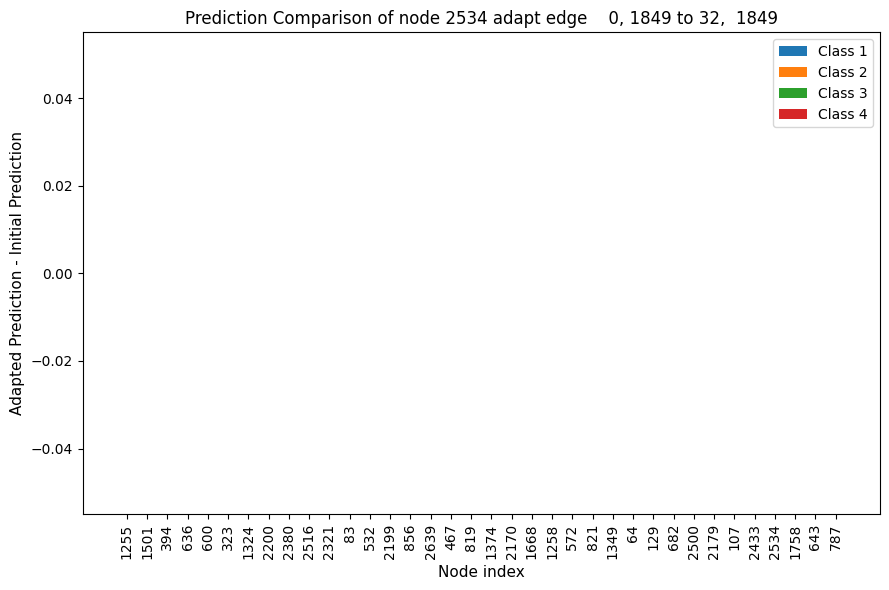

6
pred_after643adapt_2538_12.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


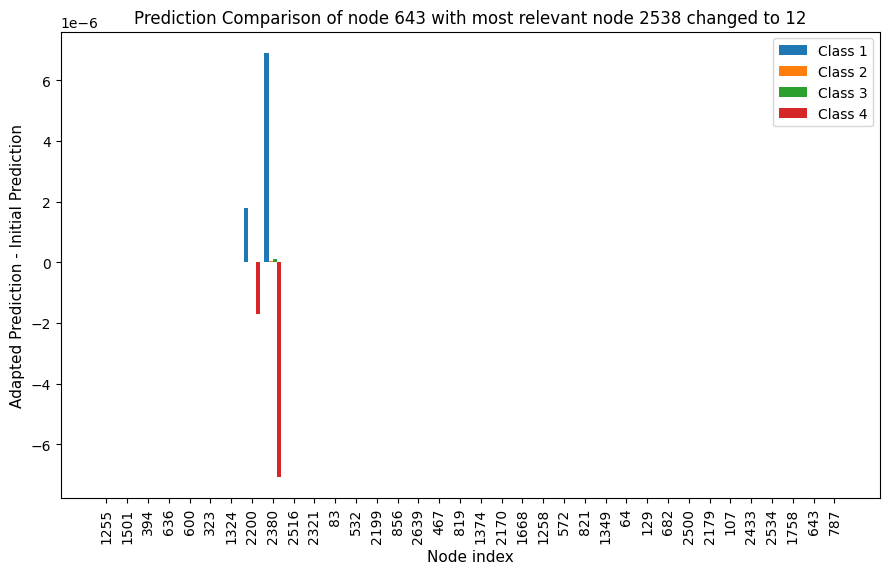

7
pred_after643adapt_tensor([  27, 2538])_34.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


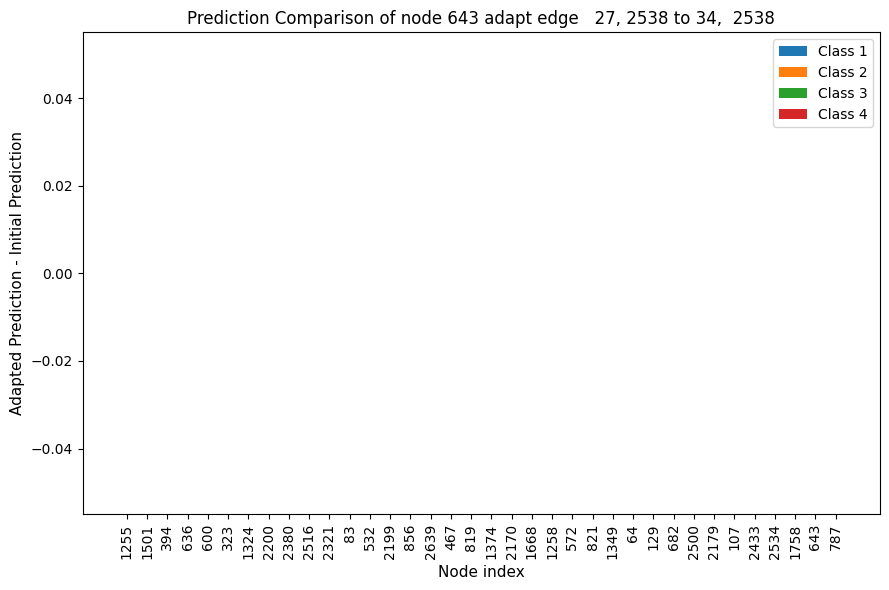

8
pred_after64adapt_2538_21.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


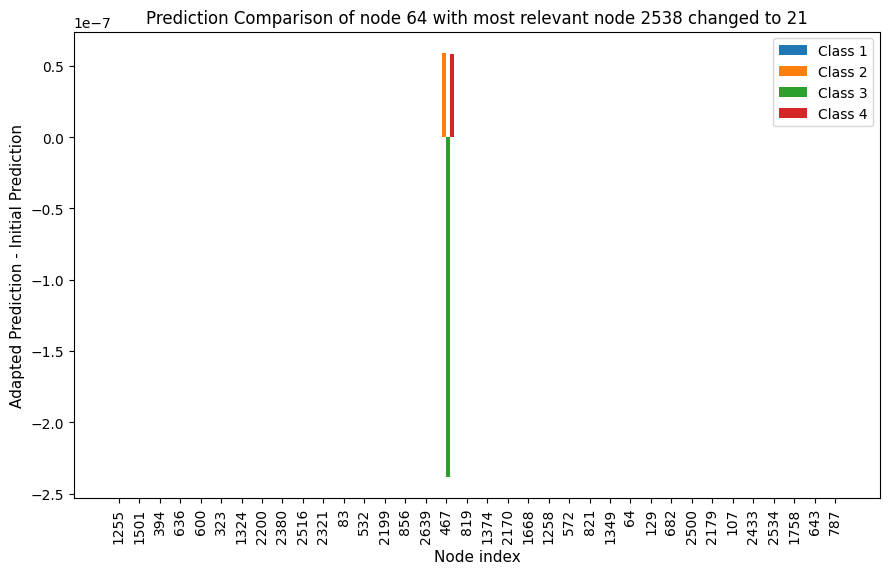

9
pred_after64adapt_tensor([  27, 2538])_25.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


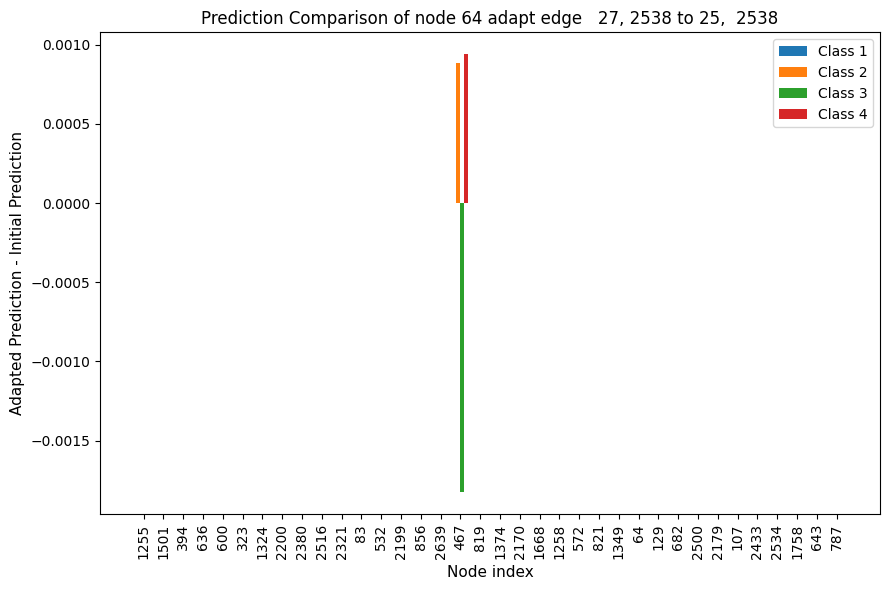

10
pred_after787adapt_1849_7.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


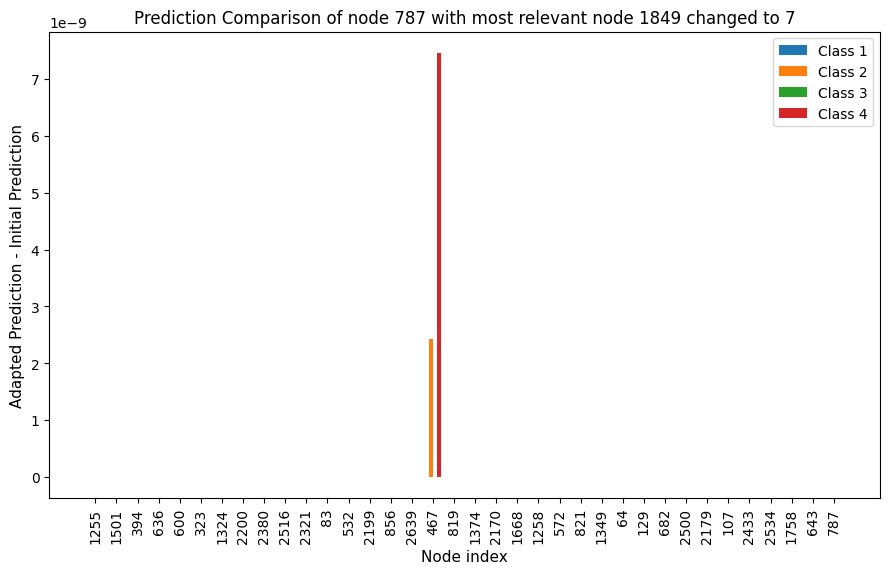

11
pred_after787adapt_tensor([   0, 1849])_1.pt
(array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64)) (array([0, 1, 2, 3], dtype=int64), array([16,  5, 10,  5], dtype=int64))


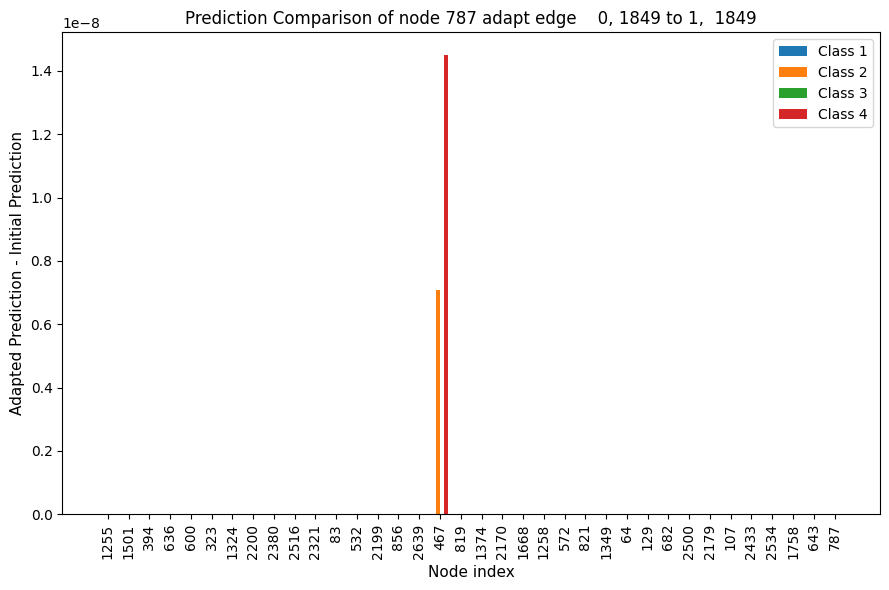

In [86]:
path = 'out/AIFB/RGCN_no_emb/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(36)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=10)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=11)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

In [87]:
csv[2]

,Unnamed: 0,Unnamed: 1,rel_nodes_new,rel_edges_new,max_nodes_new,pos_max_nodes_new,min_nodes_new,pos_min_nodes_new,max_edges_new,pos_max_edges_new,min_edges_new,pos_min_edges_new
0,16,"tensor(467, device='cuda:7')","tensor([0., 0., 0., ..., 0., 0., 0.])","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",2.812790,974,-1.737814,1121,178.442657,"tensor([[ 5, 1121]])",-95.521843,"tensor([[ 14, 1121]])"
1,8,"tensor(2380, device='cuda:7')","tensor([0., 0., 0., ..., 0., 0., 0.])","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",1.270214,2380,-0.790527,782,574.763123,"tensor([[ 5, 782]])",-1043.954834,"tensor([[ 0, 782]])"
2,33,"tensor(1758, device='cuda:7')","tensor([0., 0., 0., ..., 0., 0., 0.])","tensor([[0., 0., 0., ..., 0., 0., 0.],\r\n ...",4.161394,2185,-4.515342,633,205.686859,"tensor([[ 0, 2512]])",-98.932480,"tensor([[ 1, 2512]])"


#### Prediction changed from working group 0 to working group 2.

In [88]:
edge_index_plus = files[0]
edge_type_plus = files[1]
edges_list = files[2]
i2n = files[3]
i2r = files[4]
test_idx = files[5]

IndexError: list index out of range

In [89]:
large_after_nodes = csv[0]
large_after_edges = csv[1]
edges = csv[2]
nodes = csv[3]
small_after_nodes = csv[4]
small_after_edges = csv[5]

# Auswertung Relevanzen
#### Average relevance nodes

In [90]:
path = 'out/AIFB/RGAT_no_emb/relevances/'
dist = 'out/AIFB/RGAT_emb/DistMult/relevances/'
transe = 'out/AIFB/RGAT_emb/TransE/relevances/'
transh = 'out/AIFB/RGAT_emb/TransH/relevances/'
list_paths = [path,dist,transe,transh]
fil = os.listdir(path)
dist2 = os.listdir(dist)
transe2 = os.listdir(transe)
transh2 = os.listdir(transh)
rel_before = [file for file in fil if file.startswith("relevances_node_")]
rel_bef_dist = [file for file in dist2 if file.startswith("relevances_node_")]
rel_bef_transe = [file for file in transe2 if file.startswith("relevances_node_")]
rel_bef_transh = [file for file in transh2 if file.startswith("relevances_node_")]
count_path= 0
for l in [rel_before,rel_bef_dist,rel_bef_transe,rel_bef_transh]:
    path2 = list_paths[count_path]
    count_path += 1
    print('######',path2,'######')
    mean_rel_ges = 0 
    count_zero_ges = 0
    count_positive_ges = 0
    count_negative_ges = 0 
    mean_positive = 0
    mean_negative = 0
    max_positive = 0
    max_negative = 0
    count = 0
    #print(path2)
    for rel in l:
        #print(rel)
        #print(path2)
        rb = torch.load(path2 + rel)
        rb_non_zero = rb[rb != 0]
        rb_count_zero = rb[rb == 0]
        mean_rel= rb_non_zero.mean(axis=0)
        rb_count_positive = rb[rb > 0]
        rb_count_negative = rb[rb < 0]
        mean_rel_ges += mean_rel
        count_zero_ges += len(rb_count_zero)
        count_positive_ges += len(rb_count_positive)
        count_negative_ges += len(rb_count_negative)
        count += 1
        mean_positive += rb_count_positive.mean(axis=0)
        if len(rb_count_negative) != 0:
            mean_negative += rb_count_negative.mean(axis=0)
        if int(rb_count_positive.max(axis=0)[0]) > max_positive:
            max_positive =int( rb_count_positive.max(axis=0)[0])
        if len(rb_count_negative) != 0:
            if int(rb_count_negative.min(axis=0)[0]) < max_negative:
                max_negative = int(rb_count_negative.min(axis=0)[0])
        else:
            max_negative = 0
    mean_positive_ges = mean_positive / count
    mean_negative_ges = mean_negative / count
    percentage_zero =   count_zero_ges / (len(rb)* len(l))
    percentage_positive = count_positive_ges / (len(rb)* len(l))
    percentage_negative = count_negative_ges / (len(rb)* len(l))
    mean_rel_ges = mean_rel_ges / count
    print('Average_relevance without zero: ',mean_rel_ges, '\n',
            'Proportion 0 relevance: ', percentage_zero, '\n',
            'Proportion positive relevance: ', percentage_positive, '\n',
            'Proportion negative relevance: ',percentage_negative, '\n',
            'Average positive relevance: ', mean_positive_ges, '\n',
            'Average negative relevance: ',mean_negative_ges, '\n',
            'Max positive relevance: ', max_positive, '\n',
            'Max negative relevance: ', max_negative, '\n',)

###### out/AIFB/RGAT_no_emb/relevances/ ######
Average_relevance without zero:  tensor(0.0456) 
 Proportion 0 relevance:  0.9732608269645306 
 Proportion positive relevance:  0.016950813247109543 
 Proportion negative relevance:  0.009788359788359789 
 Average positive relevance:  tensor(0.1385) 
 Average negative relevance:  tensor(-0.1198) 
 Max positive relevance:  33 
 Max negative relevance:  -8 

###### out/AIFB/RGAT_emb/DistMult/relevances/ ######
Average_relevance without zero:  tensor(0.0456) 
 Proportion 0 relevance:  0.9732608269645306 
 Proportion positive relevance:  0.019126004311189496 
 Proportion negative relevance:  0.007613168724279836 
 Average positive relevance:  tensor(0.2251) 
 Average negative relevance:  tensor(-0.1786) 
 Max positive relevance:  73 
 Max negative relevance:  -94 

###### out/AIFB/RGAT_emb/TransE/relevances/ ######
Average_relevance without zero:  tensor(0.0456) 
 Proportion 0 relevance:  0.9732608269645306 
 Proportion positive relevance:  0.

## Relevanzverteilung vor/nach Tausch Kante

relevances_after_node_node_1758adapt_2185_0.pt 1758 2185 relevances_node_1758.pt


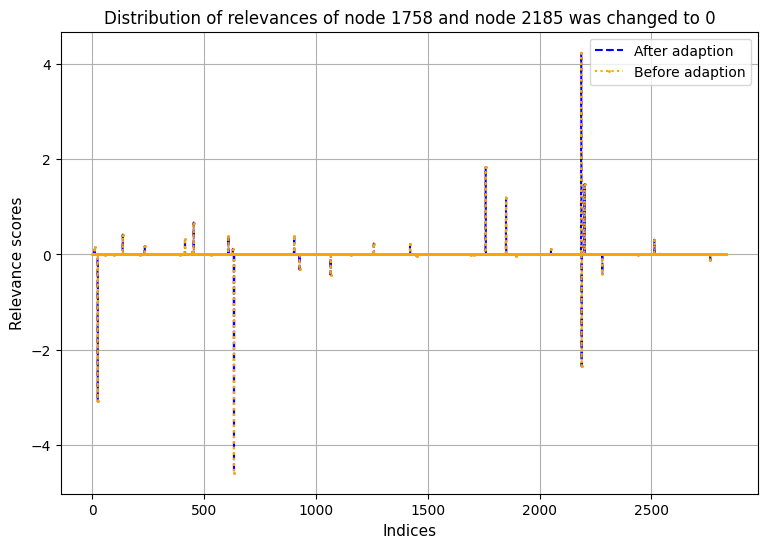

relevances_after_node_node_1758adapt_633_15.pt 1758 633 relevances_node_1758.pt


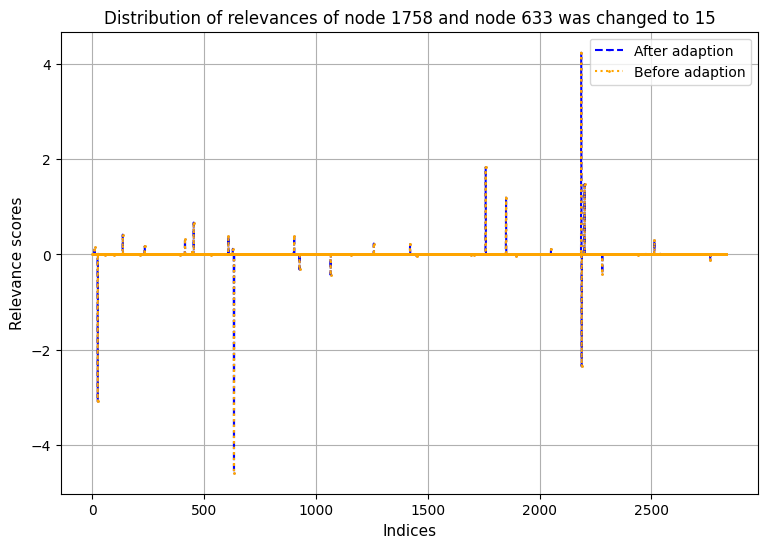

relevances_after_node_node_2200adapt_633_19.pt 2200 633 relevances_node_2200.pt


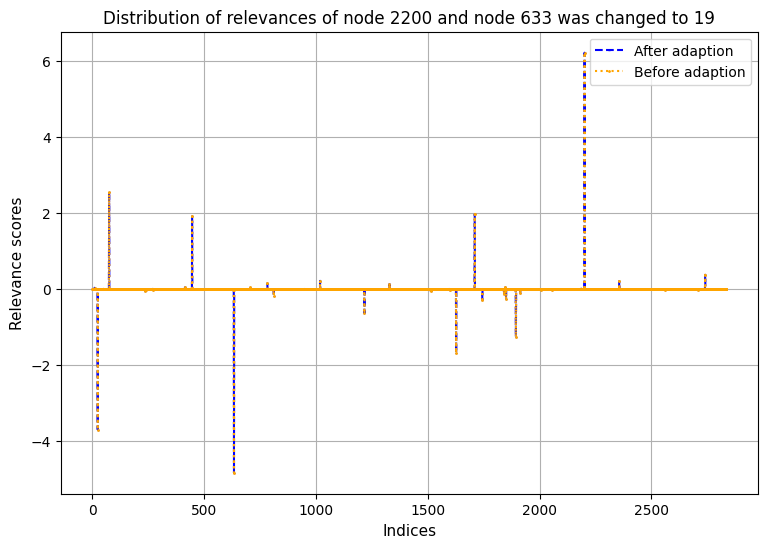

relevances_after_node_node_2200adapt_75_17.pt 2200 75 relevances_node_2200.pt


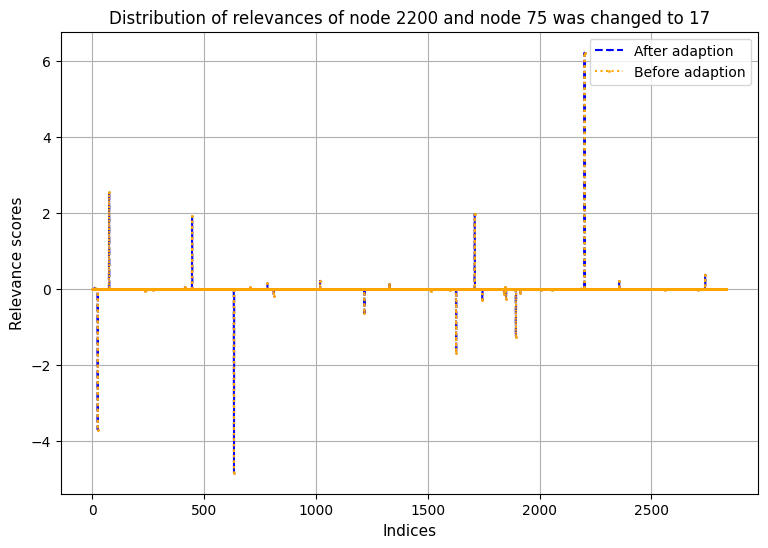

relevances_after_node_node_467adapt_1121_10.pt 467 1121 relevances_node_467.pt


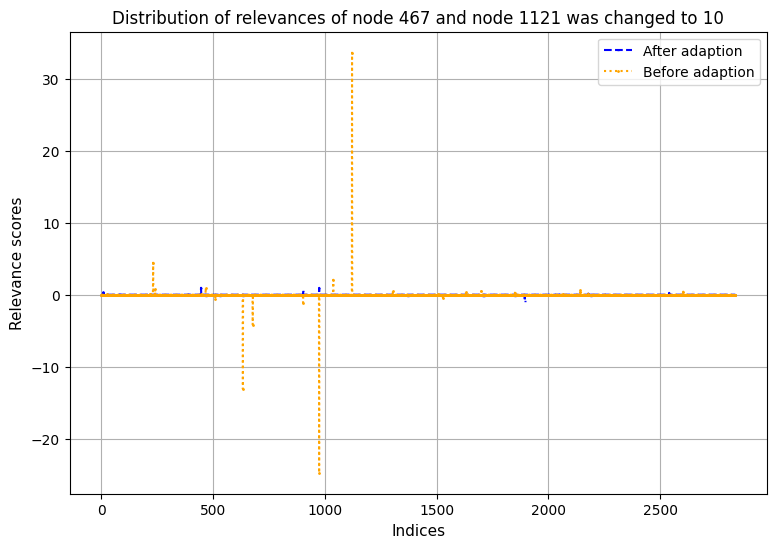

relevances_after_node_node_467adapt_974_6.pt 467 974 relevances_node_467.pt


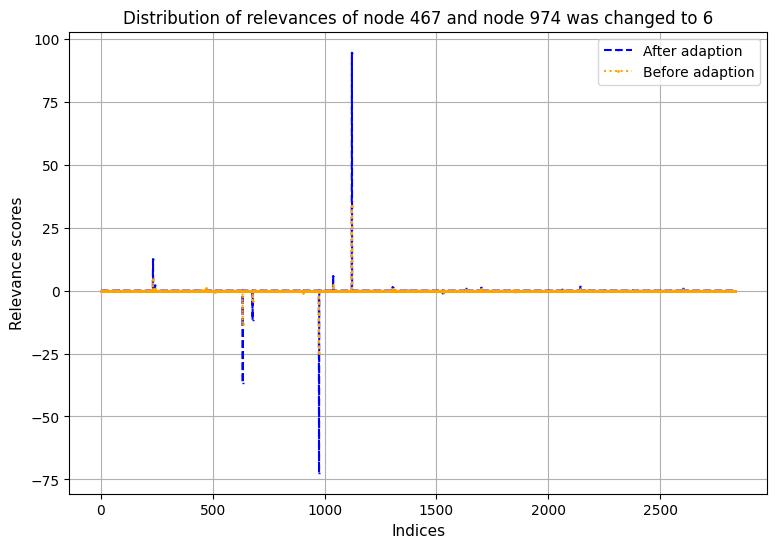

In [91]:
path = 'out/AIFB/RGAT_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('node_node_')[1].split('adapt')[0]
    adapt_node = rel.split('adapt_')[1].split('_')[0]
    to_node = rel.split('adapt_')[1].split('_')[1].split('.')[0]
    for rel2 in rel_before:
        

        if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            #ra = np.sort(ra)
            #rb = np.sort(rb)
            #Create an array of indices for the sorted data
            indices = np.arange(1, len(ra) + 1)

            # Create a line plot with different line styles and markers
            plt.figure(figsize=(9, 6))
            plt.plot(indices, ra, color='blue', linestyle='--', marker='_', markersize=2, label='After adaption')
            plt.plot(indices, rb, color='orange', linestyle='dotted', marker='.', markersize=2, label='Before adaption')

            plt.xlabel('Indices', fontsize=11)
            plt.ylabel('Relevance scores', fontsize=11)
            plt.title('Distribution of relevances of node {} and node {} was changed to {}'.format(node_name,adapt_node,to_node))
            plt.legend()
            plt.grid(True)
            plt.show()



In [92]:
path = 'out/AIFB/RGAT_no_emb/relevances/'

fil = os.listdir(path)
rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]

relevances_after_node_node_1758adapt_2185_0.pt 1758 2185 relevances_node_1758.pt
0.010093689 -0.010507584
(array([], dtype=int64),)
relevances_after_node_node_1758adapt_633_15.pt 1758 633 relevances_node_1758.pt
relevances_after_node_node_2200adapt_633_19.pt 2200 633 relevances_node_2200.pt
relevances_after_node_node_2200adapt_75_17.pt 2200 75 relevances_node_2200.pt
relevances_after_node_node_467adapt_1121_10.pt 467 1121 relevances_node_467.pt
25.671967 -33.61076
(array([ 633,  974, 1121], dtype=int64),)


<Figure size 800x600 with 0 Axes>

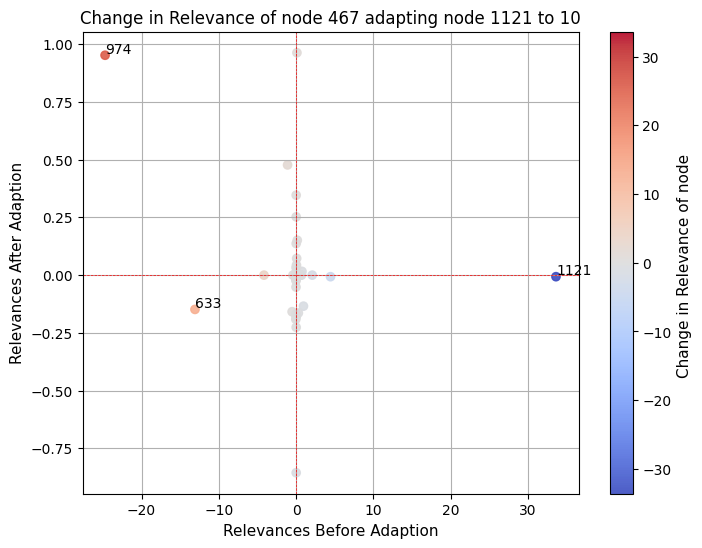

relevances_after_node_node_467adapt_974_6.pt 467 974 relevances_node_467.pt
60.86129 -47.609177
(array([ 633,  974, 1121], dtype=int64),)


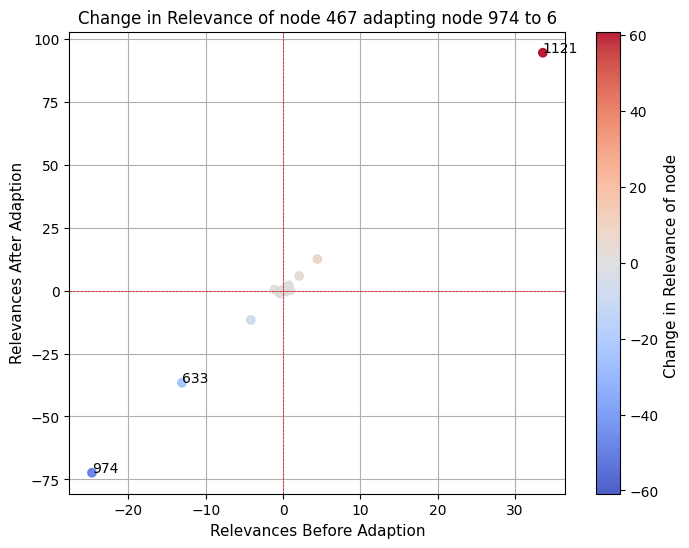

In [93]:
path = 'out/AIFB/RGAT_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_node_node_")]
rel_before = [file for file in fil if file.startswith("relevances_node_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('node_node_')[1].split('adapt')[0]
    adapt_node = rel.split('adapt_')[1].split('_')[0]
    to_node = rel.split('adapt_')[1].split('_')[1].split('.')[0]
    for rel2 in rel_before:
        

        if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = ra - rb
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 10

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            print(nonzero_indices)
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                rb,
                ra,
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            # Add index labels for non-zero relevances
            label_offset = 0.01
            for idx in nonzero_indices[0]:
                plt.text(
                    rb[idx] + label_offset,
                    ra[idx] + label_offset,
                    str(idx),
                    fontsize=10
                )

            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting node {} to {}'.format(node_name, adapt_node, to_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance of node ', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

## Edges

relevances_after_edge_edge_1758_2512adapt_tensor([   0, 2512])_4.pt 1758  2512 relevances_edge_1758.pt
[[-3.01413307e+01 -3.01403427e+01  1.00000000e+01  0.00000000e+00]
 [-1.62462463e+01 -1.65154591e+01  2.40000000e+01  0.00000000e+00]
 [ 2.10791267e-02  2.10742336e-02  2.60000000e+01  0.00000000e+00]
 ...
 [ 1.91000977e+01  1.96797752e+01  2.51200000e+03  2.00000000e+01]
 [ 1.72890909e-02  1.72890909e-02  2.53800000e+03  2.00000000e+01]
 [ 4.34712350e-01  4.35833305e-01  2.76200000e+03  2.00000000e+01]]
-5.8584133512340486e-05
3.0086135864257812 -6.2762451171875
non : 1


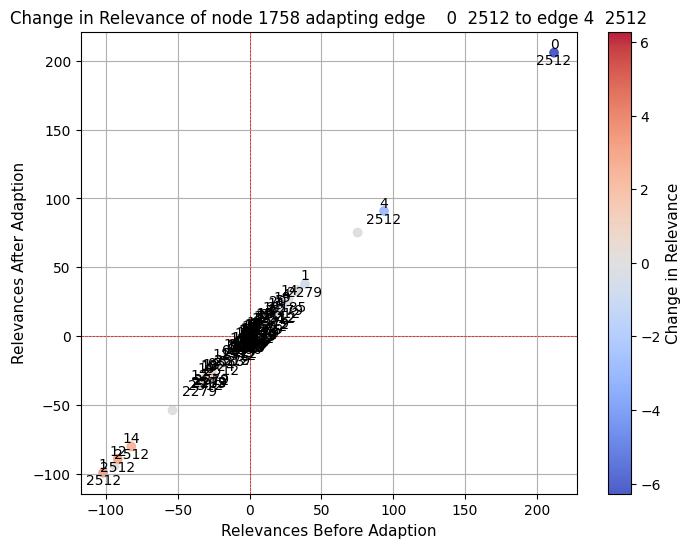

relevances_after_edge_edge_1758_2512adapt_tensor([   1, 2512])_13.pt 1758  2512 relevances_edge_1758.pt
[[-2.87038193e+01 -3.01403427e+01  1.00000000e+01  0.00000000e+00]
 [-6.59281445e+00 -1.65154591e+01  2.40000000e+01  0.00000000e+00]
 [ 2.04529315e-02  2.10742336e-02  2.60000000e+01  0.00000000e+00]
 ...
 [ 3.27288127e-03  1.96797752e+01  2.51200000e+03  2.00000000e+01]
 [ 1.67794619e-02  1.72890909e-02  2.53800000e+03  2.00000000e+01]
 [ 4.05959785e-01  4.35833305e-01  2.76200000e+03  2.00000000e+01]]
3.1967014365363866e-05
101.90926270931959 -211.88880905508995
non : 1


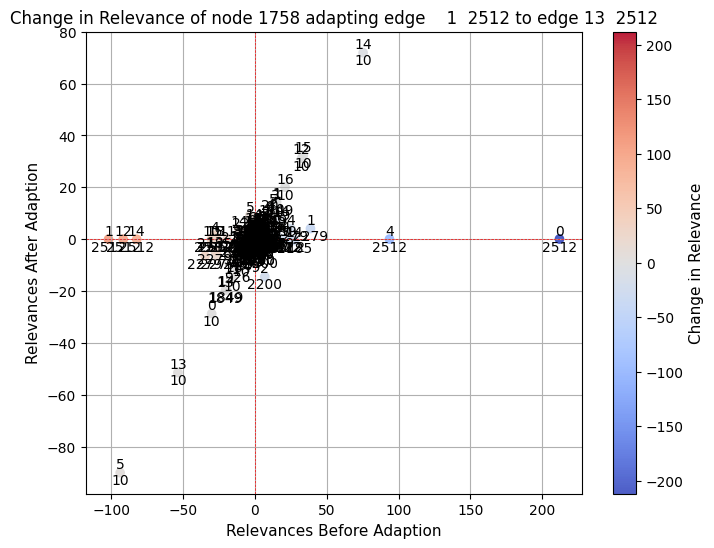

relevances_after_edge_edge_2380_782adapt_tensor([  0, 782])_13.pt 2380  782 relevances_edge_2380.pt
[[ 2.80083902e-03  2.70388531e-03  2.60000000e+01  0.00000000e+00]
 [-7.43196113e-03 -7.23418128e-03  5.50000000e+01  0.00000000e+00]
 [ 6.08363468e-03  5.88673213e-03  9.80000000e+01  0.00000000e+00]
 ...
 [-3.87904644e-01 -9.83184576e-01  2.38000000e+03  2.00000000e+01]
 [ 1.12796304e-04  1.09024229e-04  2.47400000e+03  2.00000000e+01]
 [ 3.14148331e+00  3.52384031e-01  2.70600000e+03  2.00000000e+01]]
-4.680323945649434e-05
698.0045776367188 -1274.8011779785156
non : 1


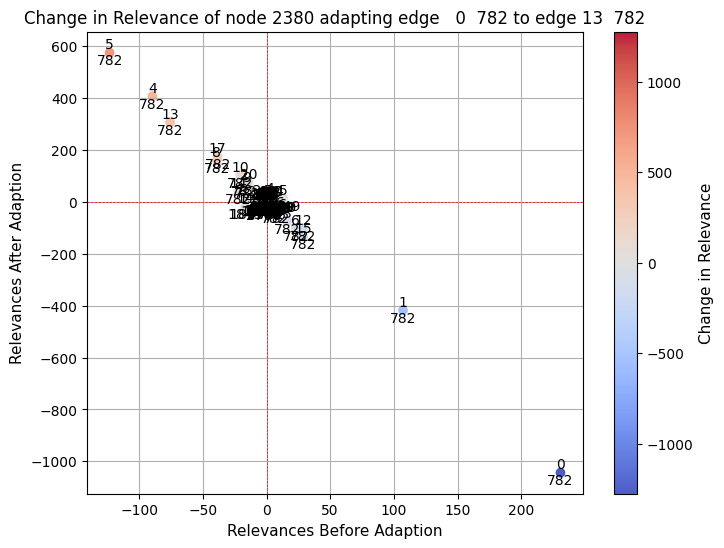

relevances_after_edge_edge_2380_782adapt_tensor([  5, 782])_8.pt 2380  782 relevances_edge_2380.pt
[[ 2.70388531e-03  2.70388531e-03  2.60000000e+01  0.00000000e+00]
 [-7.23418128e-03 -7.23418128e-03  5.50000000e+01  0.00000000e+00]
 [ 5.88673213e-03  5.88673213e-03  9.80000000e+01  0.00000000e+00]
 ...
 [-9.83184576e-01 -9.83184576e-01  2.38000000e+03  2.00000000e+01]
 [ 1.09024229e-04  1.09024229e-04  2.47400000e+03  2.00000000e+01]
 [ 3.52384031e-01  3.52384031e-01  2.70600000e+03  2.00000000e+01]]
0.0
relevances_after_edge_edge_467_1121adapt_tensor([   1, 1121])_0.pt 467  1121 relevances_edge_467.pt
[[-8.52991283e-01 -8.35865021e-01  2.40000000e+01  0.00000000e+00]
 [-5.81979926e-04 -5.61594497e-04  2.60000000e+01  0.00000000e+00]
 [ 1.42254226e-03  1.37337402e-03  5.50000000e+01  0.00000000e+00]
 ...
 [ 1.18980825e-01 -7.84596622e-01  2.37700000e+03  2.00000000e+01]
 [-4.45757687e-05 -4.30139044e-05  2.47400000e+03  2.00000000e+01]
 [ 1.11259697e-02 -8.54333282e-01  2.60100000e+03

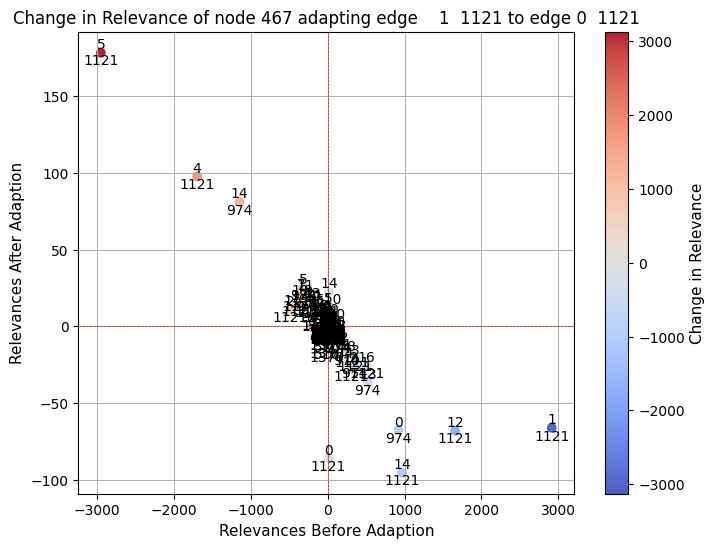

relevances_after_edge_edge_467_1121adapt_tensor([   5, 1121])_18.pt 467  1121 relevances_edge_467.pt
[[-8.68201077e-01 -8.35865021e-01  2.40000000e+01  0.00000000e+00]
 [-5.91529417e-04 -5.61594497e-04  2.60000000e+01  0.00000000e+00]
 [ 1.44739309e-03  1.37337402e-03  5.50000000e+01  0.00000000e+00]
 ...
 [ 5.38169503e-01 -7.84596622e-01  2.37700000e+03  2.00000000e+01]
 [-4.53074026e-05 -4.30139044e-05  2.47400000e+03  2.00000000e+01]
 [ 1.16561987e-01 -8.54333282e-01  2.60100000e+03  2.00000000e+01]]
0.0020896417890980956
2999.062213897705 -2847.782569885254
non : 1


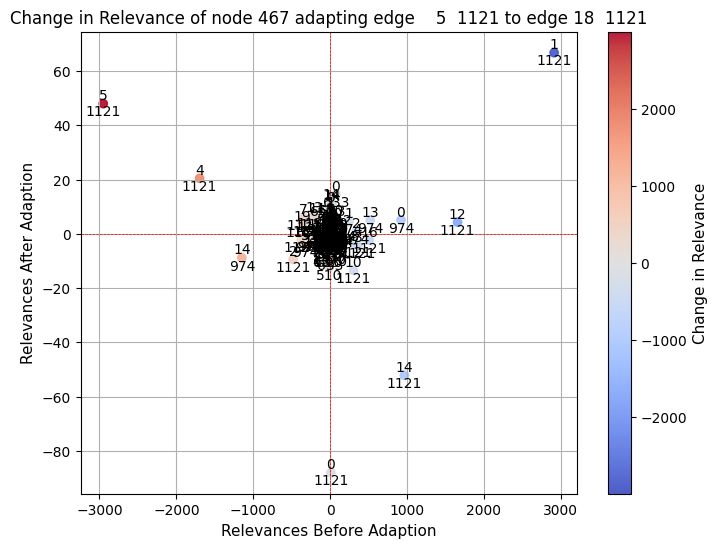

In [94]:
path = 'out/AIFB/RGAT_no_emb/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_edge_edge_")]
rel_before = [file for file in fil if file.startswith("relevances_edge_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_edge_')[1].split('_')[0]
    adapt_edge_name = rel.split('[')[1].split(',')[0]
    to_edge = rel.split('_')[-1].split('.')[0]
    adapt_node = rel.split(',')[-1].split(']')[0]
    XX,YY = np.meshgrid(np.arange(ra.shape[1]),np.arange(ra.shape[0]))
    
    for rel2 in rel_before:
        

         if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            table = np.vstack((ra.ravel(),rb.ravel(),XX.ravel(),YY.ravel())).T
            table = table[table[:,0] != 0]
            print(table)
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = table[:,0] - table[:,1]
            print(change.sum())
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 0.08

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            print('non :',len(nonzero_indices))
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                table[:,1],
                table[:,0],
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            

            # Add index labels for each point
            for i, (idx1, idx2) in enumerate(zip(table[:,3][nonzero_indices], table[:,2][nonzero_indices])):
                label = f'{int(idx1)}\n{int(idx2)}'  # Combine the two indices into one label
                plt.text(table[:,1][nonzero_indices][i], table[:,0][nonzero_indices][i], label, fontsize=10, ha='center', va='center')



            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting edge {} {} to edge {} {}'.format(node_name, adapt_edge_name, adapt_node, to_edge, adapt_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

# RGAT

### Auswertung Relevanzen

In [99]:
path = 'out/AIFB/RGAT_no_emb/relevances/'
dist = 'out/AIFB/RGAT_emb/DistMult/relevances/'
transe = 'out/AIFB/RGAT_emb/TransE/relevances/'
transh = 'out/AIFB/RGAT_emb/TransH/relevances/'
list_paths = [path,dist,transe,transh]
fil = os.listdir(path)
dist2 = os.listdir(dist)
transe2 = os.listdir(transe)
transh2 = os.listdir(transh)
rel_before = [file for file in fil if file.startswith("relevances_edge_")]
rel_bef_dist = [file for file in dist2 if file.startswith("relevances_edge_")]
rel_bef_transe = [file for file in transe2 if file.startswith("relevances_edge_")]
rel_bef_transh = [file for file in transh2 if file.startswith("relevances_edge_")]
count_path= 0
for l in [rel_before,rel_bef_dist,rel_bef_transe,rel_bef_transh]:
    path2 = list_paths[count_path]
    count_path += 1
    print('######',path2,'######')
    mean_rel_ges = 0 
    count_zero_ges = 0
    count_positive_ges = 0
    count_negative_ges = 0 
    mean_positive = 0
    mean_negative = 0
    count = 0
    #print(path2)
    for rel in l:
        rb = torch.load(path2 + rel)
        #print(path2, rel)
        #print(rb.sum())
        rb_non_zero = rb[rb != 0]
        rb_count_zero = rb[rb == 0]
        mean_rel= rb_non_zero.mean(axis=0)
        rb_count_positive = rb[rb > 0]
        rb_count_negative = rb[rb < 0]
        mean_rel_ges += mean_rel
        #print(mean_rel)
        count_zero_ges += len(rb_count_zero)
        count_positive_ges += len(rb_count_positive)
        count_negative_ges += len(rb_count_negative)
        count += 1
        mean_positive += rb_count_positive.mean(axis=0)
        mean_negative += rb_count_negative.mean(axis=0)
    mean_positive_ges = mean_positive / count
    mean_negative_ges = mean_negative / count
    percentage_zero =   count_zero_ges / (len(rb)* len(l))
    percentage_positive = count_positive_ges / (len(rb)* len(l))
    percentage_negative = count_negative_ges / (len(rb)* len(l))
    mean_rel_ges = mean_rel_ges / count
    print('Average_relevance without zero: ',mean_rel_ges, '\n',
            'Proportion 0 relevance: ', percentage_zero, '\n',
            'Proportion positive relevance: ', percentage_positive, '\n',
            'Proportion negative relevance: ',percentage_negative, '\n',
            'Average positive relevance: ', mean_positive_ges, '\n',
            'Average negative relevance: ',mean_negative_ges)

###### out/AIFB/RGAT_no_emb/relevances/ ######
Average_relevance without zero:  tensor(0.0022) 
 Proportion 0 relevance:  2759.1944444444443 
 Proportion positive relevance:  38.3505291005291 
 Proportion negative relevance:  37.455026455026456 
 Average positive relevance:  tensor(1.3921) 
 Average negative relevance:  tensor(-1.5453)
###### out/AIFB/RGAT_emb/DistMult/relevances/ ######
Average_relevance without zero:  tensor(0.0022) 
 Proportion 0 relevance:  2759.1944444444443 
 Proportion positive relevance:  38.69444444444444 
 Proportion negative relevance:  37.111111111111114 
 Average positive relevance:  tensor(5.4885) 
 Average negative relevance:  tensor(-5.6480)
###### out/AIFB/RGAT_emb/TransE/relevances/ ######
Average_relevance without zero:  tensor(0.0022) 
 Proportion 0 relevance:  2759.1944444444443 
 Proportion positive relevance:  37.904761904761905 
 Proportion negative relevance:  37.90079365079365 
 Average positive relevance:  tensor(5.5715) 
 Average negative re

# RGAT TransE

In [96]:
model = 'TransE'
csv = readallcsvinpath('out/AIFB/RGAT_emb/')
pred_before = torch.load('out/AIFB/RGAT_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/AIFB/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/AIFB/RGAT_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://www.aifb.uni-karlsruhe.de/Personen/viewPersonOWL/id2137instance
12
17
17
17
17
18
17
18
17
17
17
17
17
12 432 206
[ 1  2  3  7  8 11 14 18 22 23 25 26 27 31 33 34 35]
0.47685185185185186


(array([0, 1, 2, 3], dtype=int64), array([18,  5, 10,  3], dtype=int64))

12
0
pred_after1758adapt_2279_2.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-05 2.2073993e

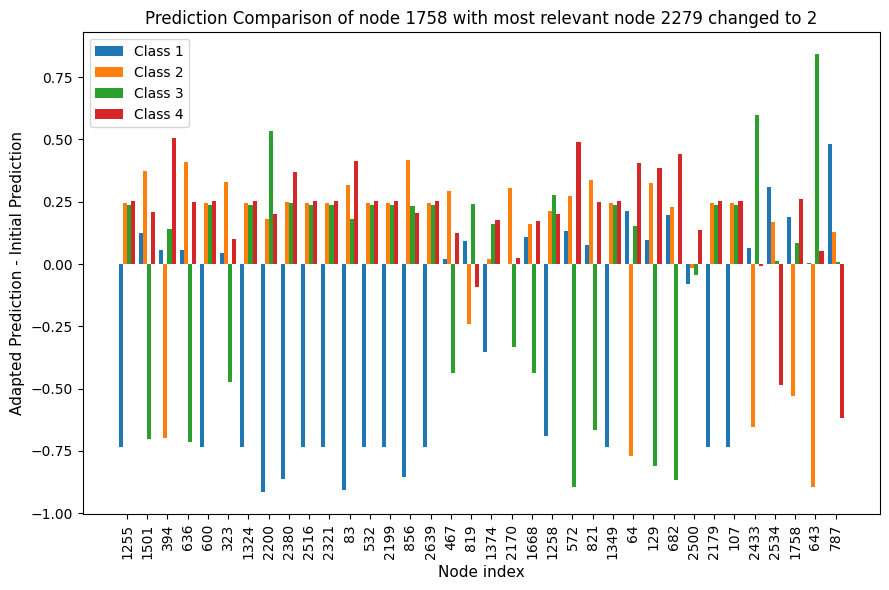

1
pred_after1758adapt_902_10.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-05 2.2073993e-02

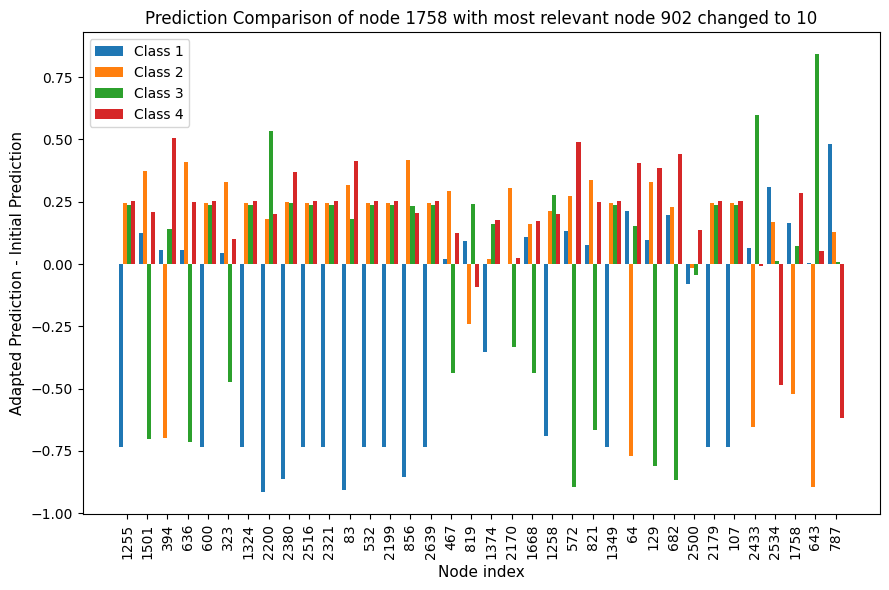

2
pred_after2200adapt_tensor([   4, 1709])_8.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-

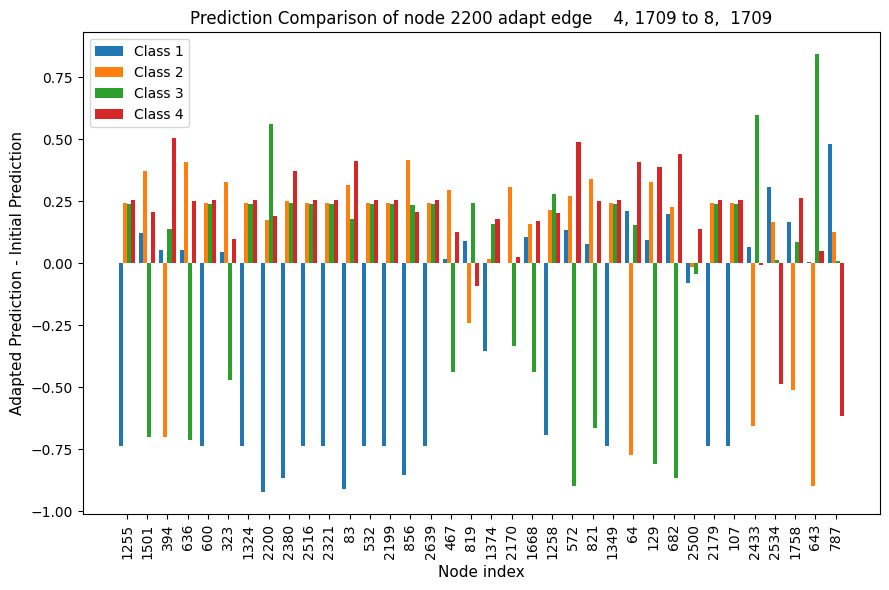

3
pred_after2200adapt_tensor([  12, 1709])_18.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e

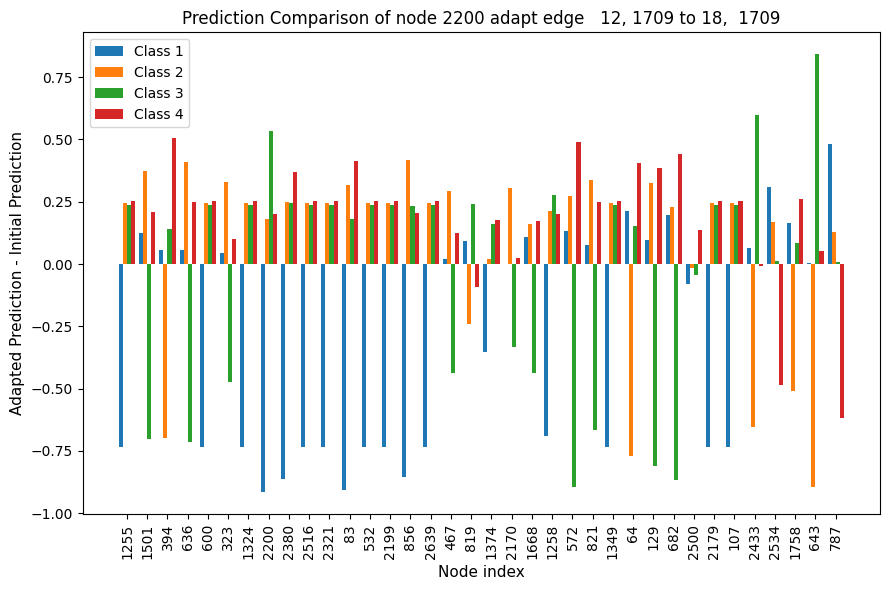

4
pred_after2500adapt_1300_14.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [4.0566301e-01 3.0285364e-01 1.6317837e-01 1.2830494e-01]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-0

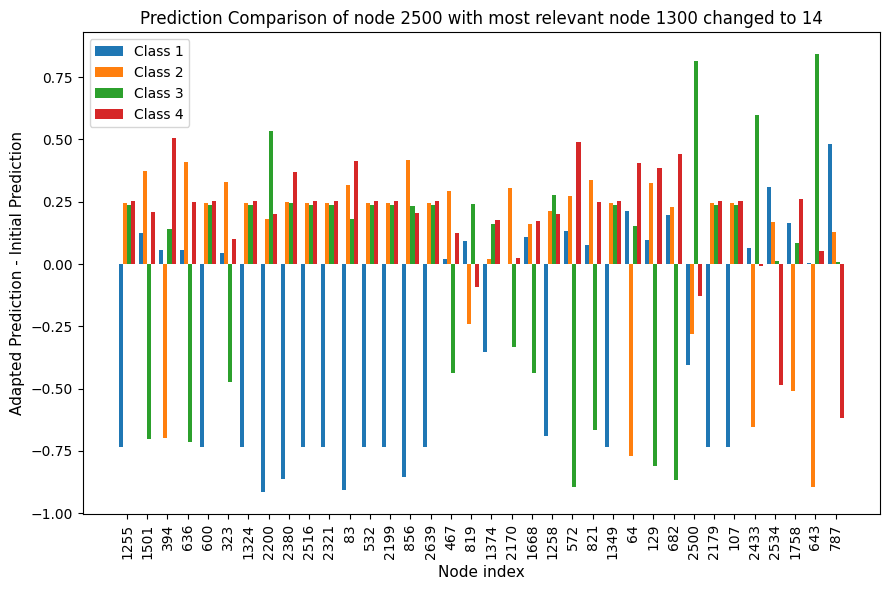

5
pred_after2500adapt_2500_11.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-05 2.2073993e-0

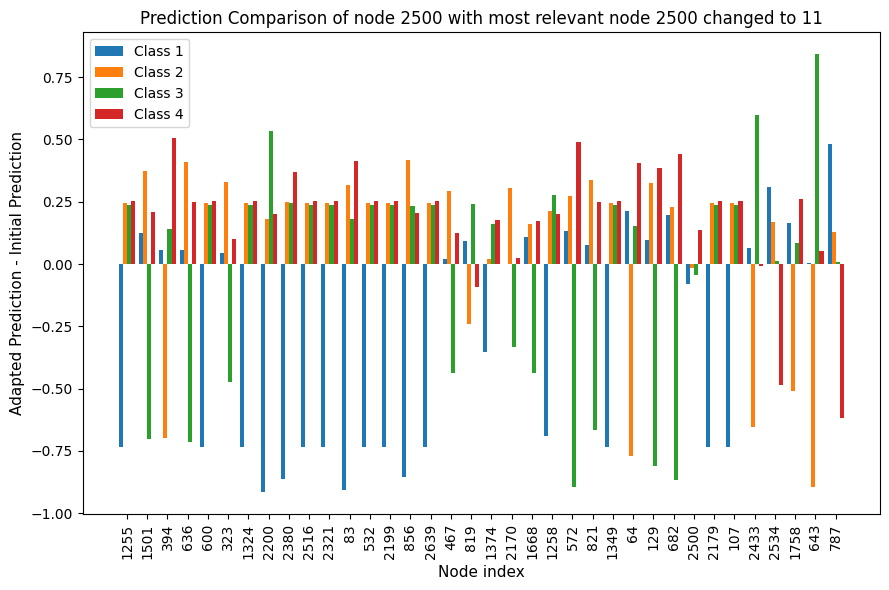

6
pred_after2500adapt_tensor([   1, 1300])_12.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [4.0566301e-01 3.0285364e-01 1.6317837e-01 1.2830494e-01]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e

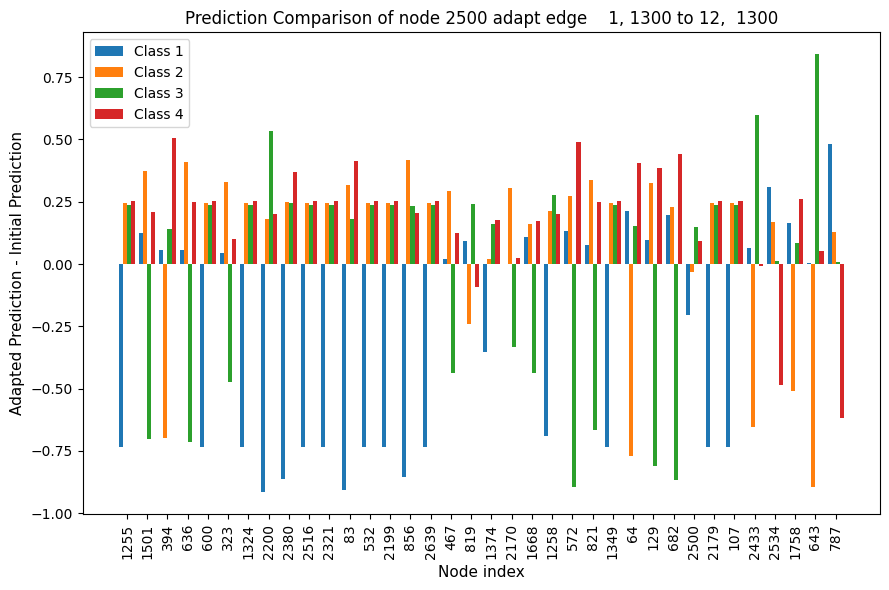

7
pred_after2500adapt_tensor([  5, 677])_13.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-0

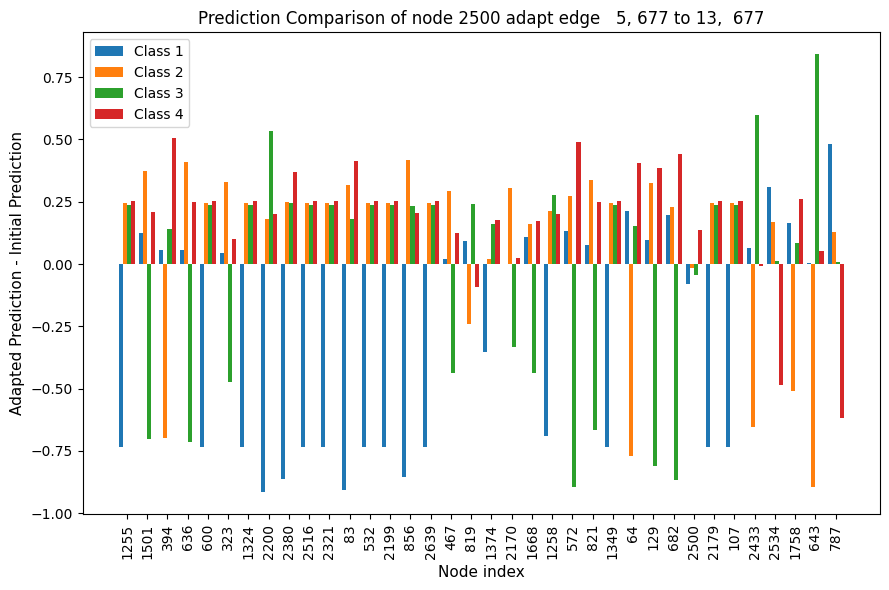

8
pred_after83adapt_2393_5.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-05 2.2073993e-02]


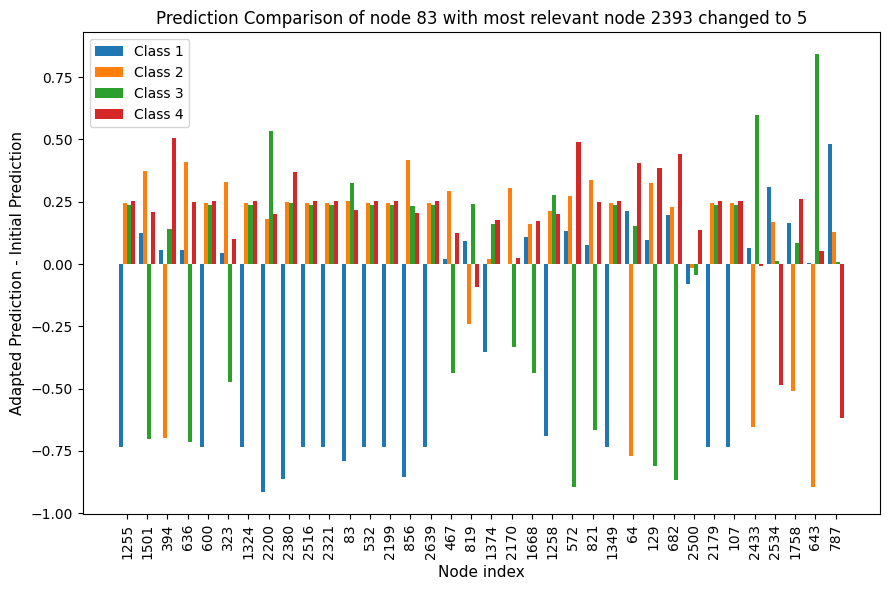

9
pred_after83adapt_83_16.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-05 2.2073993e-02]
 

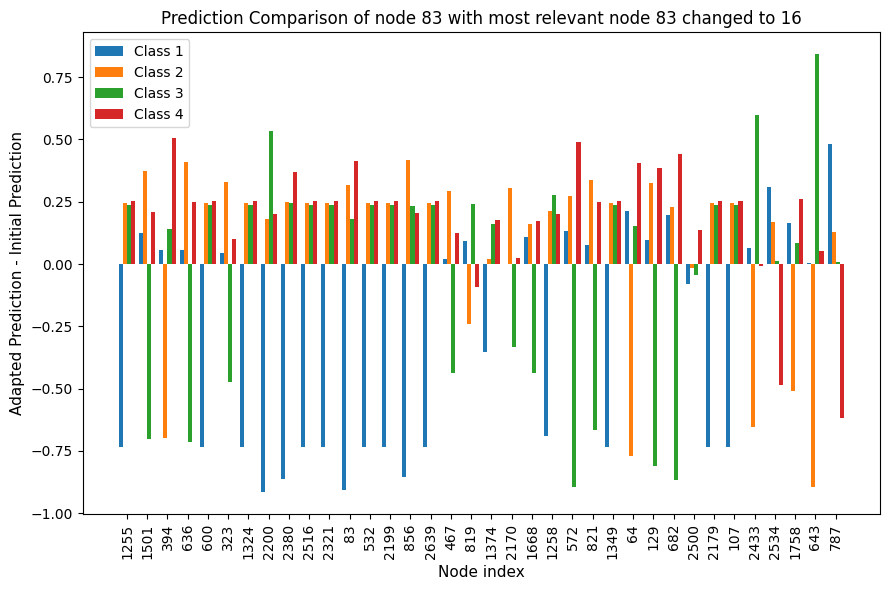

10
pred_after83adapt_tensor([   0, 2393])_17.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-

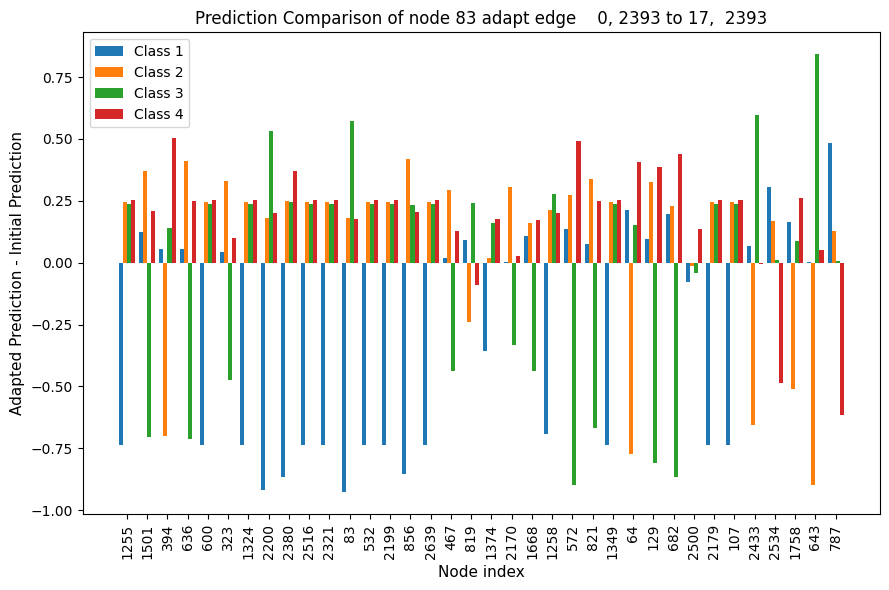

11
pred_after83adapt_tensor([  13, 2393])_14.pt
Prediction Score before:  [[4.3789850e-04 6.6375472e-03 9.9258137e-01 3.4318265e-04]
 [9.0926242e-06 9.5378858e-01 1.4568101e-05 4.6187740e-02]
 [8.8159409e-09 1.8240047e-05 9.9997997e-01 1.7576270e-06]
 [9.9983597e-01 8.8730740e-06 1.3953487e-09 1.5523806e-04]
 [9.9984789e-01 3.8114408e-06 2.7155342e-09 1.4831712e-04]
 [9.9957067e-01 1.0733690e-04 9.6490362e-09 3.2194759e-04]
 [9.6563709e-01 1.2185465e-02 1.0162711e-02 1.2014676e-02]
 [5.8860493e-01 2.0804197e-01 1.6845116e-01 3.4901943e-02]
 [9.7894381e-10 1.5152228e-06 9.9999809e-01 3.4792342e-07]
 [8.5419662e-09 3.6693880e-06 9.9999535e-01 8.9612405e-07]
 [5.5175832e-07 9.9401617e-01 3.0773438e-06 5.9800921e-03]
 [3.9268785e-10 1.1642667e-06 9.9999869e-01 1.1217564e-07]
 [3.8049821e-09 2.6349544e-06 9.9999690e-01 4.8199126e-07]
 [5.3118955e-04 7.6349950e-01 6.1740378e-05 2.3590763e-01]
 [7.0842922e-02 7.5409079e-01 6.6153830e-06 1.7505965e-01]
 [4.6861373e-07 9.7790909e-01 1.6473219e-

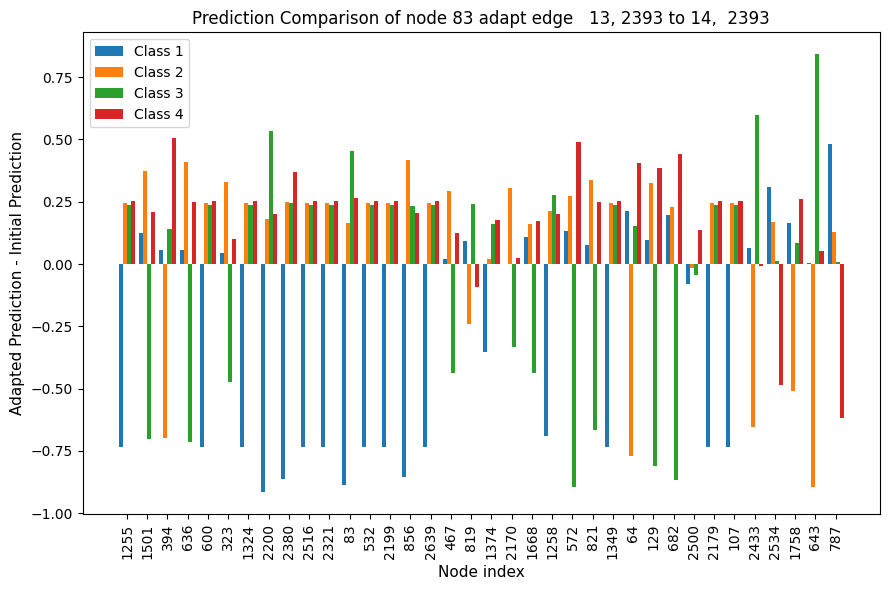

In [97]:
path = 'out/AIFB/RGAT_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(36)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=10)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=11)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

#### Edges

relevances_after_edge_edge_2200_1709adapt_tensor([   4, 1709])_8.pt 2200  1709 relevances_edge_2200.pt
[[-2.19770804e-01 -1.32527304e+00  1.00000000e+01  0.00000000e+00]
 [-4.94593102e-03  6.02656603e-03  2.10000000e+01  0.00000000e+00]
 [-2.40747660e-01 -1.09344684e-02  2.40000000e+01  0.00000000e+00]
 ...
 [-2.74929255e-01  1.75581686e-02  2.77400000e+03  2.00000000e+01]
 [-1.07963802e-03 -1.35202438e-03  2.77600000e+03  2.00000000e+01]
 [ 1.08780313e+00 -3.72648530e-04  2.82300000e+03  2.00000000e+01]]
-0.05165169536121539
56715.38481903076 -62913.80077171326
non : 1


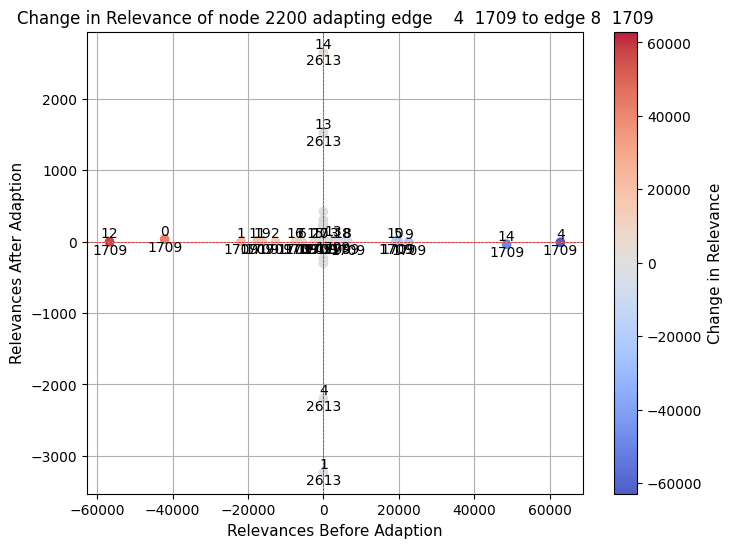

relevances_after_edge_edge_2200_1709adapt_tensor([  12, 1709])_18.pt 2200  1709 relevances_edge_2200.pt
[[-2.83338428e-01 -1.32527304e+00  1.00000000e+01  0.00000000e+00]
 [-5.72159281e-03  6.02656603e-03  2.10000000e+01  0.00000000e+00]
 [ 3.98254134e-02 -1.09344684e-02  2.40000000e+01  0.00000000e+00]
 ...
 [-2.68244684e-01  1.75581686e-02  2.77400000e+03  2.00000000e+01]
 [-1.43080112e-03 -1.35202438e-03  2.77600000e+03  2.00000000e+01]
 [ 1.82264417e-01 -3.72648530e-04  2.82300000e+03  2.00000000e+01]]
-0.05111953899177024
56716.63663339615 -62910.37546253204
non : 1


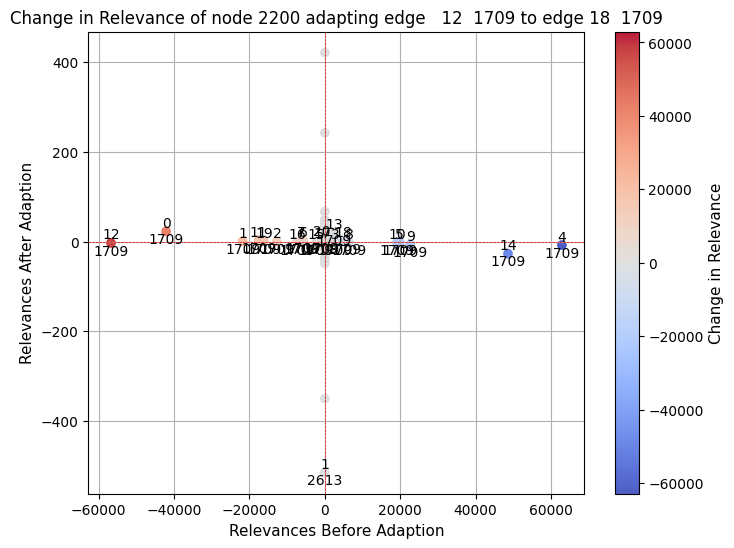

relevances_after_edge_edge_2500_1300adapt_tensor([   1, 1300])_12.pt 2500  1300 relevances_edge_2500.pt
[[ 4.06068802e-01 -1.43702980e-02  2.60000000e+01  0.00000000e+00]
 [ 7.97794461e-02 -9.22327995e-01  4.14000000e+02  0.00000000e+00]
 [-1.22406140e-01  3.42235327e+00  6.33000000e+02  0.00000000e+00]
 ...
 [ 3.14192125e-03 -4.41641896e-04  2.47400000e+03  2.00000000e+01]
 [-1.58255041e+00  2.00820831e+02  2.50000000e+03  2.00000000e+01]
 [-6.48654476e-02  5.29623489e+01  2.70000000e+03  2.00000000e+01]]
-0.0014482241167570464
1496.2283979654312 -1475.5740941762924
non : 1


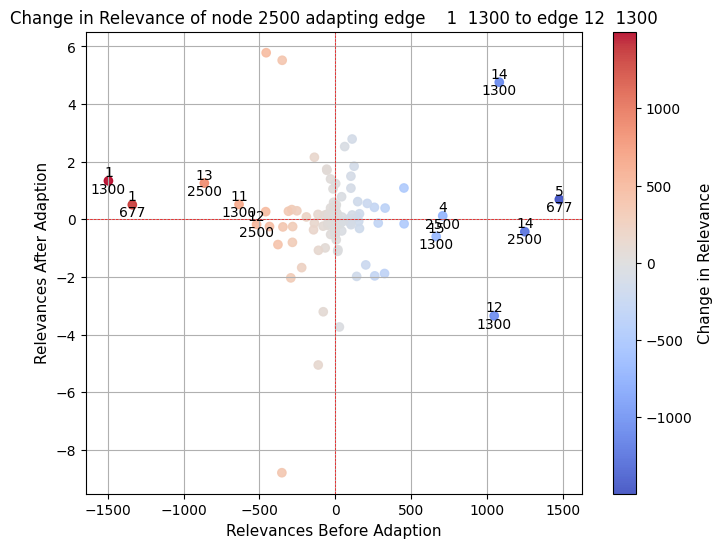

relevances_after_edge_edge_2500_677adapt_tensor([  5, 677])_13.pt 2500  677 relevances_edge_2500.pt
[[-7.31932698e-03 -1.43702980e-02  2.60000000e+01  0.00000000e+00]
 [-4.80442792e-02 -9.22327995e-01  4.14000000e+02  0.00000000e+00]
 [-2.04586458e+00  3.42235327e+00  6.33000000e+02  0.00000000e+00]
 ...
 [-1.55405689e-03 -4.41641896e-04  2.47400000e+03  2.00000000e+01]
 [-1.06295216e+00  2.00820831e+02  2.50000000e+03  2.00000000e+01]
 [-9.18161944e-02  5.29623489e+01  2.70000000e+03  2.00000000e+01]]
-0.0014409215582418256
1497.3806035518646 -1477.1611835360527
non : 1


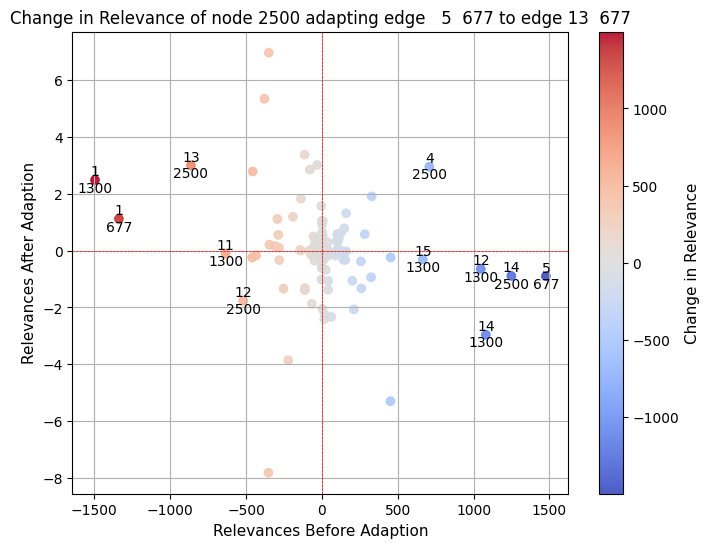

relevances_after_edge_edge_83_2393adapt_tensor([   0, 2393])_17.pt 83  2393 relevances_edge_83.pt
[[-3.71589139e-02 -2.54355788e-01  2.40000000e+01  0.00000000e+00]
 [ 3.76789495e-02  1.14403456e-03  2.60000000e+01  0.00000000e+00]
 [ 2.93947518e-01 -1.20421402e+02  8.30000000e+01  0.00000000e+00]
 ...
 [ 2.98930681e-04 -1.26558196e-04  2.47400000e+03  2.00000000e+01]
 [ 3.22272442e-03 -8.25914383e+00  2.64100000e+03  2.00000000e+01]
 [-3.60273494e-04  2.92310100e-02  2.82300000e+03  2.00000000e+01]]
0.0004122791424379102
611.1784934997559 -952.7894093990326
non : 1


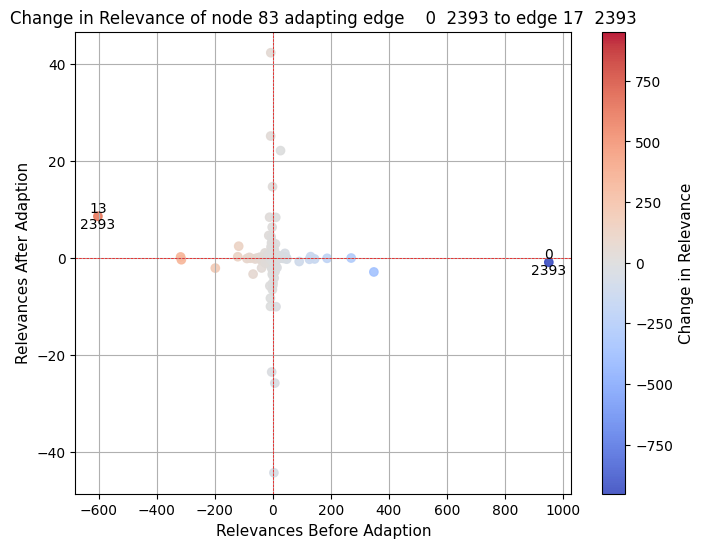

relevances_after_edge_edge_83_2393adapt_tensor([  13, 2393])_14.pt 83  2393 relevances_edge_83.pt
[[-5.55355325e-02 -2.54355788e-01  2.40000000e+01  0.00000000e+00]
 [ 7.18054324e-02  1.14403456e-03  2.60000000e+01  0.00000000e+00]
 [ 3.09036940e-01 -1.20421402e+02  8.30000000e+01  0.00000000e+00]
 ...
 [ 6.17107027e-04 -1.26558196e-04  2.47400000e+03  2.00000000e+01]
 [ 6.89912401e-03 -8.25914383e+00  2.64100000e+03  2.00000000e+01]
 [-5.89545642e-04  2.92310100e-02  2.82300000e+03  2.00000000e+01]]
0.00039995258885028306
601.2388288974762 -951.720062315464
non : 1


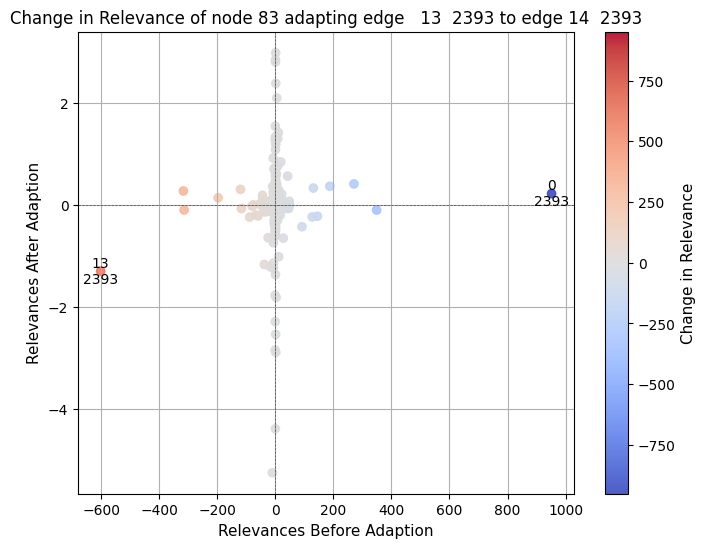

In [100]:
path = 'out/AIFB/RGAT_emb/'+model+'/relevances/'

fil = os.listdir(path)

rel_after = [file for file in fil if file.startswith("relevances_after_edge_edge_")]
rel_before = [file for file in fil if file.startswith("relevances_edge_")]
dfs = []
for rel in rel_after:
    ra = torch.load(path+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_edge_')[1].split('_')[0]
    adapt_edge_name = rel.split('[')[1].split(',')[0]
    to_edge = rel.split('_')[-1].split('.')[0]
    adapt_node = rel.split(',')[-1].split(']')[0]
    XX,YY = np.meshgrid(np.arange(ra.shape[1]),np.arange(ra.shape[0]))
    
    for rel2 in rel_before:
        

         if node_name in rel2:
            print(rel, node_name, adapt_node, rel2)
            rb = torch.load(path+rel2).to_dense().detach().numpy()
            table = np.vstack((ra.ravel(),rb.ravel(),XX.ravel(),YY.ravel())).T
            table = table[table[:,0] != 0]
            print(table)
            #nonzero_indices =  np.where((ra <= -0.05) | (ra >= 0.05) )
            change = table[:,0] - table[:,1]
            print(change.sum())
            if change.sum() == 0:
                continue
            print(change.max(), change.min())
            # Set a threshold for significant change
            threshold = 500

            # Filter out points with insignificant change
            nonzero_indices = np.where(np.abs(change) > threshold)
            print('non :',len(nonzero_indices))
            #nonzero_indices = np.where((change<= -0.00001))#|(change>= 0.000001))
            plt.figure(figsize=(8, 6))
            if change[nonzero_indices].sum() == 0:
                continue
            max_abs_change = np.max(np.abs(change[nonzero_indices]))
            scatter = plt.scatter(
                table[:,1],
                table[:,0],
                c=change,
                cmap='coolwarm',
                alpha=0.9,
                norm=Normalize(vmin=-max_abs_change, vmax=max_abs_change)
            )

            

            # Add index labels for each point
            for i, (idx1, idx2) in enumerate(zip(table[:,3][nonzero_indices], table[:,2][nonzero_indices])):
                label = f'{int(idx1)}\n{int(idx2)}'  # Combine the two indices into one label
                plt.text(table[:,1][nonzero_indices][i], table[:,0][nonzero_indices][i], label, fontsize=10, ha='center', va='center')



            # Set x-axis label
            plt.xlabel('Relevances Before Adaption', fontsize=11)

            # Set y-axis label
            plt.ylabel('Relevances After Adaption', fontsize=11)
            plt.title(('Change in Relevance of node {} adapting edge {} {} to edge {} {}'.format(node_name, adapt_edge_name, adapt_node, to_edge, adapt_node)))
            # Add a colorbar to indicate change
            cbar = plt.colorbar(scatter)
            cbar.set_label('Change in Relevance', fontsize=11)

            # Set plot limits and add grid
            # plt.xlim(-2, 4)
            # plt.ylim(-2, 4)
            plt.axhline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.axvline(0, color='red', linewidth=0.5, linestyle='dashed')
            plt.grid(True)

            # Show the plot
            plt.show()

relevances_node_107.pt 107  2393 relevances_edge_856.pt


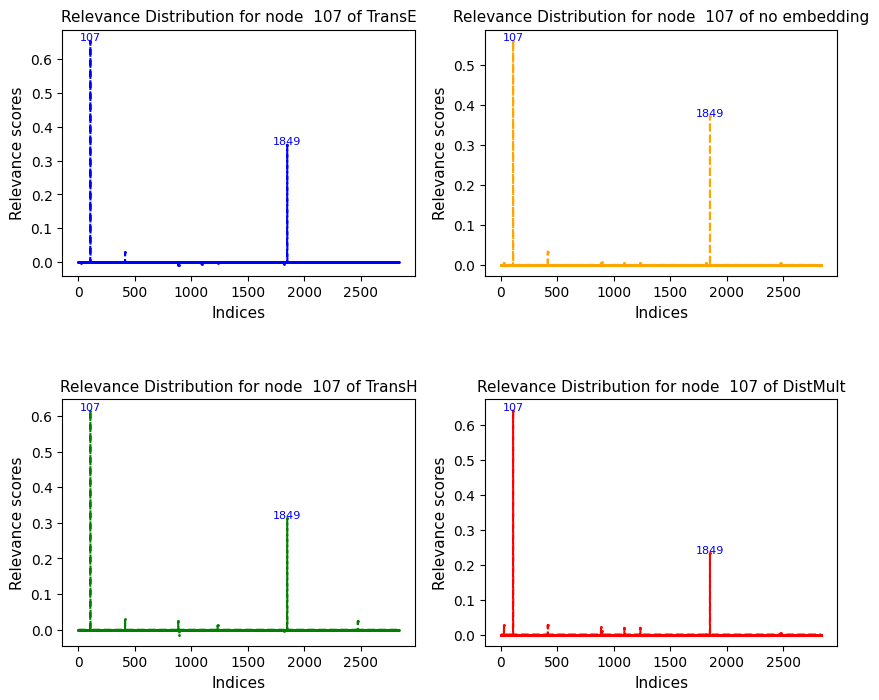

<Figure size 900x600 with 0 Axes>

relevances_node_1255.pt 1255  2393 relevances_edge_856.pt


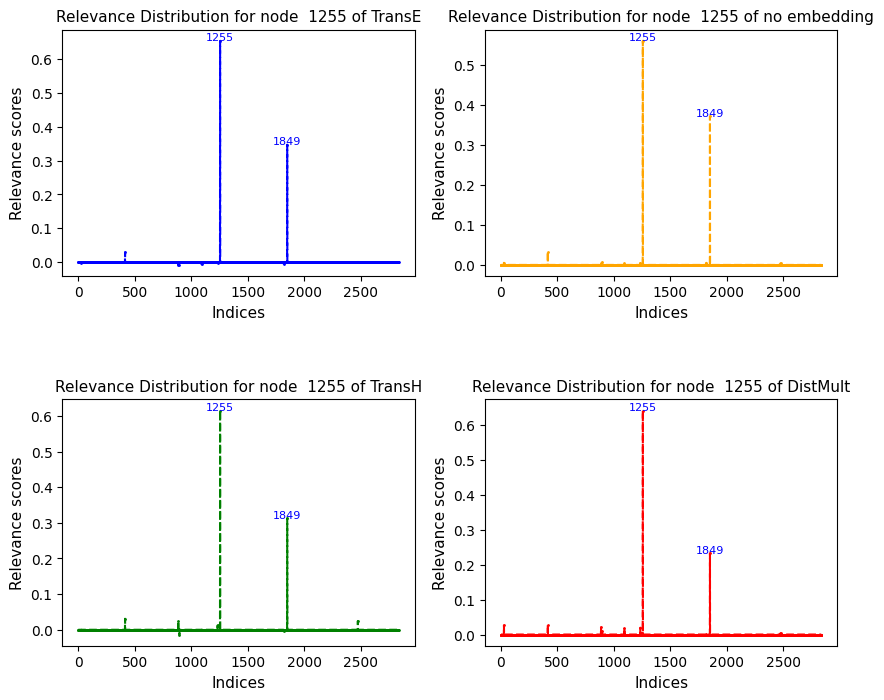

<Figure size 900x600 with 0 Axes>

relevances_node_1258.pt 1258  2393 relevances_edge_856.pt


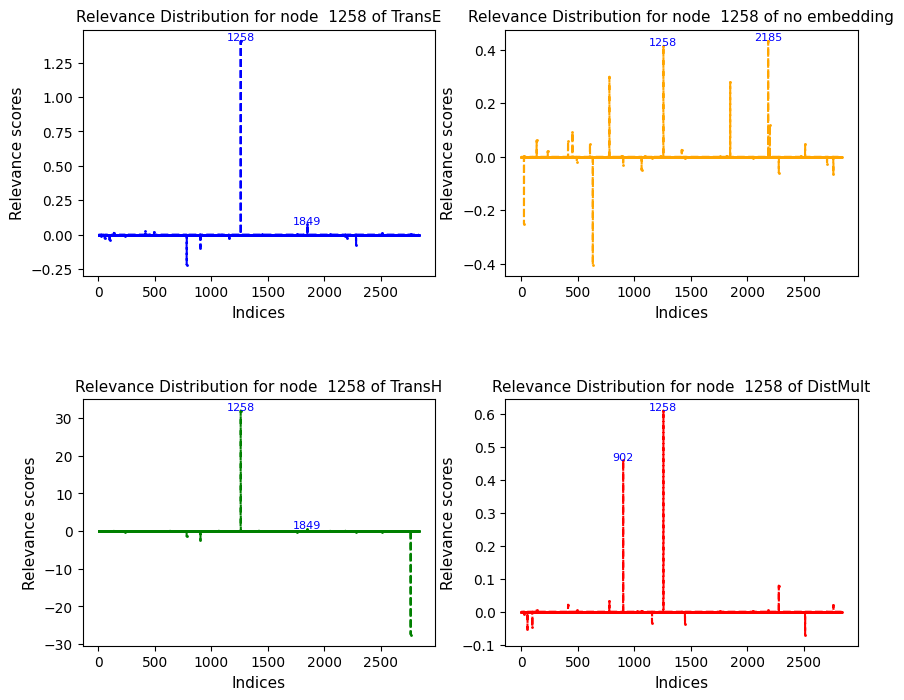

<Figure size 900x600 with 0 Axes>

relevances_node_129.pt 129  2393 relevances_edge_856.pt


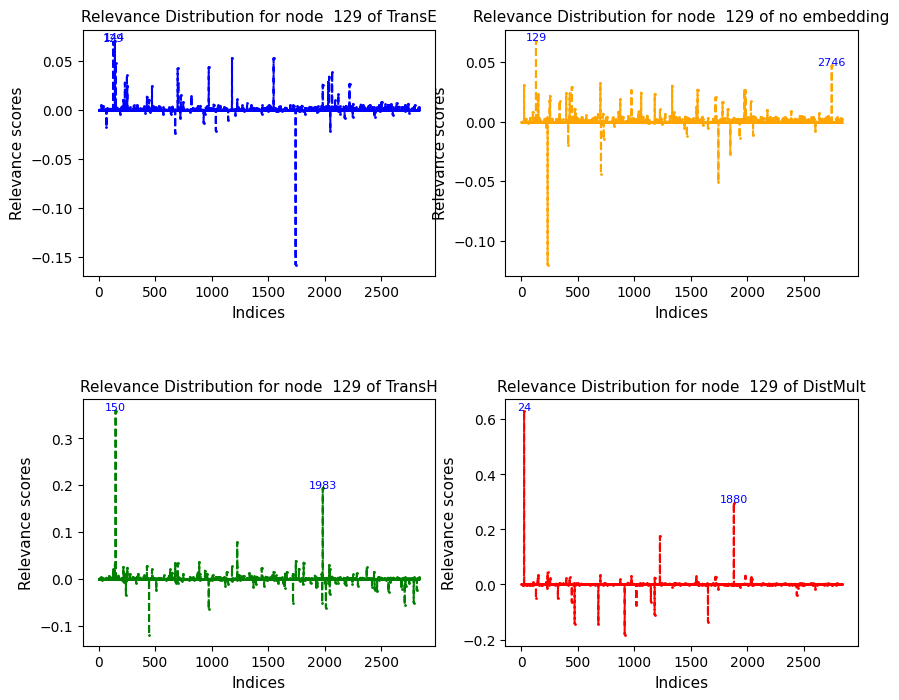

<Figure size 900x600 with 0 Axes>

relevances_node_1324.pt 1324  2393 relevances_edge_856.pt


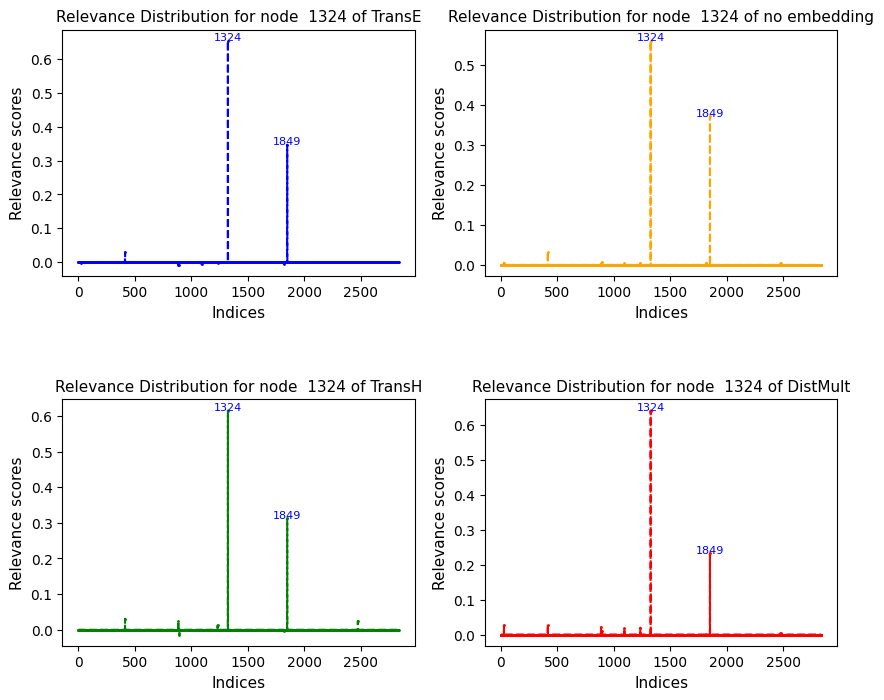

<Figure size 900x600 with 0 Axes>

relevances_node_1349.pt 1349  2393 relevances_edge_856.pt


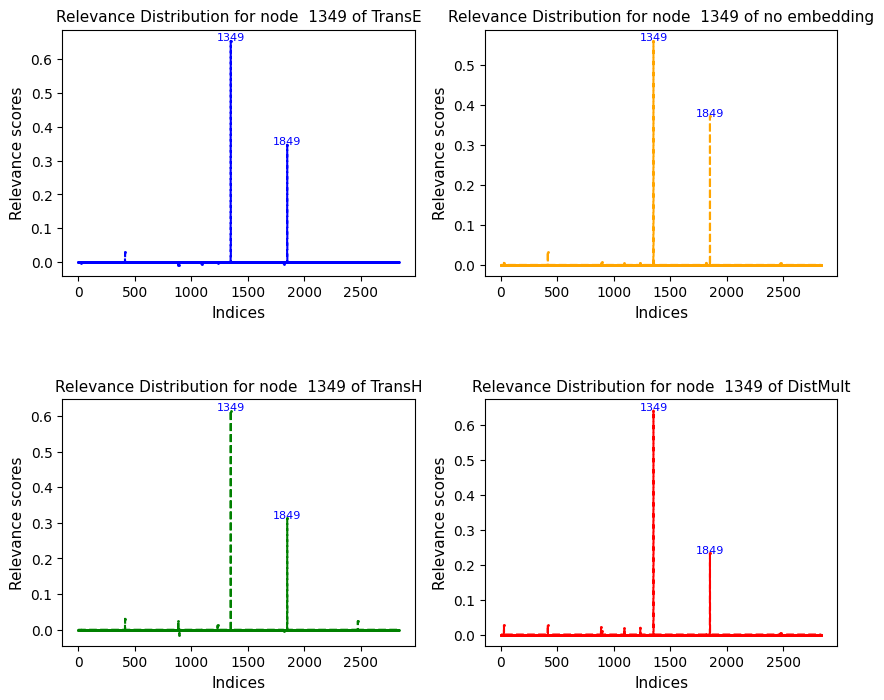

<Figure size 900x600 with 0 Axes>

relevances_node_1374.pt 1374  2393 relevances_edge_856.pt


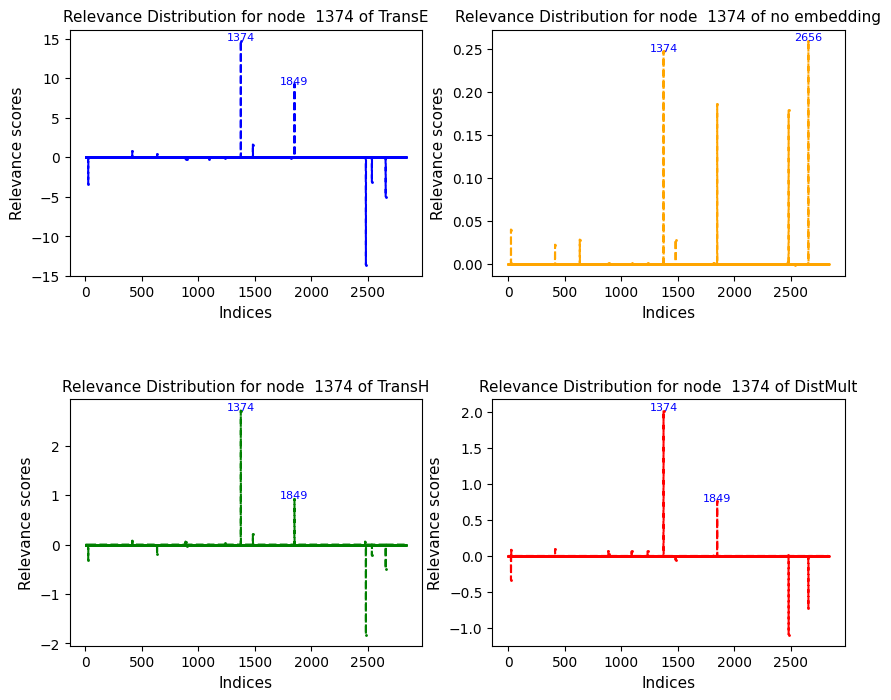

<Figure size 900x600 with 0 Axes>

relevances_node_1501.pt 1501  2393 relevances_edge_856.pt


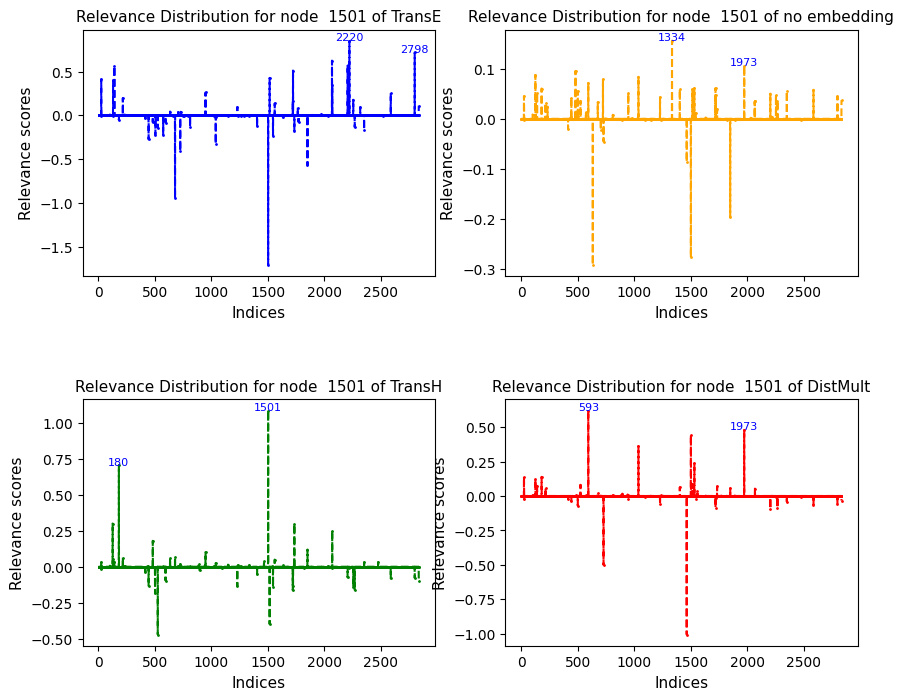

<Figure size 900x600 with 0 Axes>

relevances_node_1668.pt 1668  2393 relevances_edge_856.pt


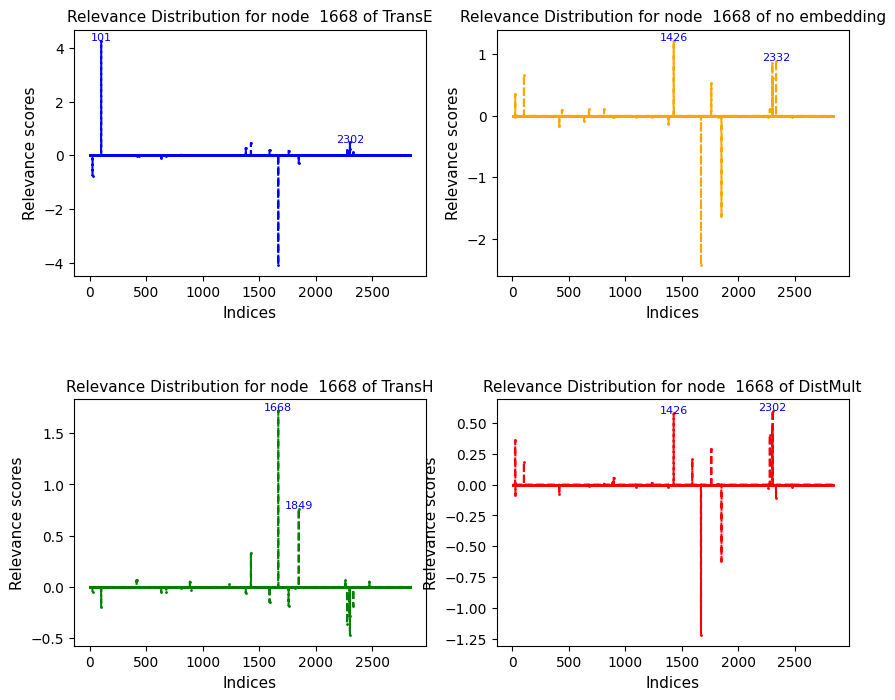

<Figure size 900x600 with 0 Axes>

relevances_node_1758.pt 1758  2393 relevances_edge_856.pt


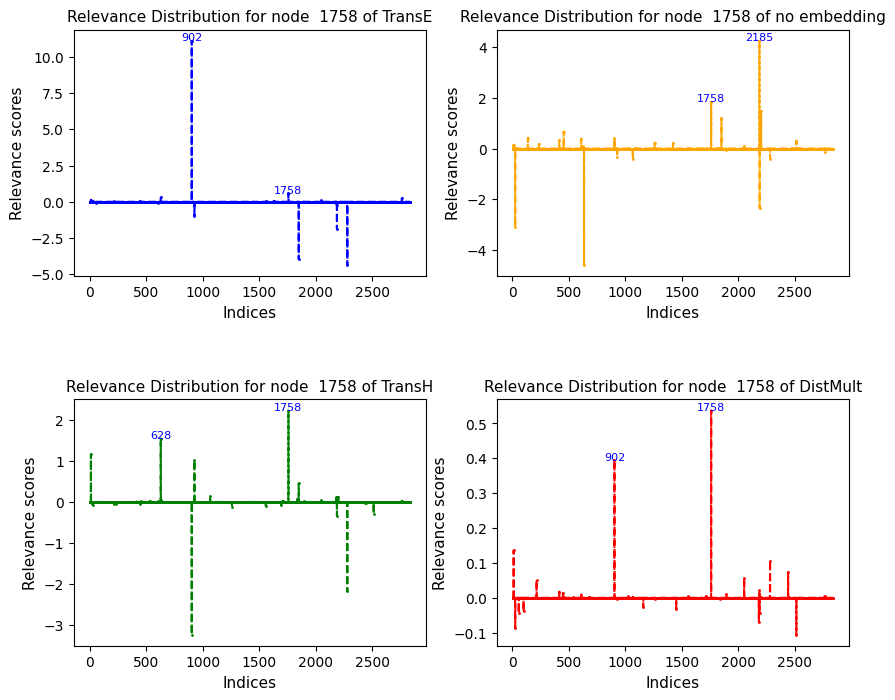

<Figure size 900x600 with 0 Axes>

relevances_node_2170.pt 2170  2393 relevances_edge_856.pt


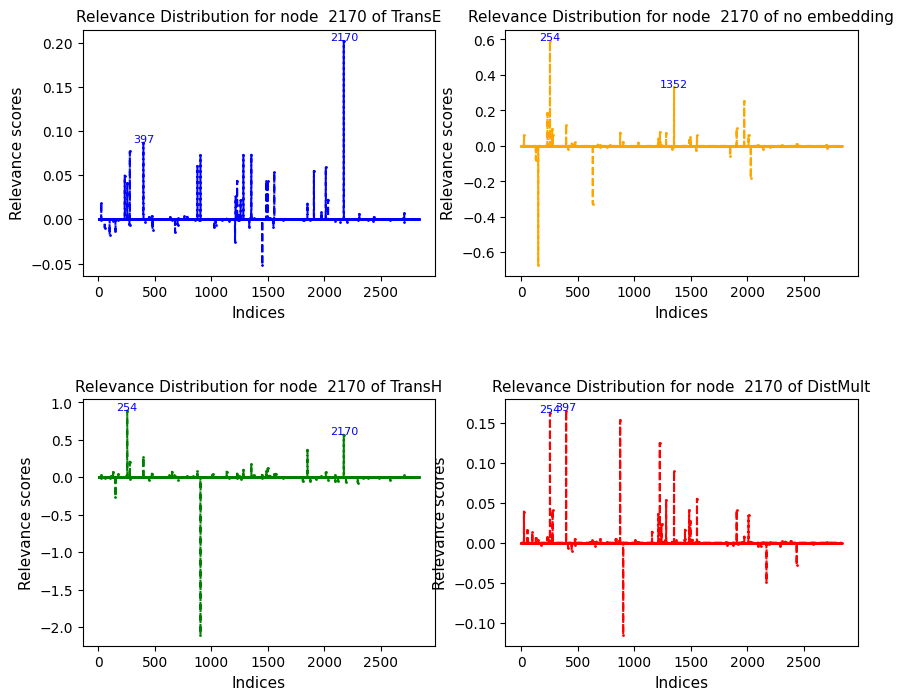

<Figure size 900x600 with 0 Axes>

relevances_node_2179.pt 2179  2393 relevances_edge_856.pt


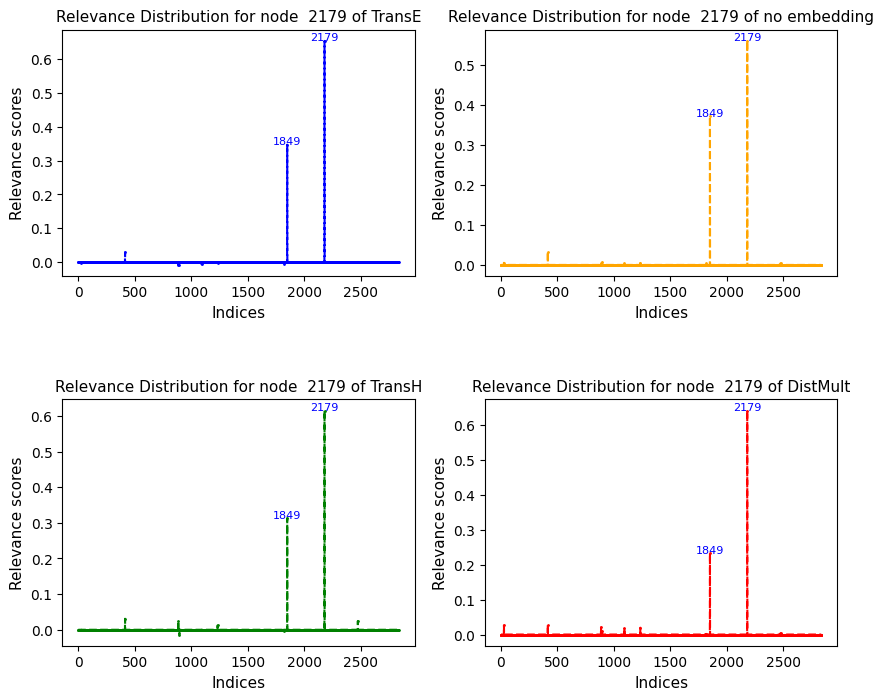

<Figure size 900x600 with 0 Axes>

relevances_node_2199.pt 2199  2393 relevances_edge_856.pt


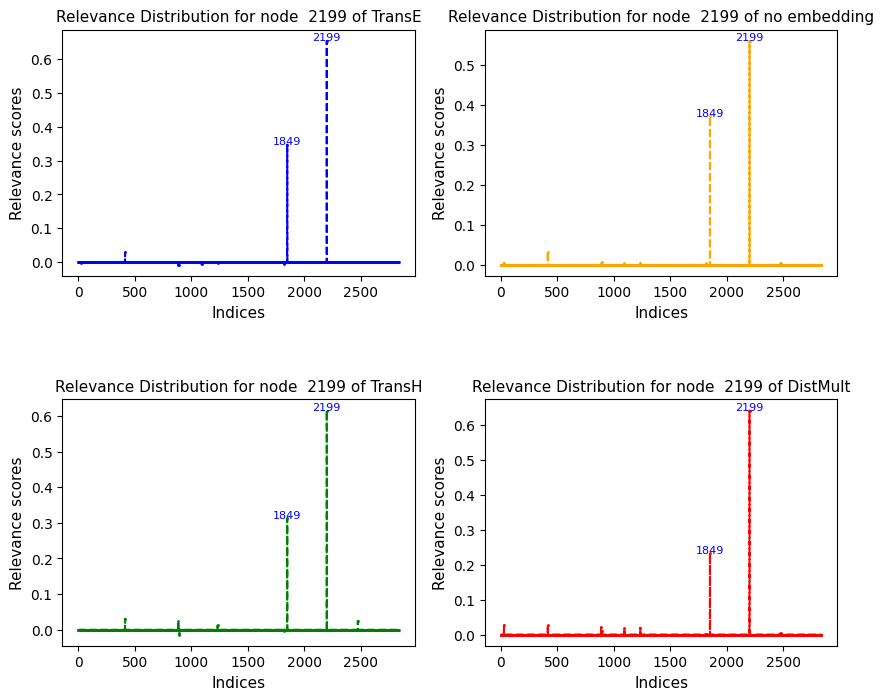

<Figure size 900x600 with 0 Axes>

relevances_node_2200.pt 2200  2393 relevances_edge_856.pt


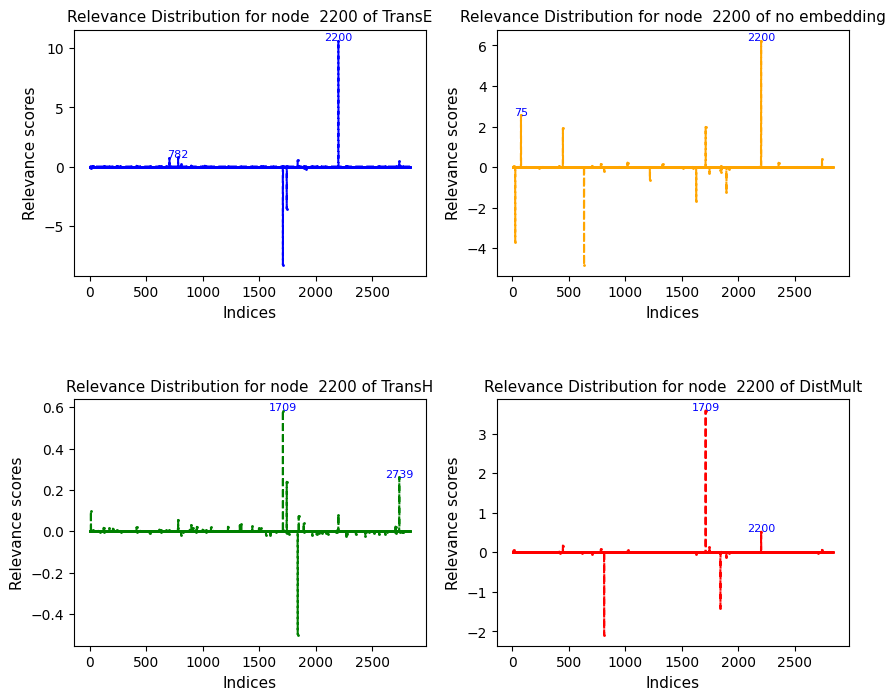

<Figure size 900x600 with 0 Axes>

relevances_node_2321.pt 2321  2393 relevances_edge_856.pt


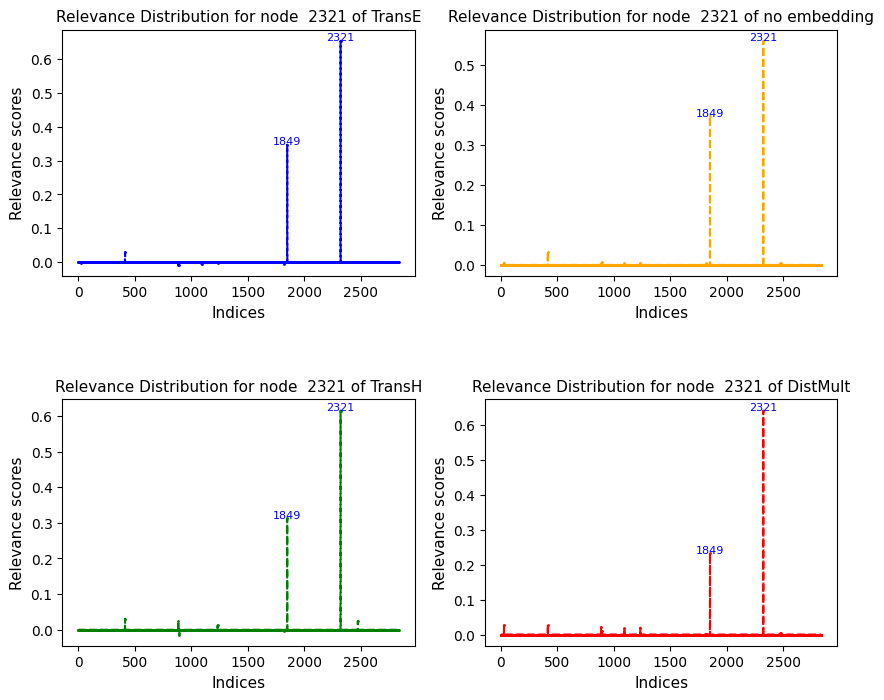

<Figure size 900x600 with 0 Axes>

relevances_node_2380.pt 2380  2393 relevances_edge_856.pt


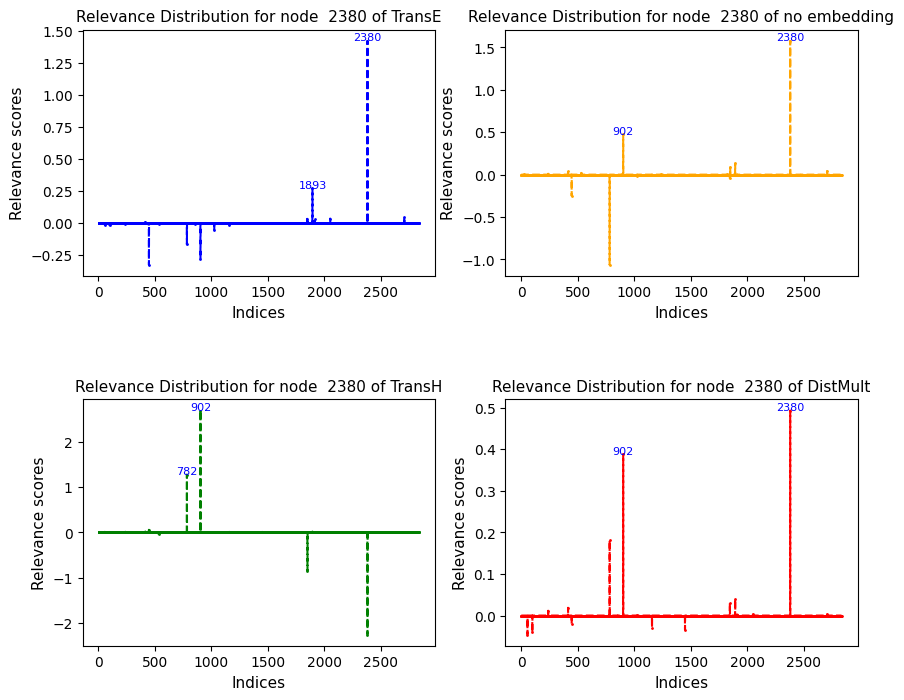

<Figure size 900x600 with 0 Axes>

relevances_node_2433.pt 2433  2393 relevances_edge_856.pt


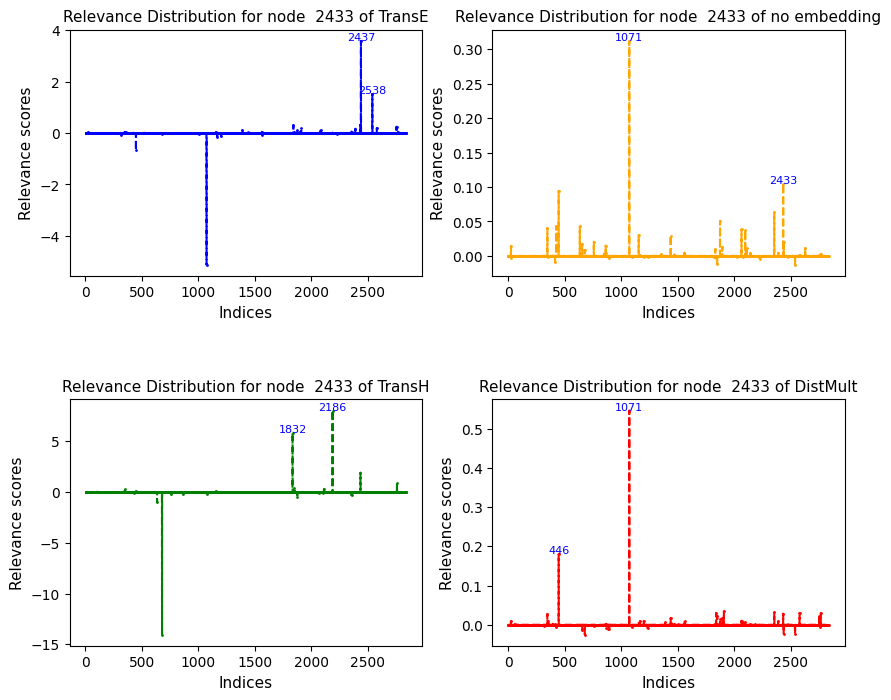

<Figure size 900x600 with 0 Axes>

relevances_node_2500.pt 2500  2393 relevances_edge_856.pt


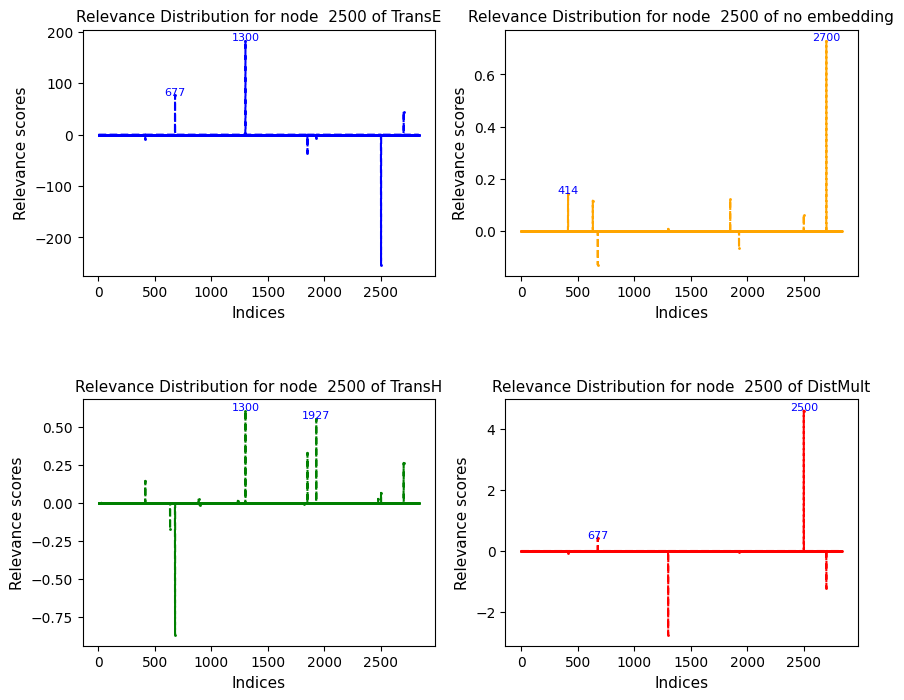

<Figure size 900x600 with 0 Axes>

relevances_node_2516.pt 2516  2393 relevances_edge_856.pt


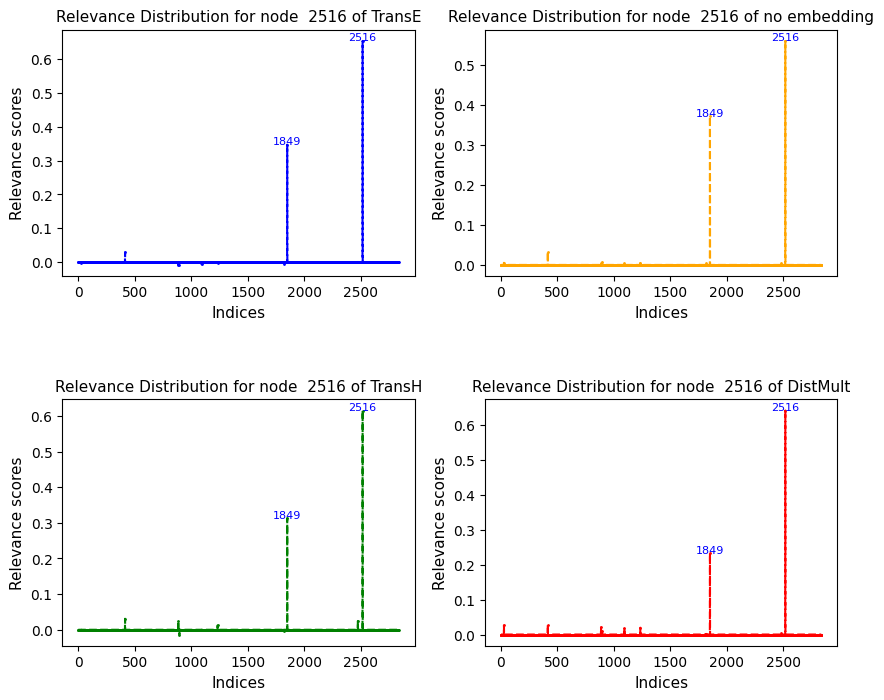

<Figure size 900x600 with 0 Axes>

relevances_node_2534.pt 2534  2393 relevances_edge_856.pt


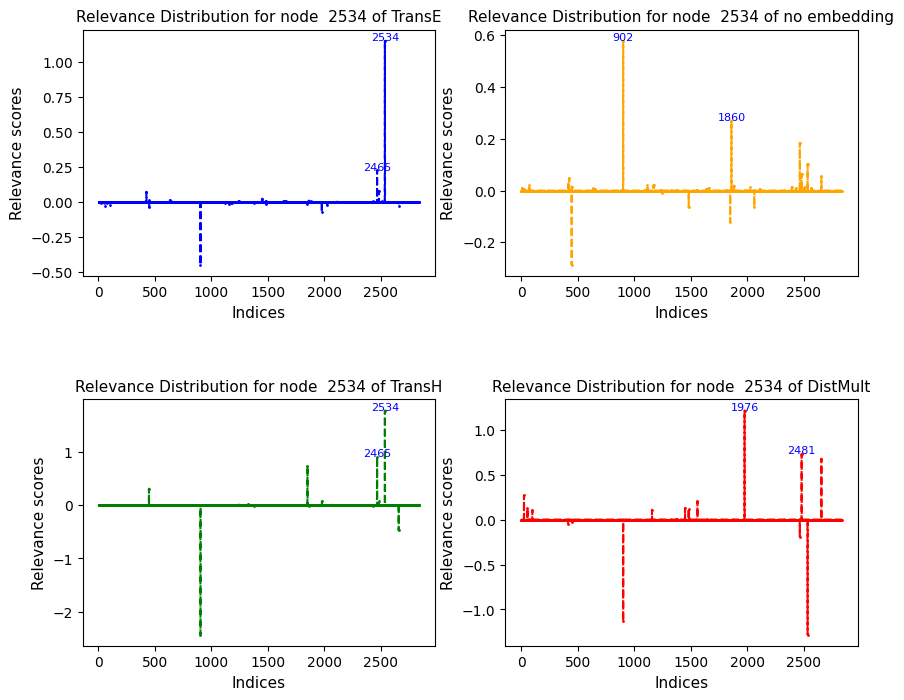

<Figure size 900x600 with 0 Axes>

relevances_node_2639.pt 2639  2393 relevances_edge_856.pt


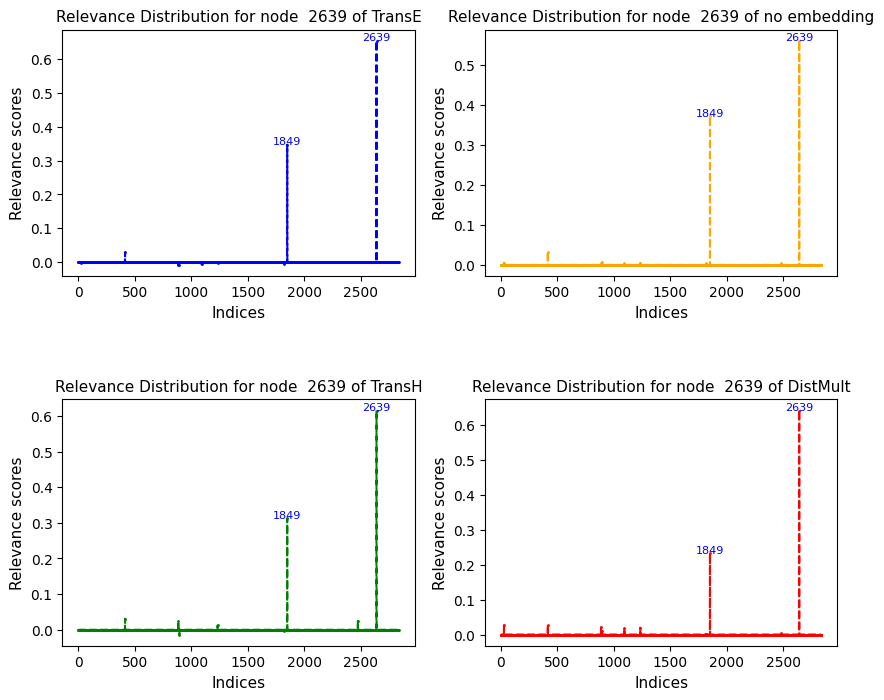

<Figure size 900x600 with 0 Axes>

relevances_node_323.pt 323  2393 relevances_edge_856.pt


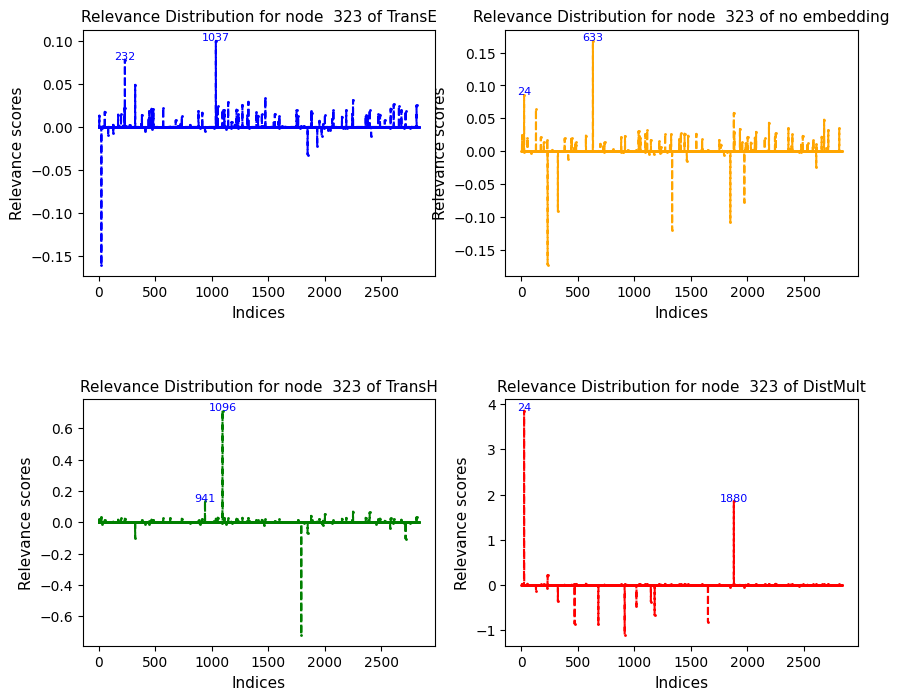

<Figure size 900x600 with 0 Axes>

relevances_node_394.pt 394  2393 relevances_edge_856.pt


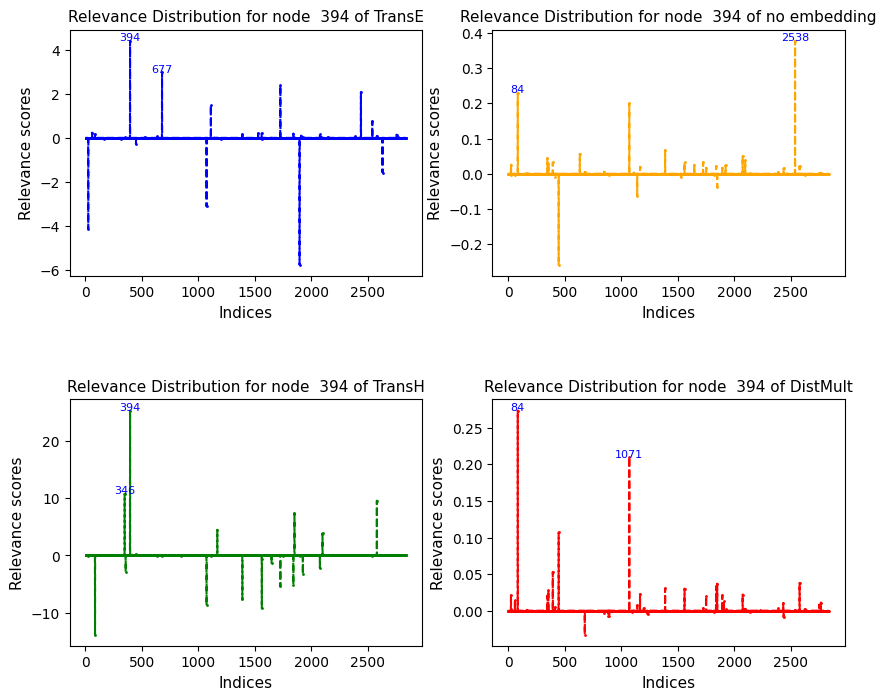

<Figure size 900x600 with 0 Axes>

relevances_node_467.pt 467  2393 relevances_edge_856.pt


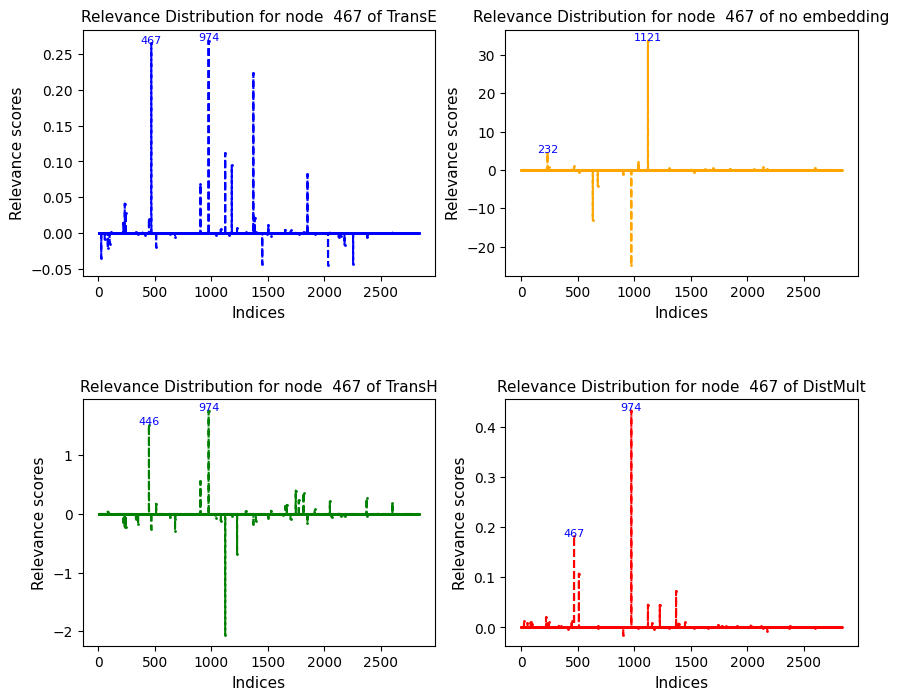

<Figure size 900x600 with 0 Axes>

relevances_node_532.pt 532  2393 relevances_edge_856.pt


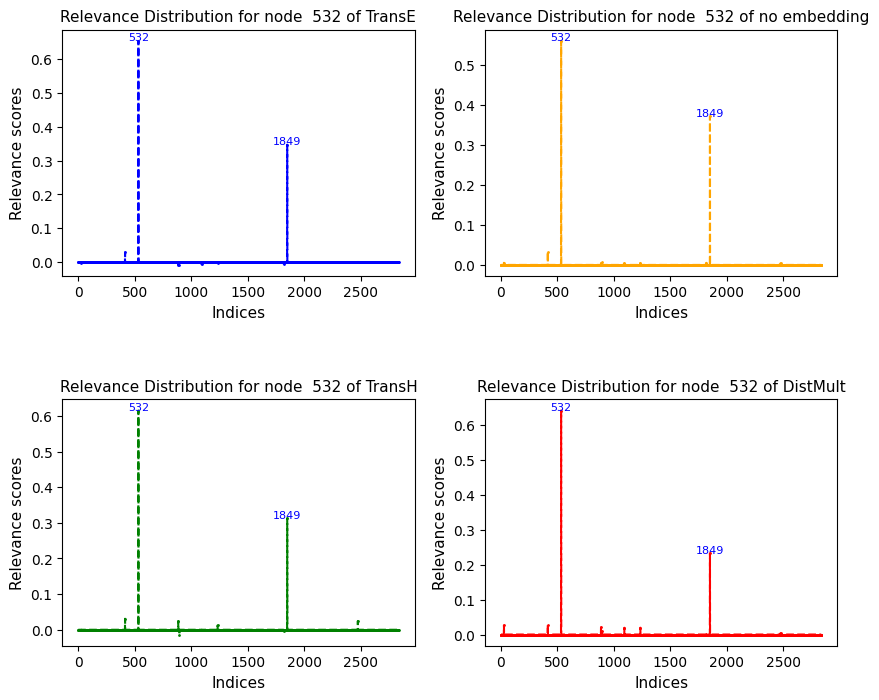

<Figure size 900x600 with 0 Axes>

relevances_node_572.pt 572  2393 relevances_edge_856.pt


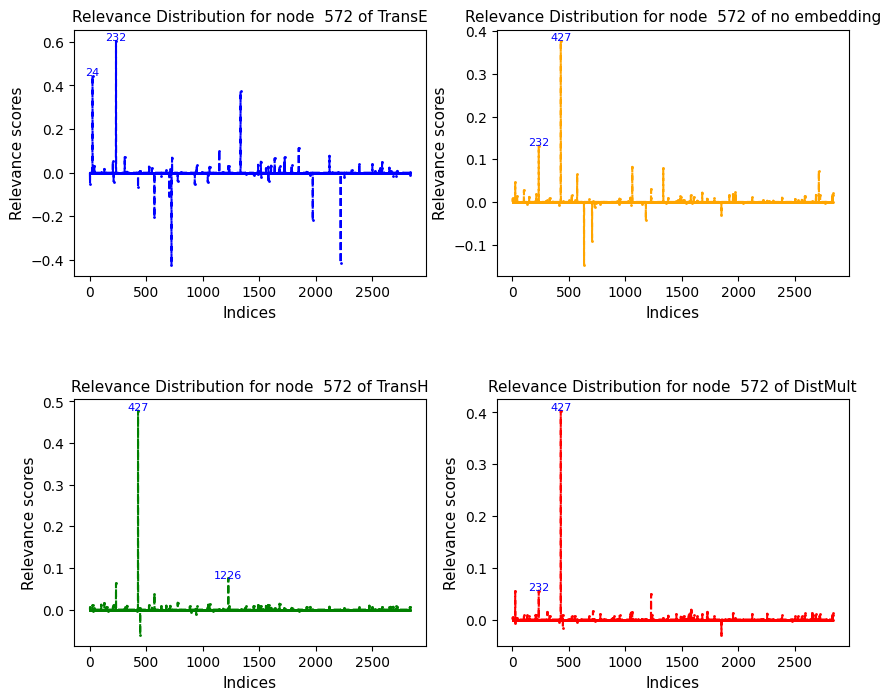

<Figure size 900x600 with 0 Axes>

relevances_node_600.pt 600  2393 relevances_edge_856.pt


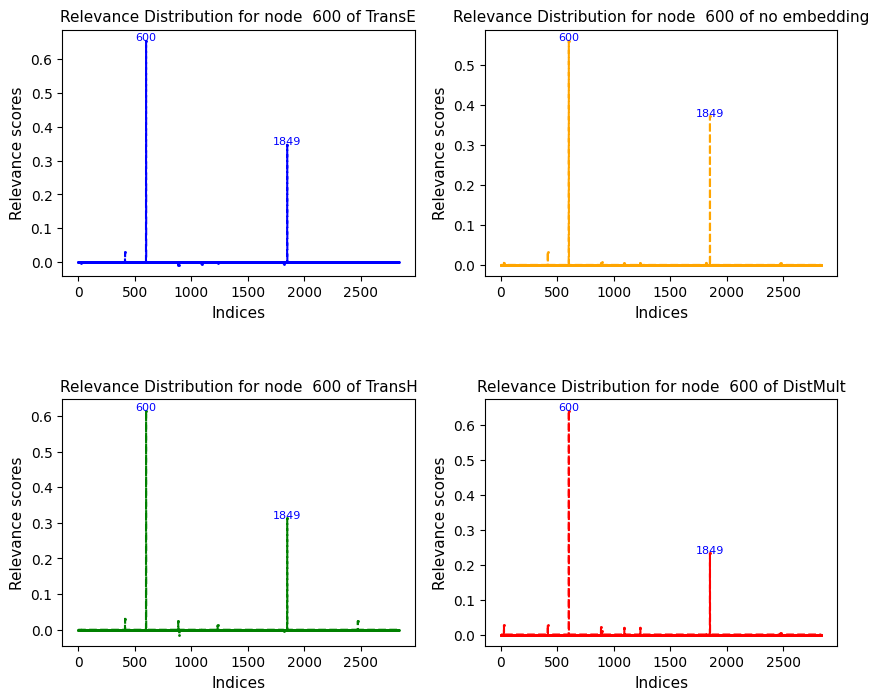

<Figure size 900x600 with 0 Axes>

relevances_node_636.pt 636  2393 relevances_edge_856.pt


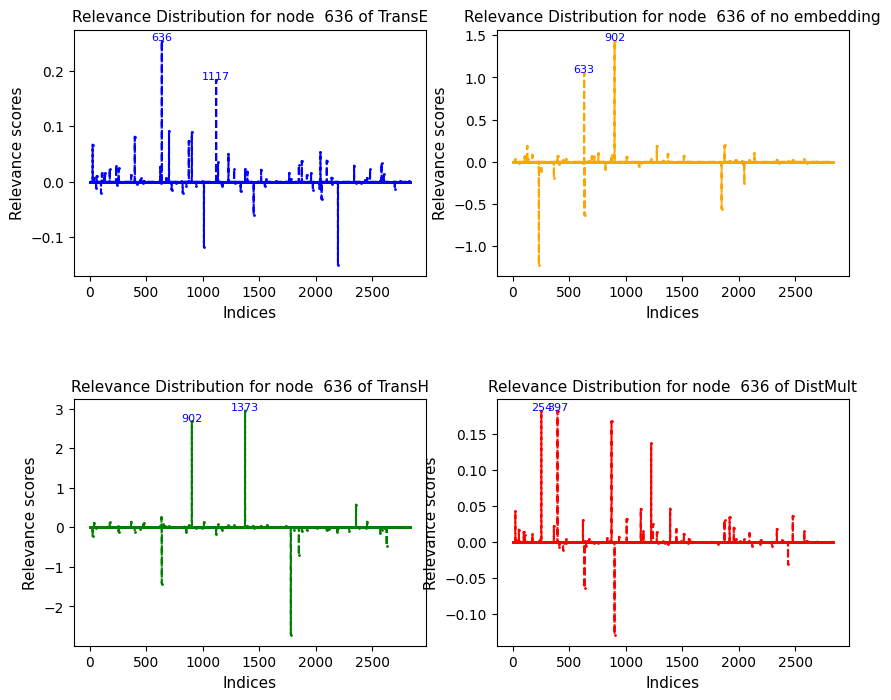

<Figure size 900x600 with 0 Axes>

relevances_node_64.pt 64  2393 relevances_edge_856.pt


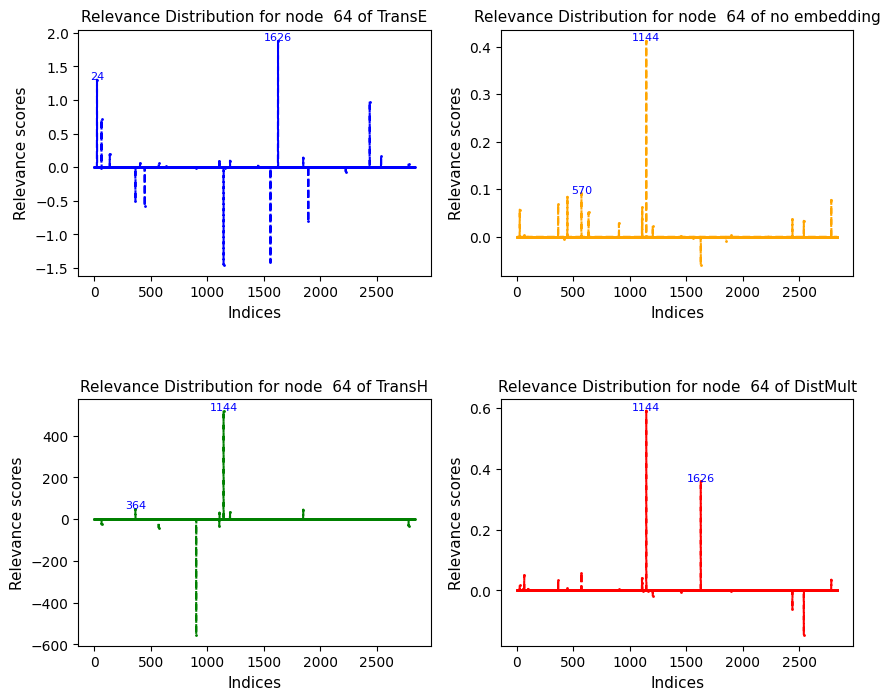

<Figure size 900x600 with 0 Axes>

relevances_node_643.pt 643  2393 relevances_edge_856.pt


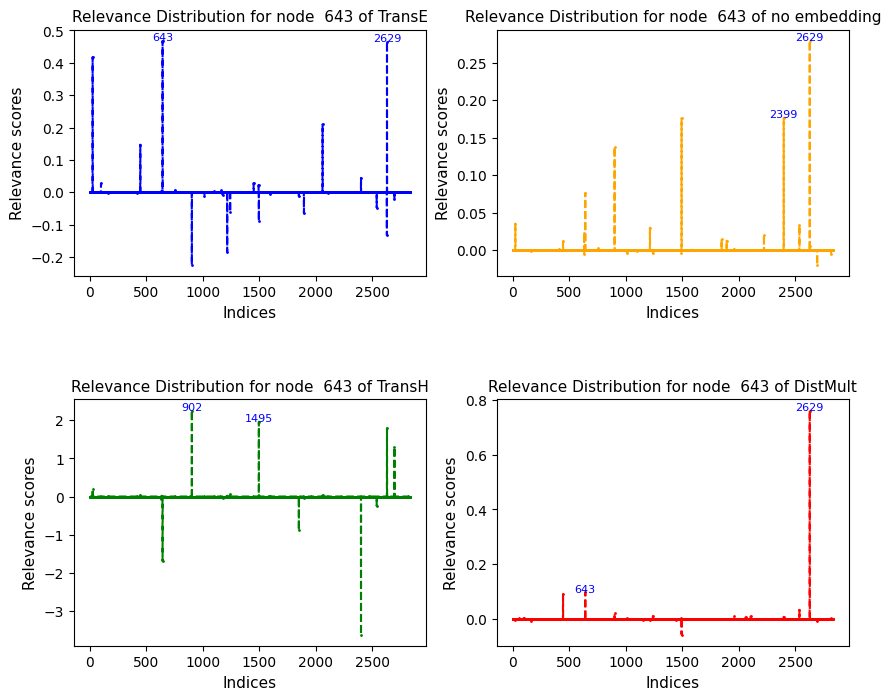

<Figure size 900x600 with 0 Axes>

relevances_node_682.pt 682  2393 relevances_edge_856.pt


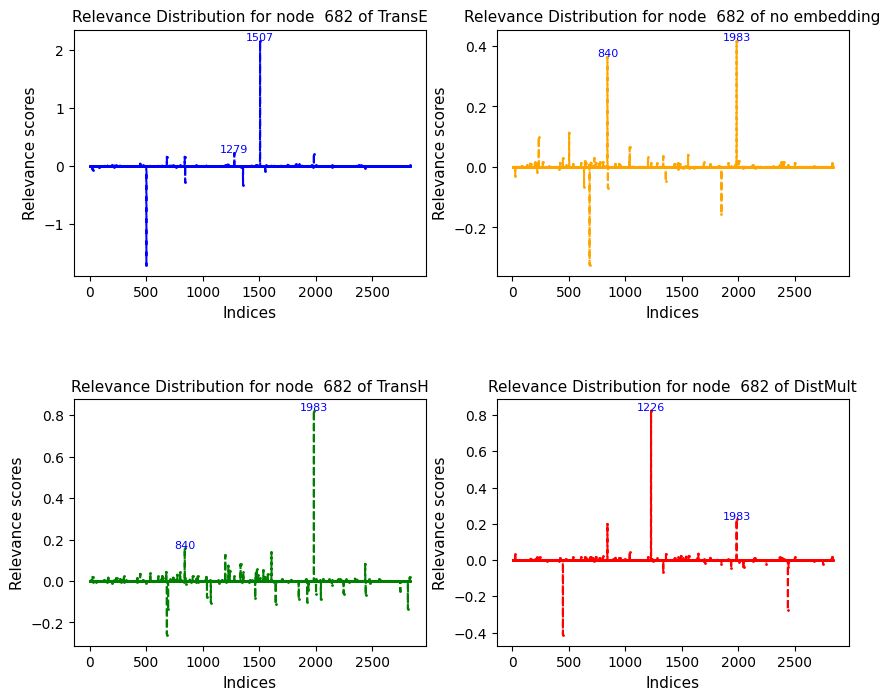

<Figure size 900x600 with 0 Axes>

relevances_node_787.pt 787  2393 relevances_edge_856.pt


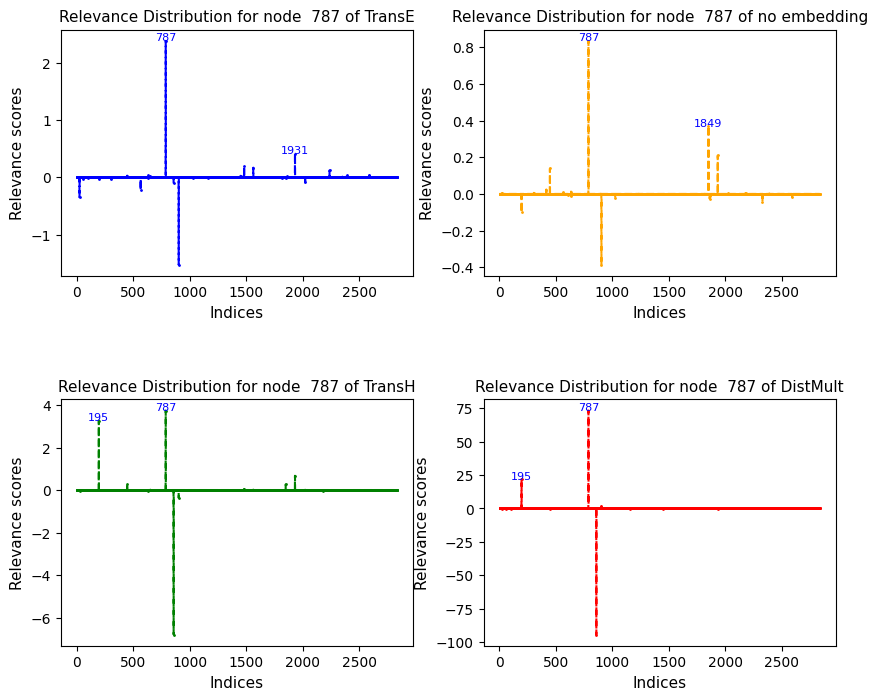

<Figure size 900x600 with 0 Axes>

relevances_node_819.pt 819  2393 relevances_edge_856.pt


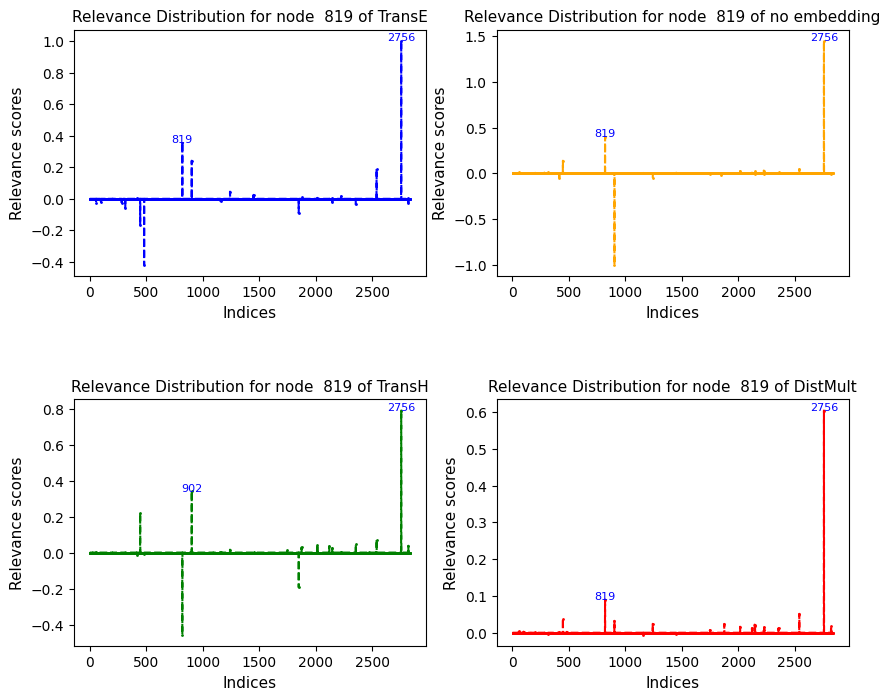

<Figure size 900x600 with 0 Axes>

relevances_node_821.pt 821  2393 relevances_edge_856.pt


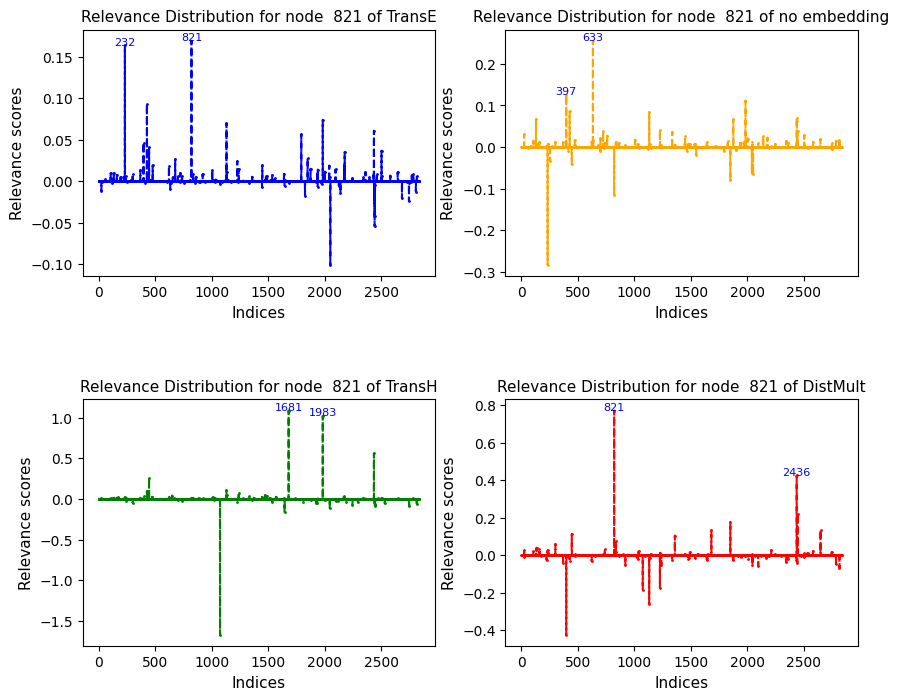

<Figure size 900x600 with 0 Axes>

relevances_node_83.pt 83  2393 relevances_edge_856.pt


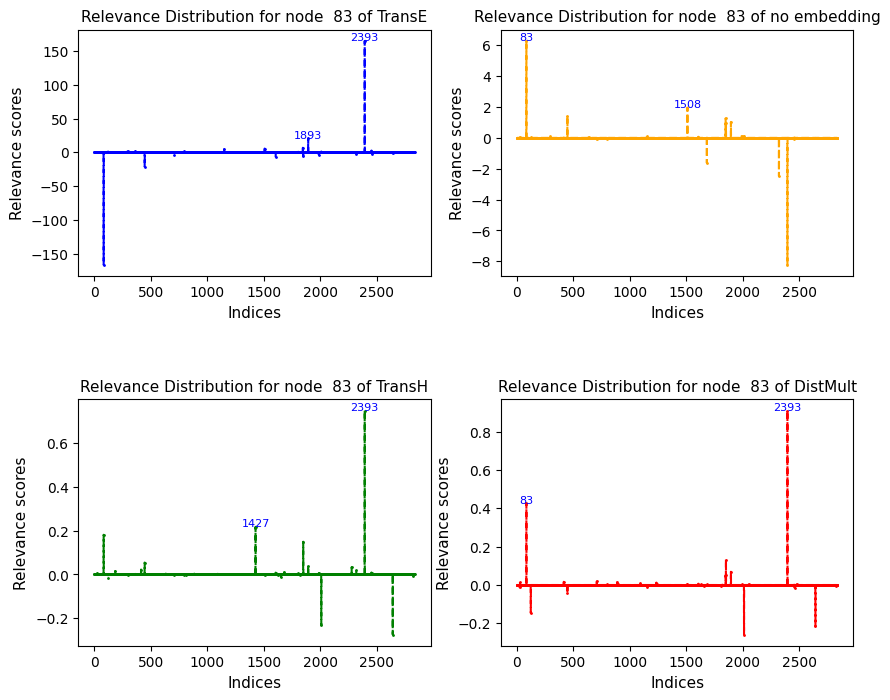

<Figure size 900x600 with 0 Axes>

relevances_node_856.pt 856  2393 relevances_edge_856.pt


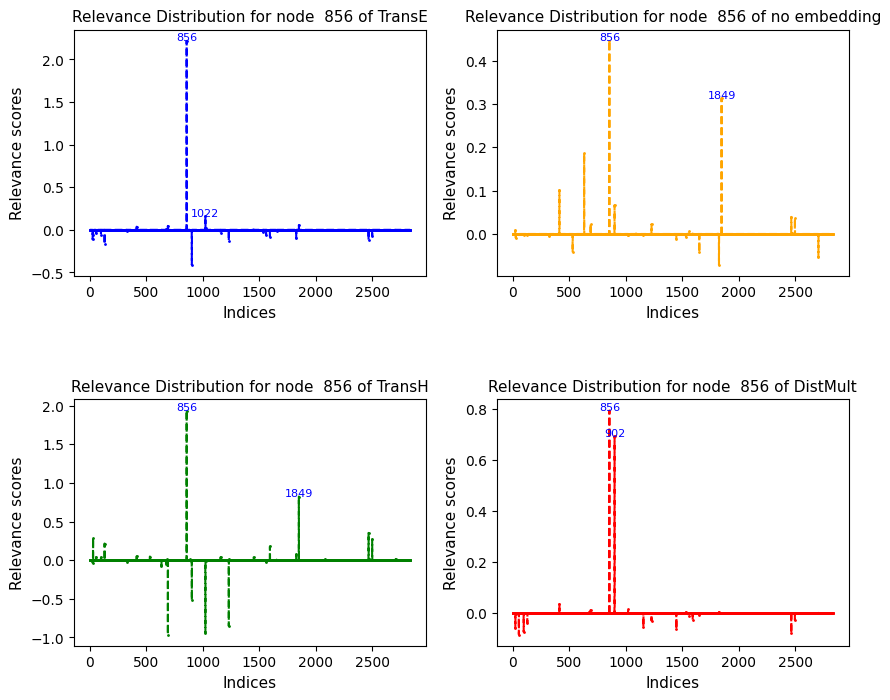

<Figure size 900x600 with 0 Axes>

In [101]:
path = 'out/AIFB/RGAT_no_emb/relevances/'
path_dist = 'out/AIFB/RGAT_emb/DistMult/relevances/'
path_transe = 'out/AIFB/RGAT_emb/TransE/relevances/'
path_transh = 'out/AIFB/RGAT_emb/TransH/relevances/'
fil = os.listdir(path)
fil_transe = os.listdir('out/AIFB/RGAT_emb/TransE/relevances/')
fil_transh = os.listdir('out/AIFB/RGAT_emb/TransH/relevances/')
fil_dist = os.listdir('out/AIFB/RGAT_emb/DistMult/relevances/')
rel_no = [file for file in fil if file.startswith("relevances_node_")]
rel_transe = [file for file in fil if file.startswith("relevances_node_")]
rel_transh = [file for file in fil if file.startswith("relevances_node_")]
rel_dist = [file for file in fil if file.startswith("relevances_node_")]

dfs = []
for rel in rel_transe:
    rte = torch.load(path_transe+rel).to_dense().detach().numpy()
    node_name = rel.split('node_')[1].split('.')[0]


    print(rel, node_name, adapt_node, rel2)
    rno = torch.load(path+rel).to_dense().detach().numpy()
    rth = torch.load(path_transh+rel).to_dense().detach().numpy()
    rdi = torch.load(path_dist+rel).to_dense().detach().numpy()
    #ra = np.sort(ra)
    #rb = np.sort(rb)
    #Create an array of indices for the sorted data
    indices = np.arange(1, len(rte) + 1)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), gridspec_kw={'hspace': 0.5})
    # Create a line plot with different line styles and markers
    plt.figure(figsize=(9, 6))
    axes[0,0].plot(indices, rte, color='blue', linestyle='--', marker='.', markersize=2, label='Relevance TransE')
    axes[0,1].plot(indices, rno, color='orange', linestyle='--', marker='.', markersize=2, label='Relevance no embedding')
    axes[1,0].plot(indices, rth, color='green', linestyle='--', marker='.', markersize=2, label='Relevance TransH')
    axes[1,1].plot(indices, rdi, color='red', linestyle='--', marker='.', markersize=2, label='Relevance DistMult')
    emb_type = ['TransE', 'no embedding', 'TransH', 'DistMult']
    plt.tight_layout()
    for i, ax in enumerate(axes.flatten()):
        ax.set_xlabel('Indices', fontsize=11)
        ax.set_ylabel('Relevance scores', fontsize=11)
        ax.set_title('Relevance Distribution for node  {} of {}'.format(node_name, emb_type[i]), fontsize=11)


        highest_indices = np.argsort(-[rte, rno, rth, rdi][i])[:2]
        #lowest_indices = np.argsort([rte, rno, rth, rdi][i])[:2]

        # Annotate highest indices at the top of the plot
        for idx in highest_indices:
            ax.annotate(str(idx), xy=(indices[idx], [rte, rno, rth, rdi][i][idx]),
                     xytext=(0, 0.1), textcoords='offset points', ha='center', fontsize=8, color='blue')


    plt.show()

### EDGE RELEVANCE

relevances_edge_107.pt 107


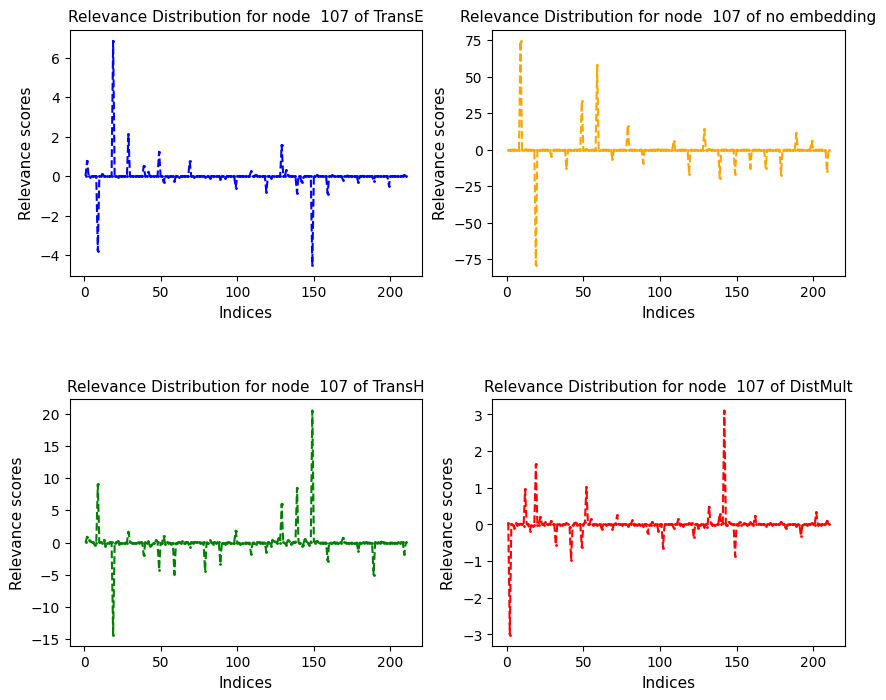

<Figure size 900x600 with 0 Axes>

relevances_edge_1255.pt 1255


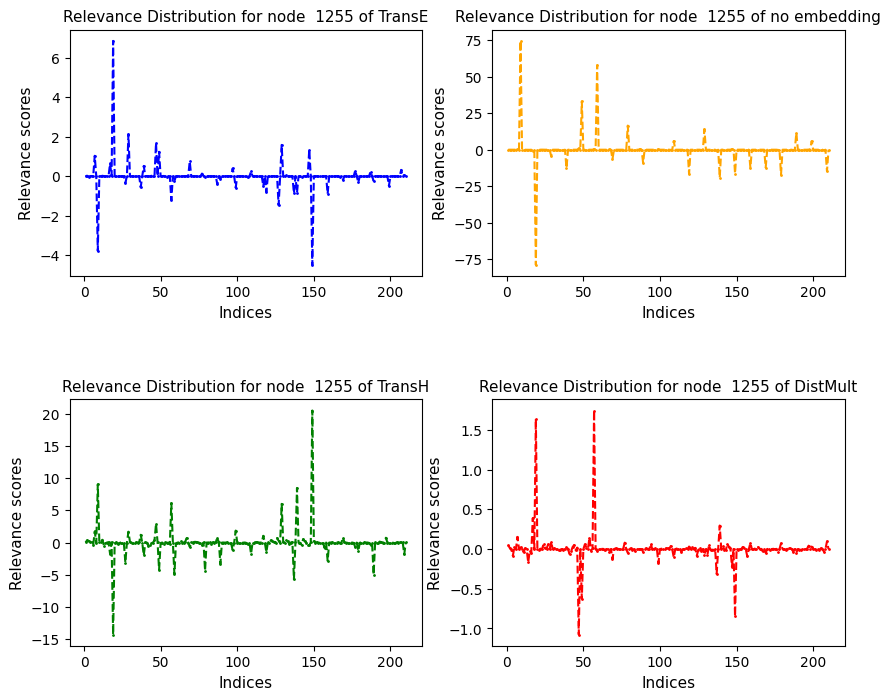

<Figure size 900x600 with 0 Axes>

relevances_edge_1258.pt 1258


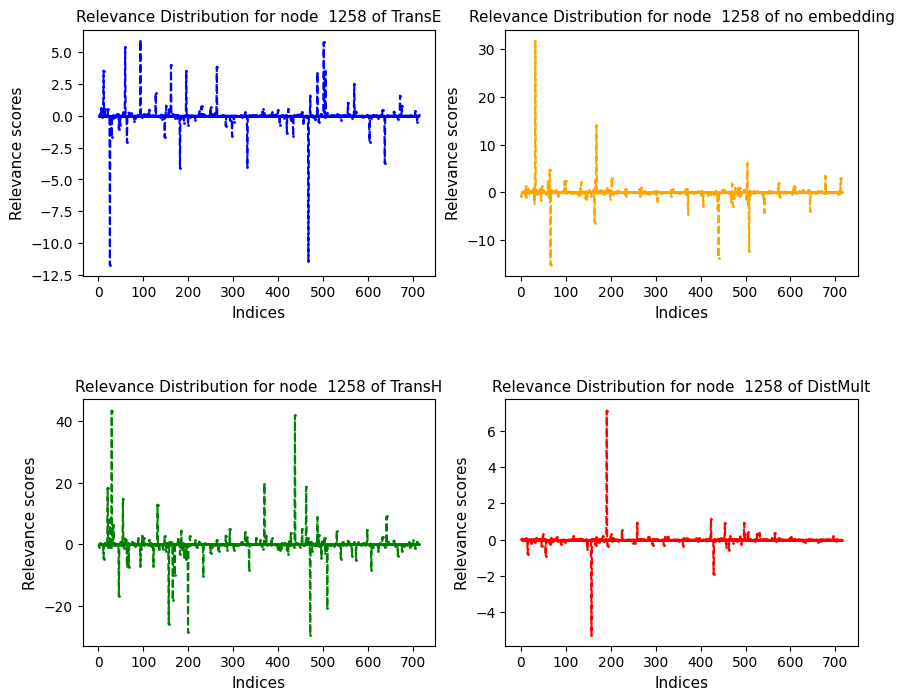

<Figure size 900x600 with 0 Axes>

relevances_edge_129.pt 129


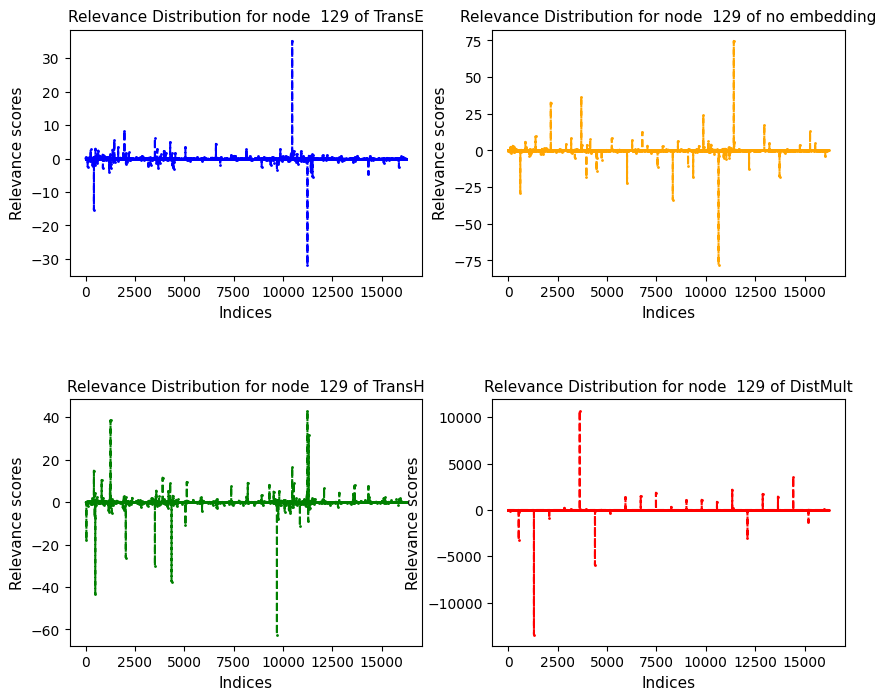

<Figure size 900x600 with 0 Axes>

relevances_edge_1324.pt 1324


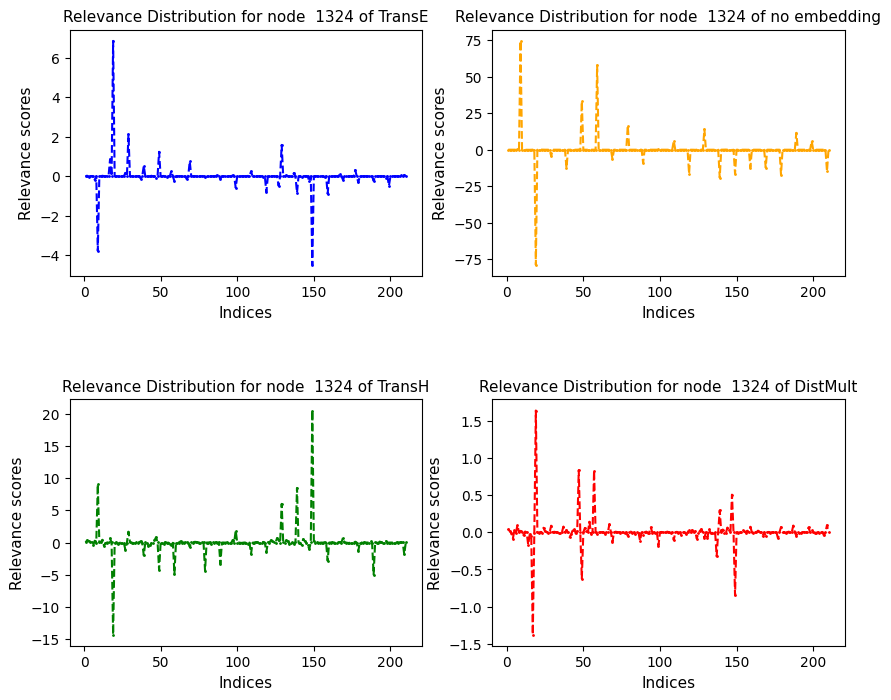

<Figure size 900x600 with 0 Axes>

relevances_edge_1349.pt 1349


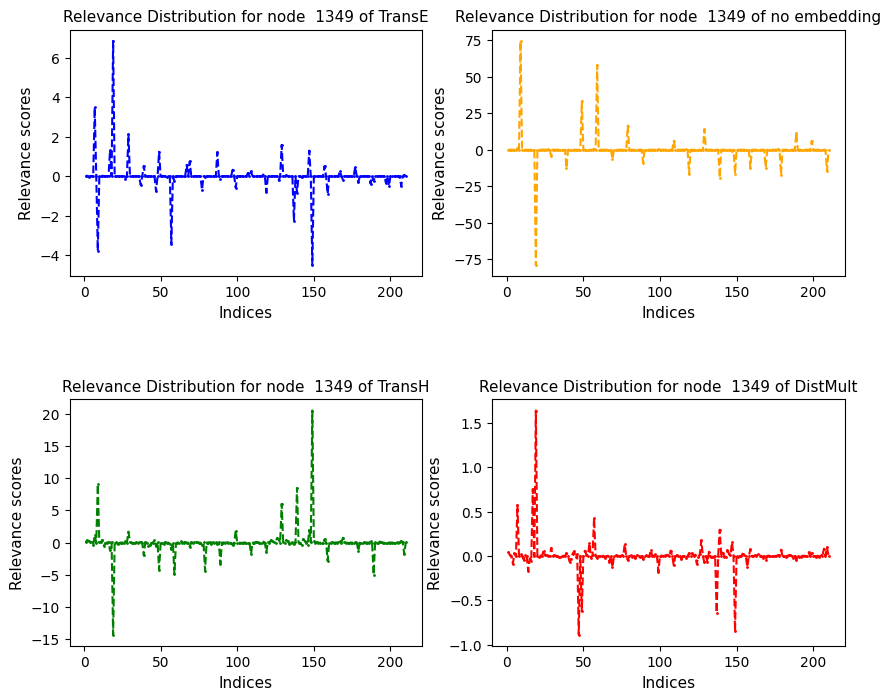

<Figure size 900x600 with 0 Axes>

relevances_edge_1374.pt 1374


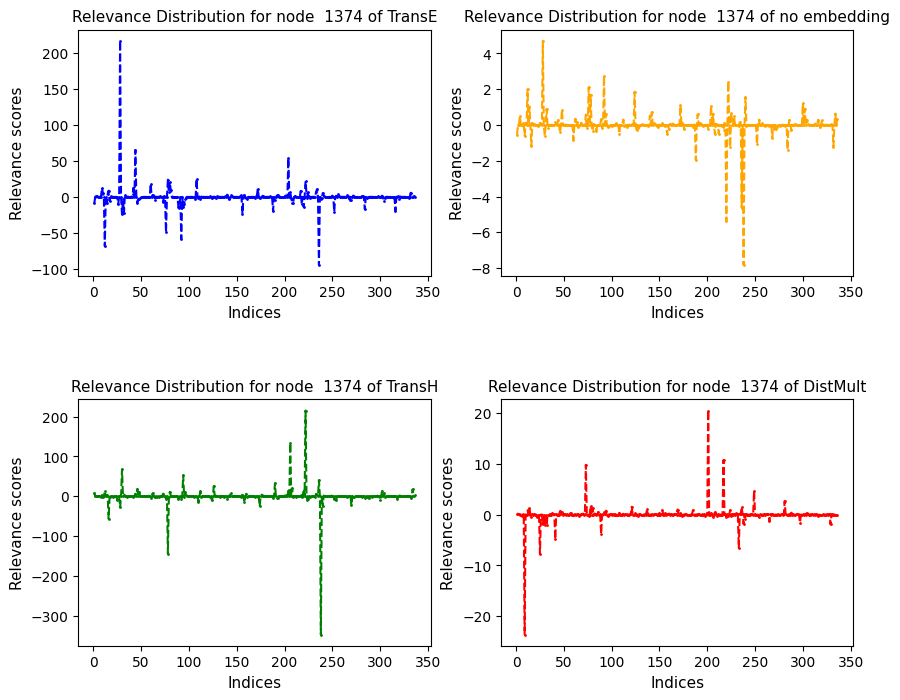

<Figure size 900x600 with 0 Axes>

relevances_edge_1501.pt 1501


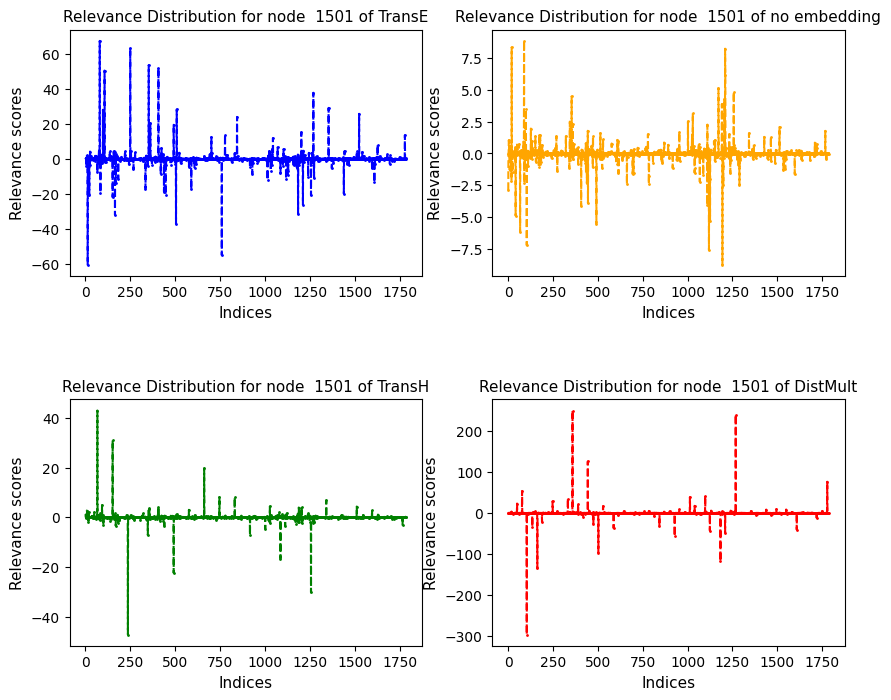

<Figure size 900x600 with 0 Axes>

relevances_edge_1668.pt 1668


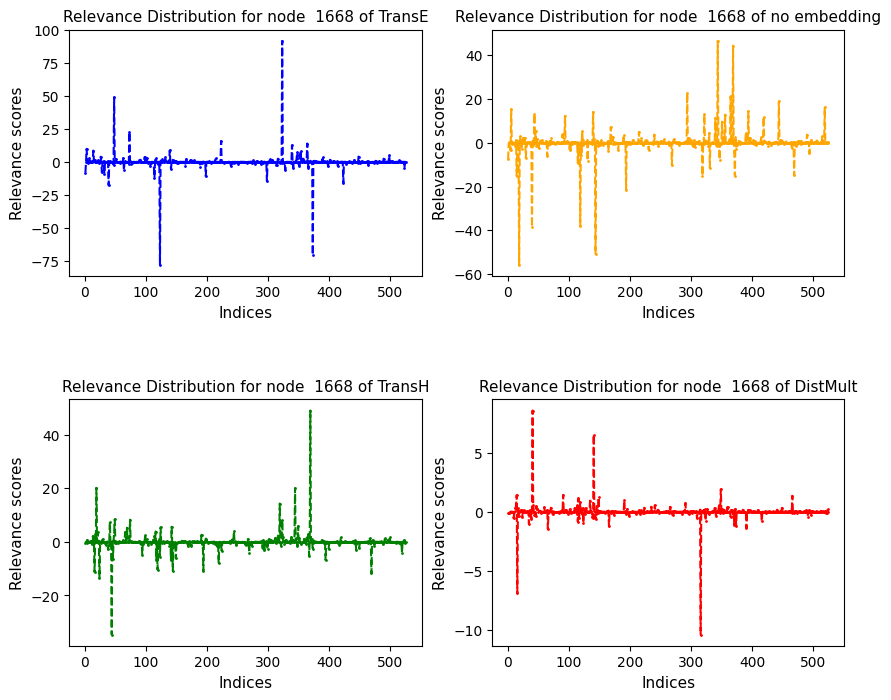

<Figure size 900x600 with 0 Axes>

relevances_edge_1758.pt 1758


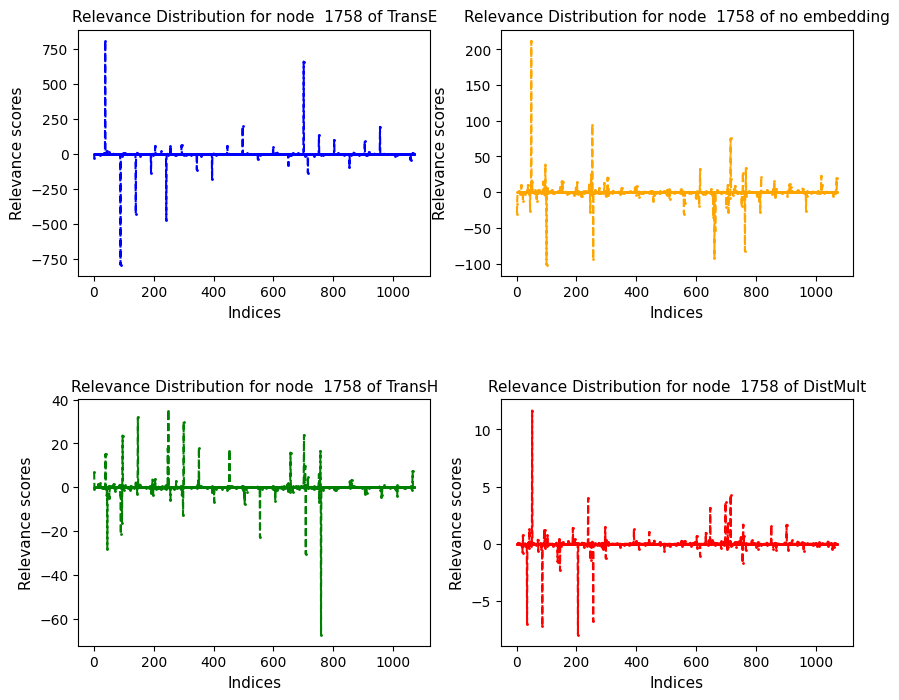

<Figure size 900x600 with 0 Axes>

relevances_edge_2170.pt 2170


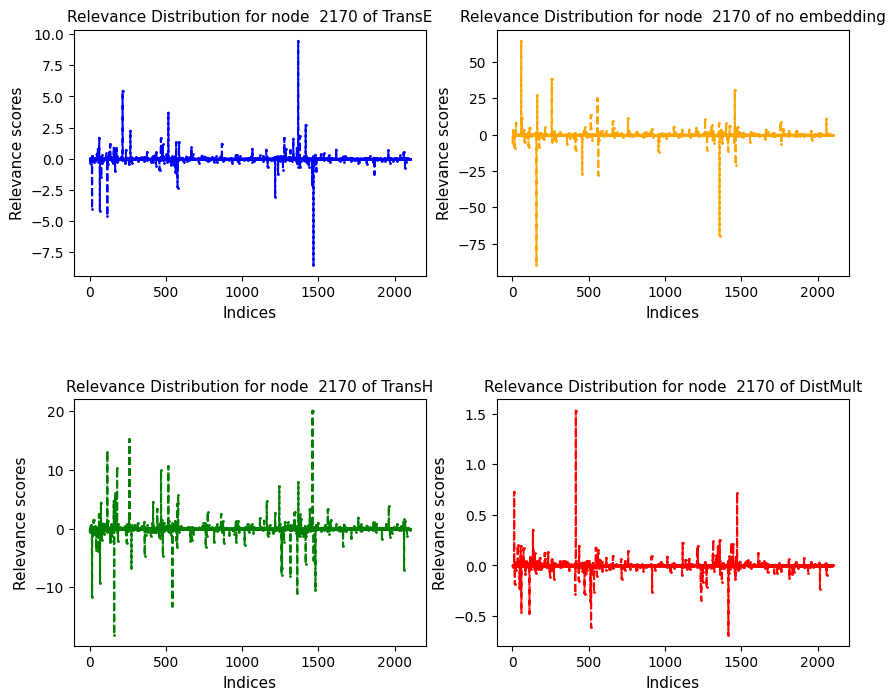

<Figure size 900x600 with 0 Axes>

relevances_edge_2179.pt 2179


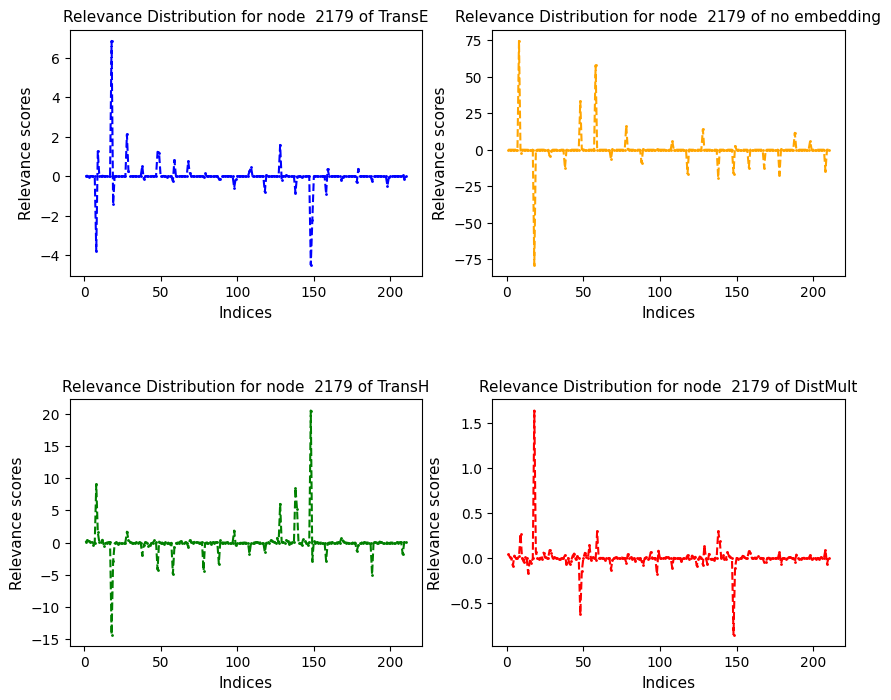

<Figure size 900x600 with 0 Axes>

relevances_edge_2199.pt 2199


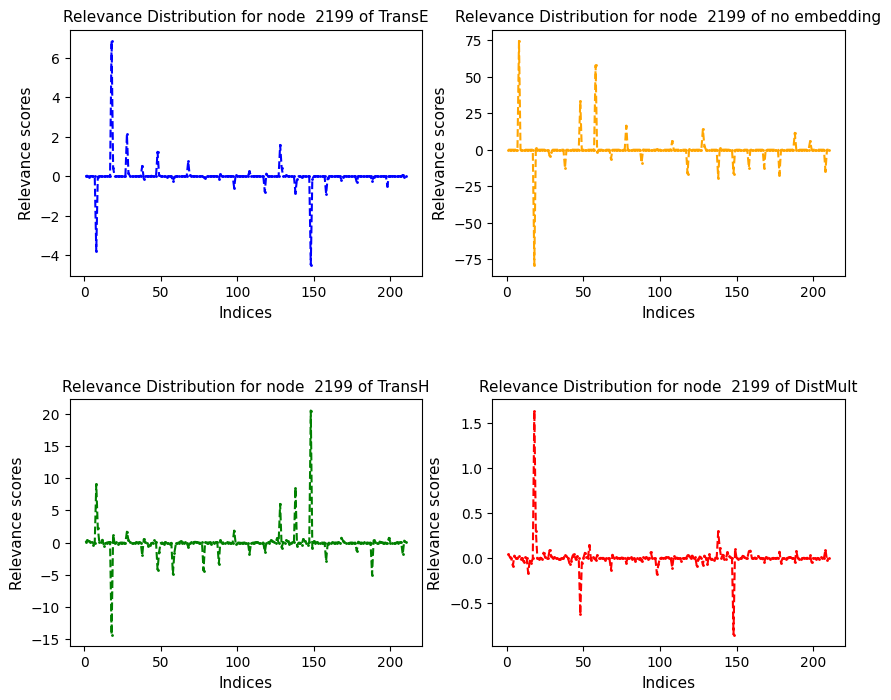

<Figure size 900x600 with 0 Axes>

relevances_edge_2200.pt 2200


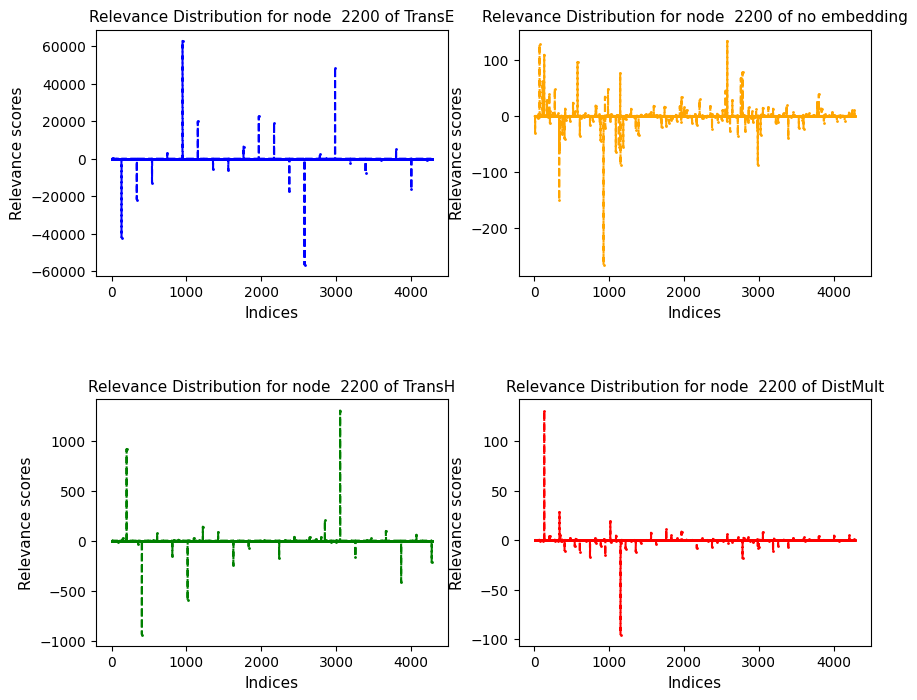

<Figure size 900x600 with 0 Axes>

relevances_edge_2321.pt 2321


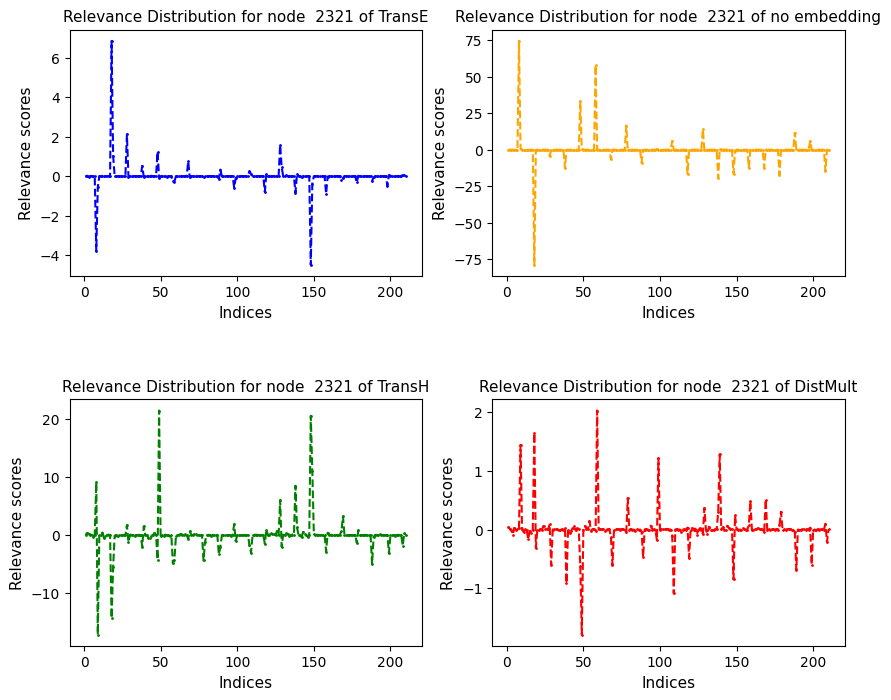

<Figure size 900x600 with 0 Axes>

relevances_edge_2380.pt 2380


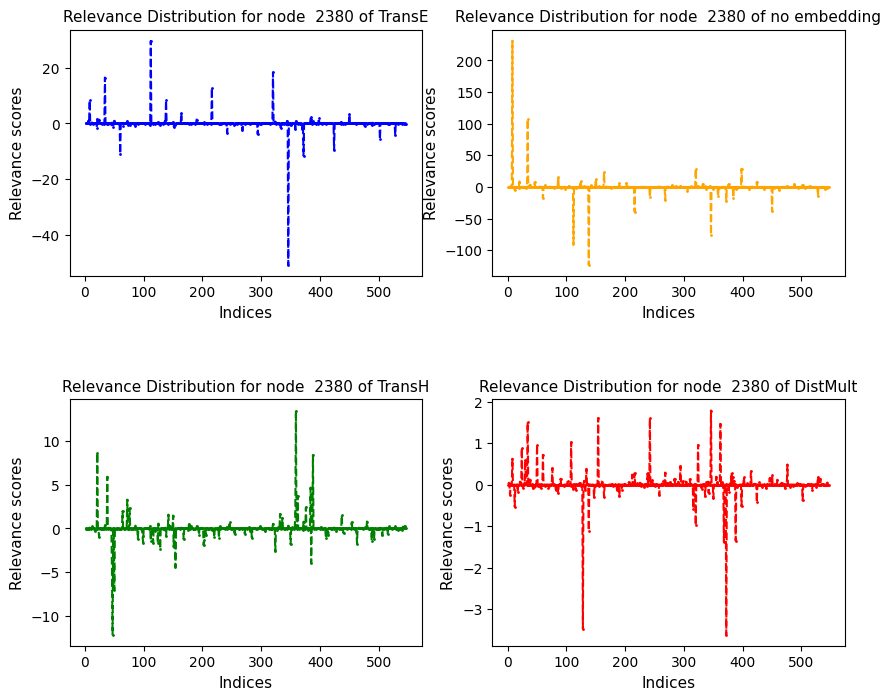

<Figure size 900x600 with 0 Axes>

relevances_edge_2433.pt 2433


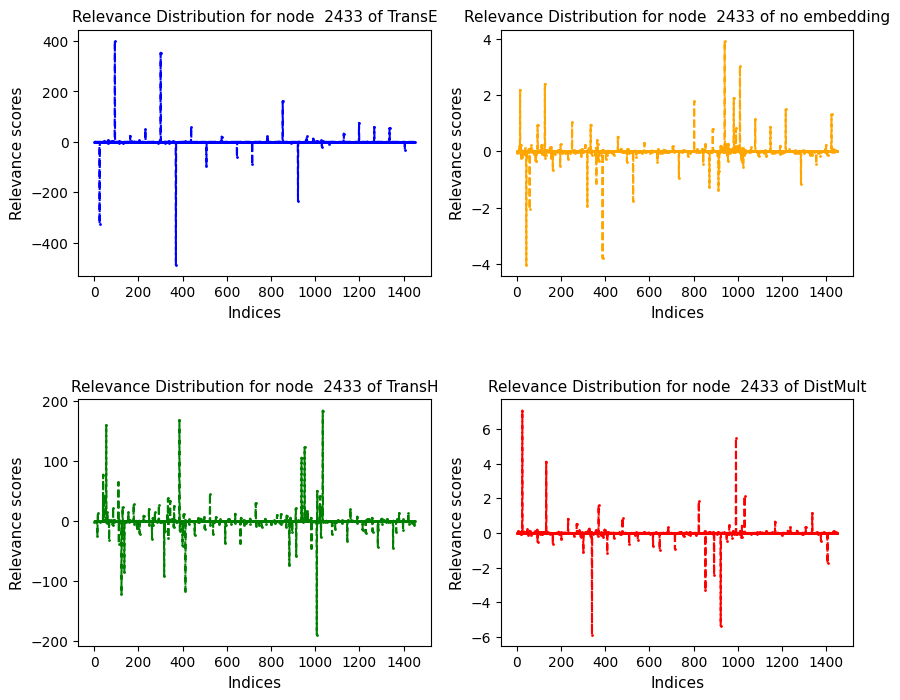

<Figure size 900x600 with 0 Axes>

relevances_edge_2500.pt 2500


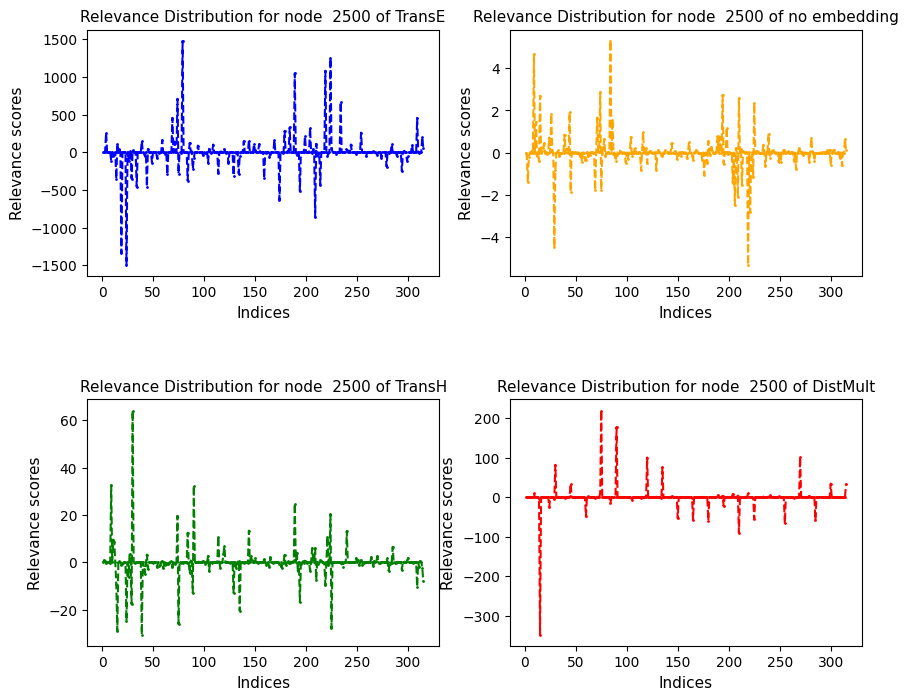

<Figure size 900x600 with 0 Axes>

relevances_edge_2516.pt 2516


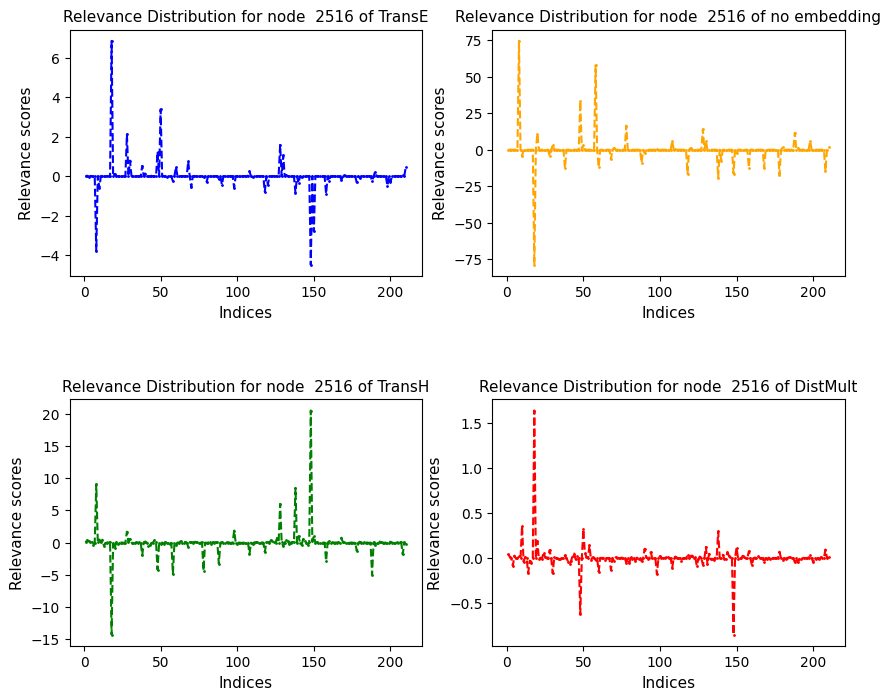

<Figure size 900x600 with 0 Axes>

relevances_edge_2534.pt 2534


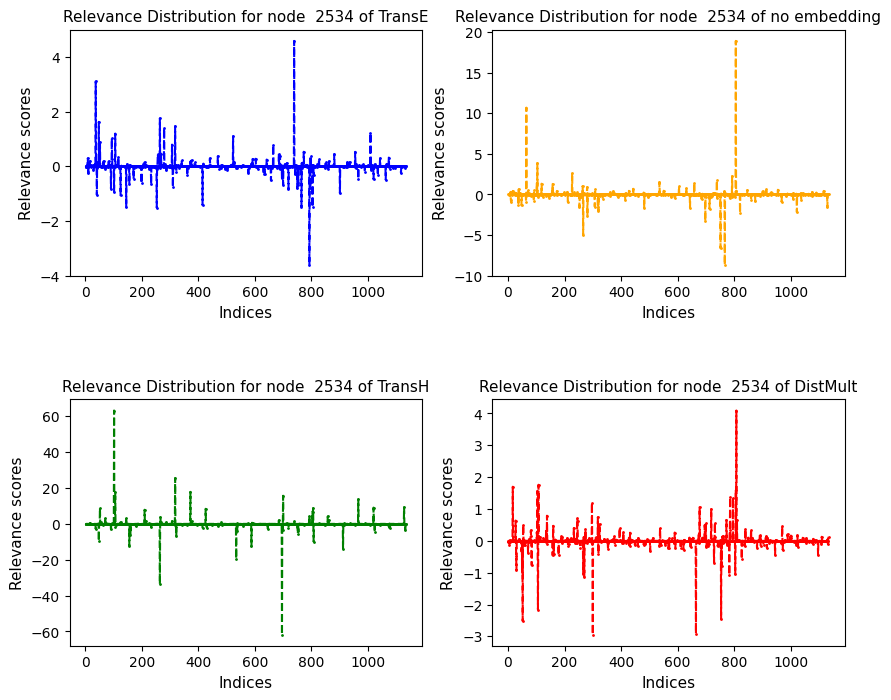

<Figure size 900x600 with 0 Axes>

relevances_edge_2639.pt 2639


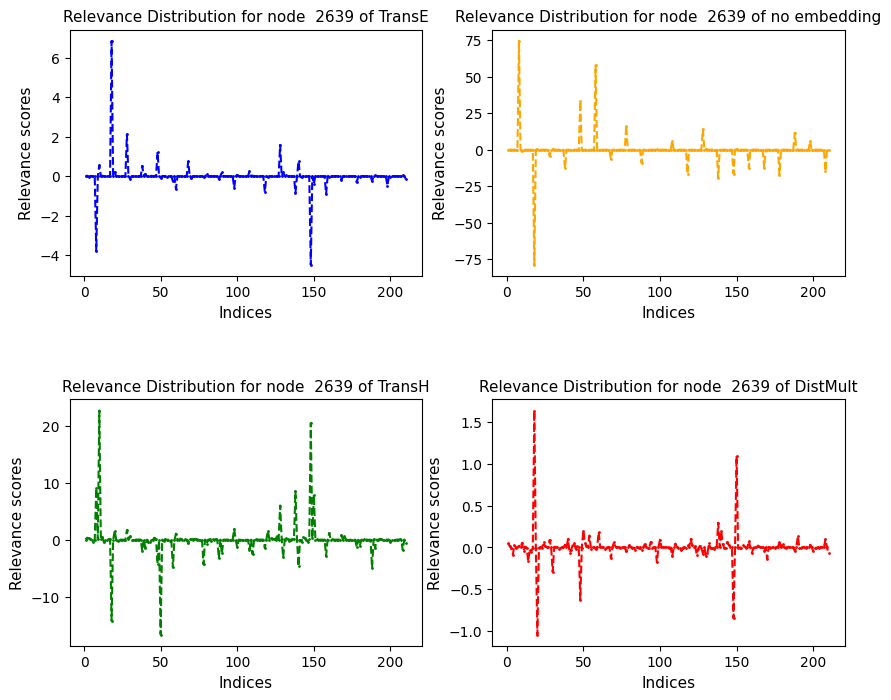

<Figure size 900x600 with 0 Axes>

relevances_edge_323.pt 323


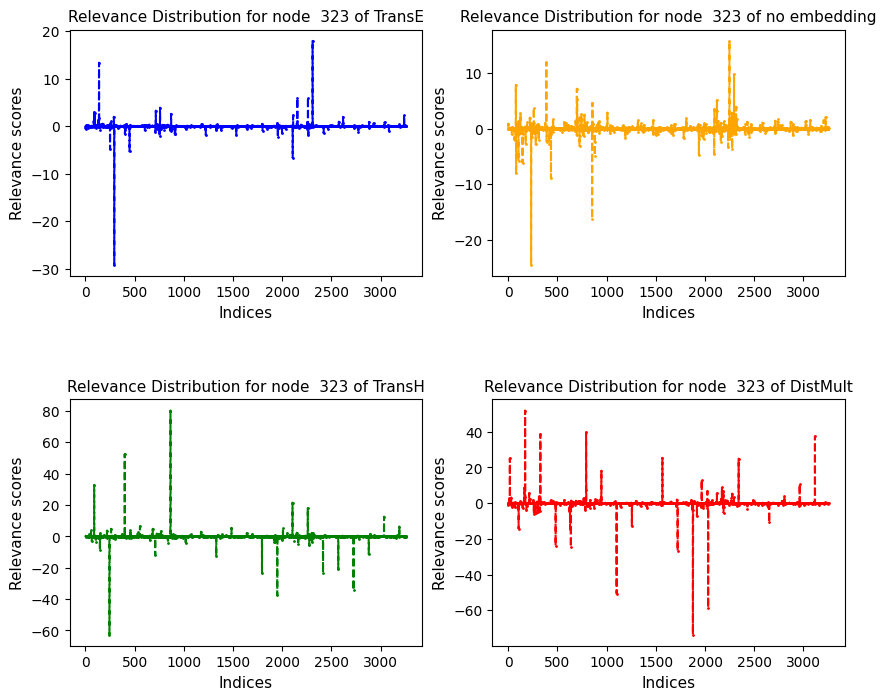

<Figure size 900x600 with 0 Axes>

relevances_edge_394.pt 394


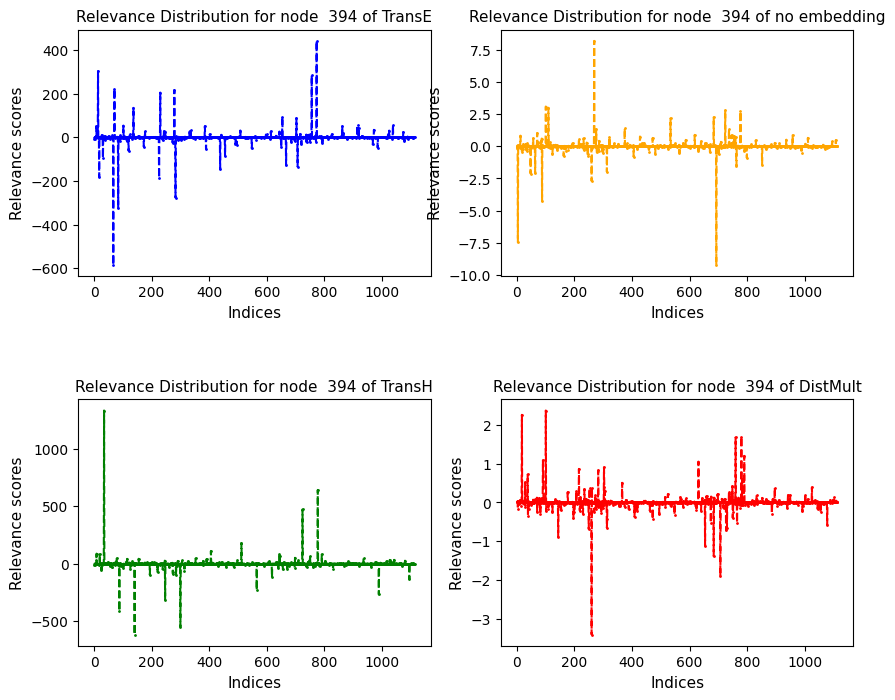

<Figure size 900x600 with 0 Axes>

relevances_edge_467.pt 467


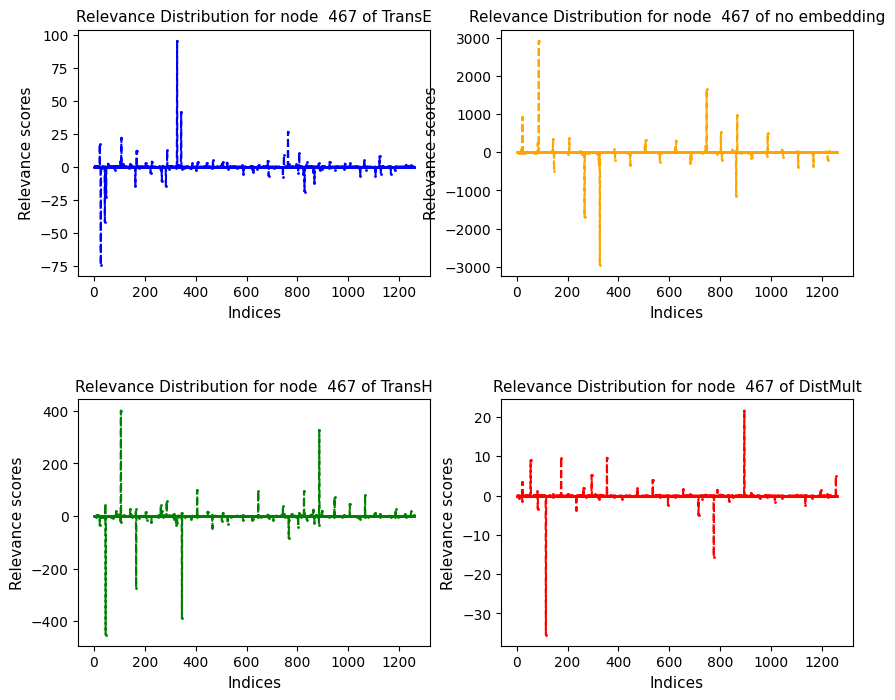

<Figure size 900x600 with 0 Axes>

relevances_edge_532.pt 532


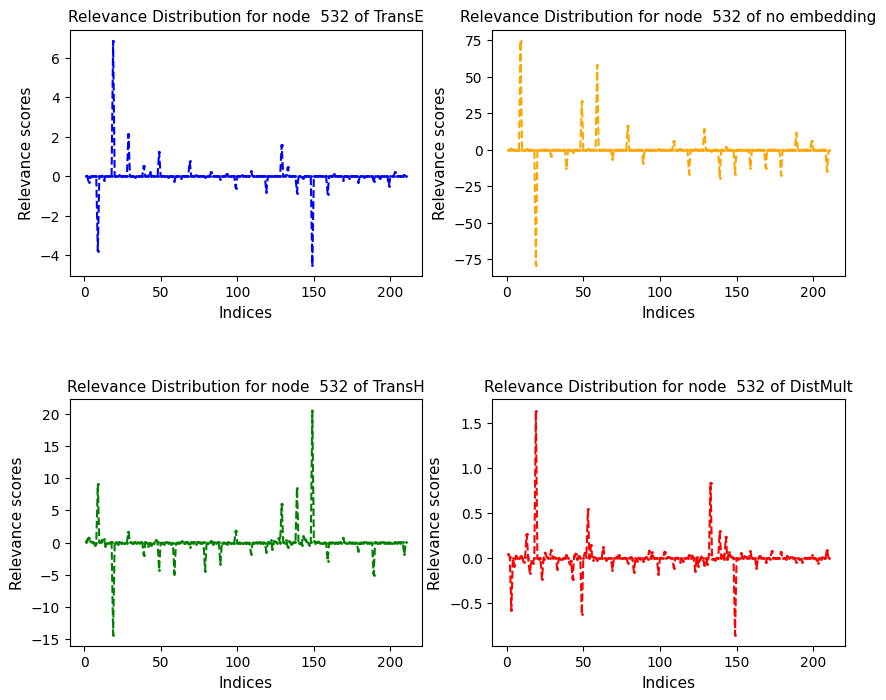

<Figure size 900x600 with 0 Axes>

relevances_edge_572.pt 572


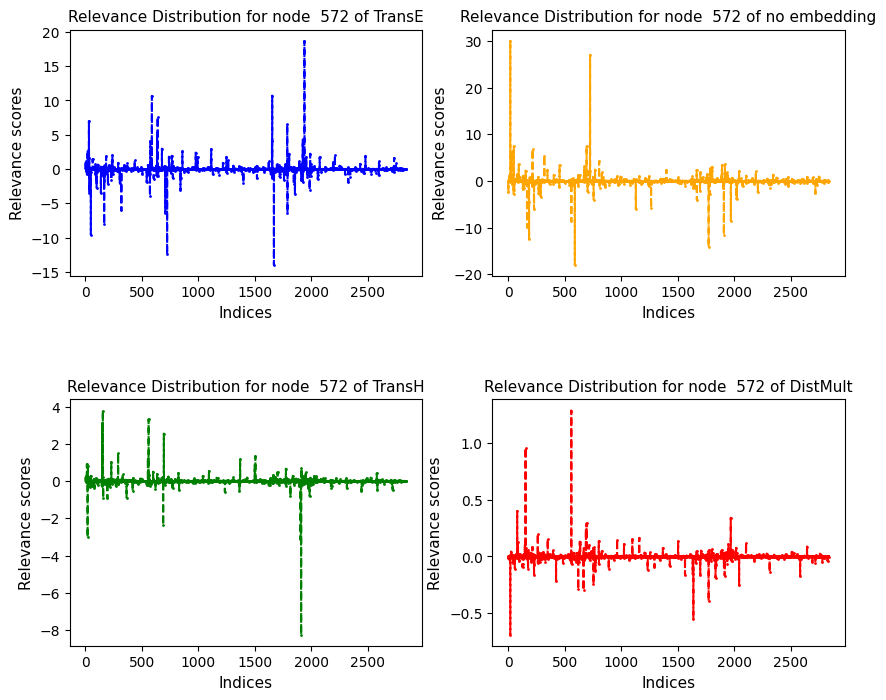

<Figure size 900x600 with 0 Axes>

relevances_edge_600.pt 600


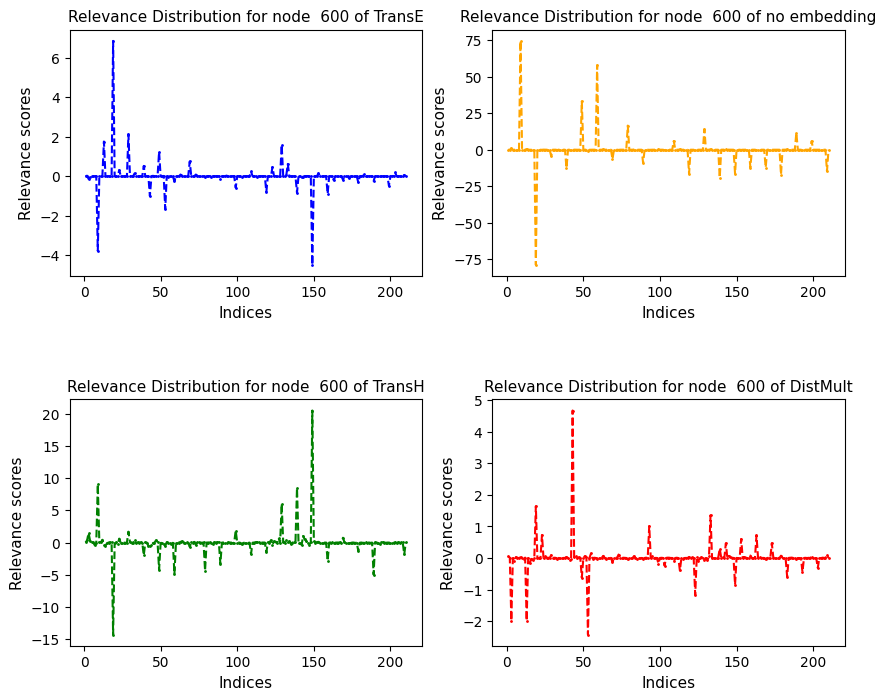

<Figure size 900x600 with 0 Axes>

relevances_edge_636.pt 636


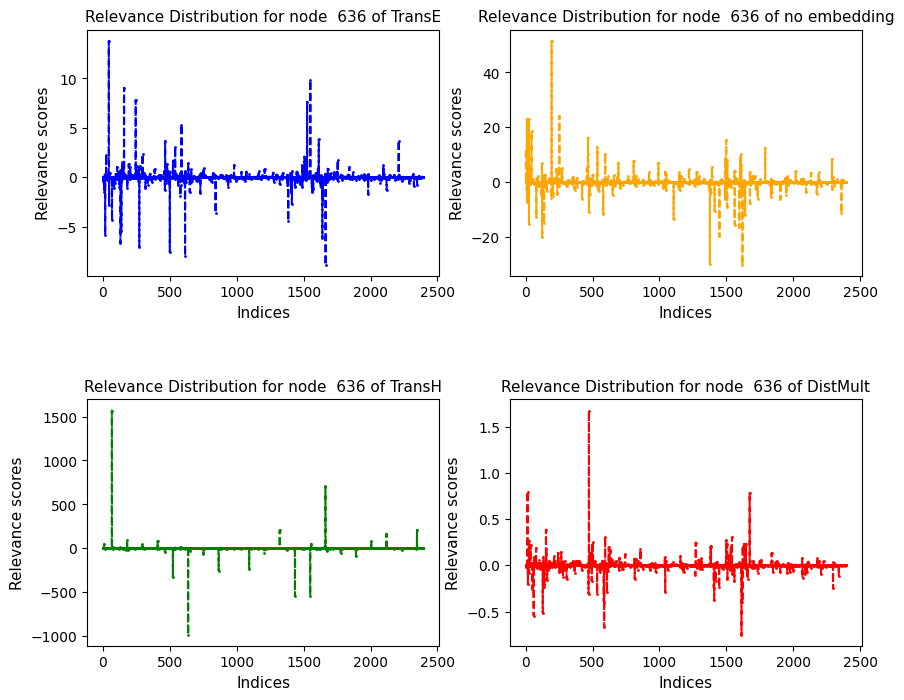

<Figure size 900x600 with 0 Axes>

relevances_edge_64.pt 64


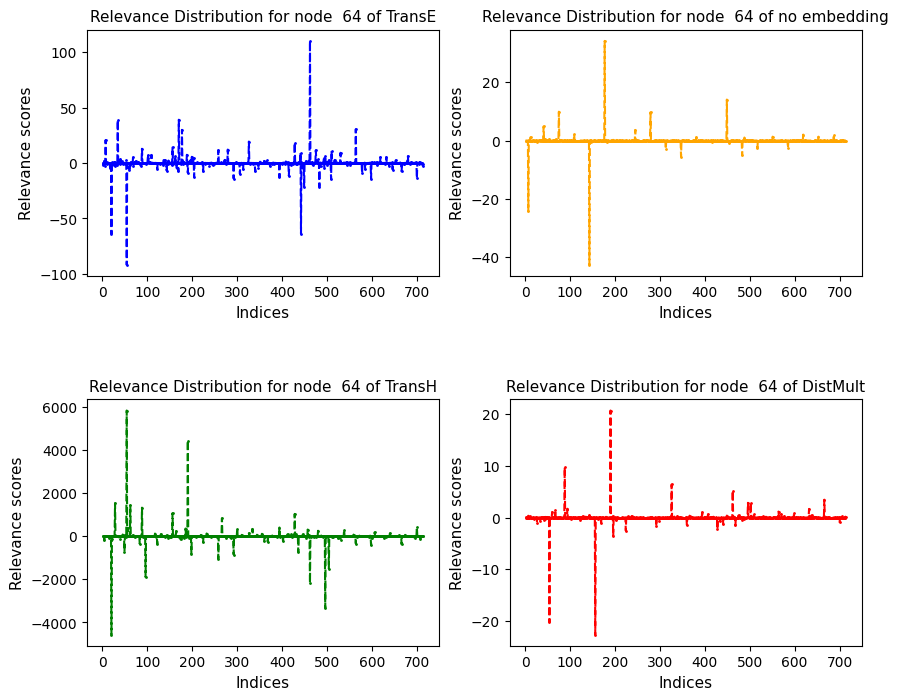

<Figure size 900x600 with 0 Axes>

relevances_edge_643.pt 643


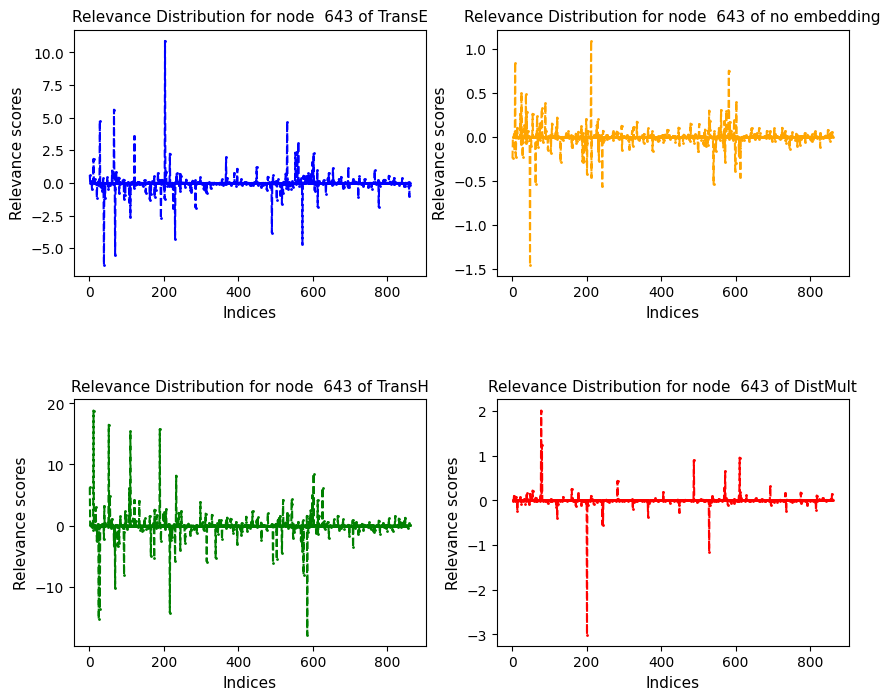

<Figure size 900x600 with 0 Axes>

relevances_edge_682.pt 682


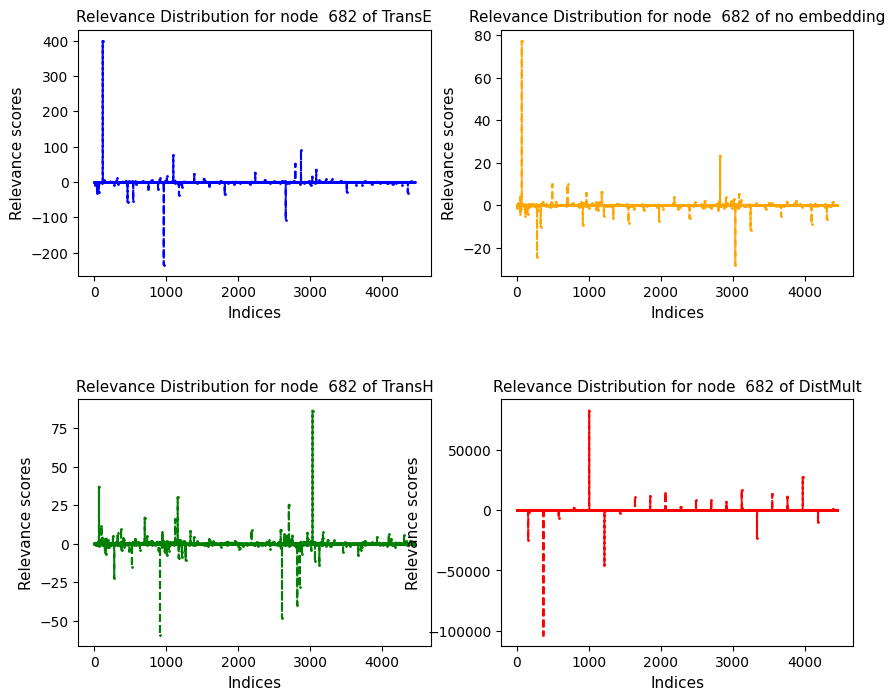

<Figure size 900x600 with 0 Axes>

relevances_edge_787.pt 787


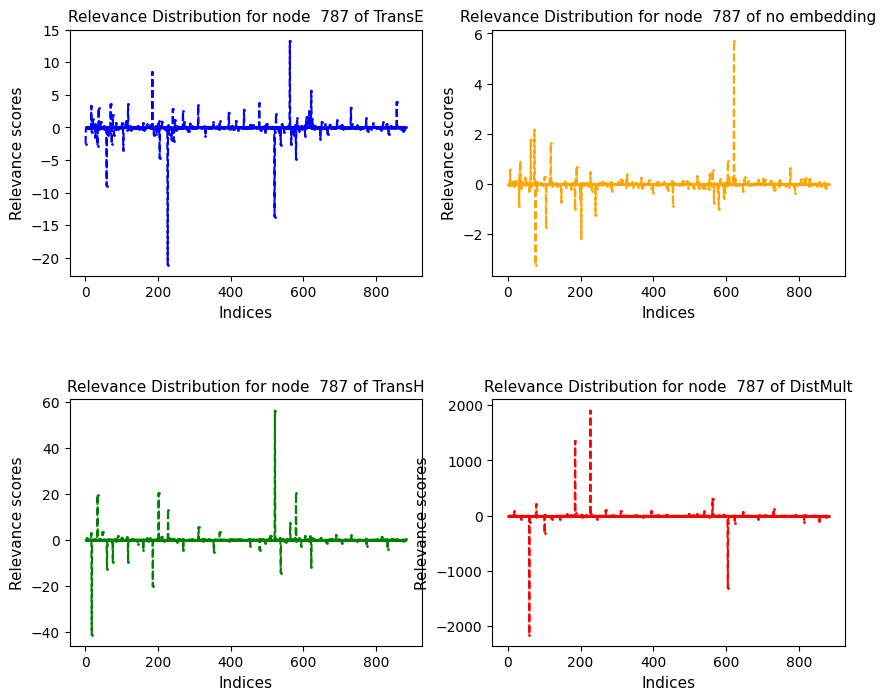

<Figure size 900x600 with 0 Axes>

relevances_edge_819.pt 819


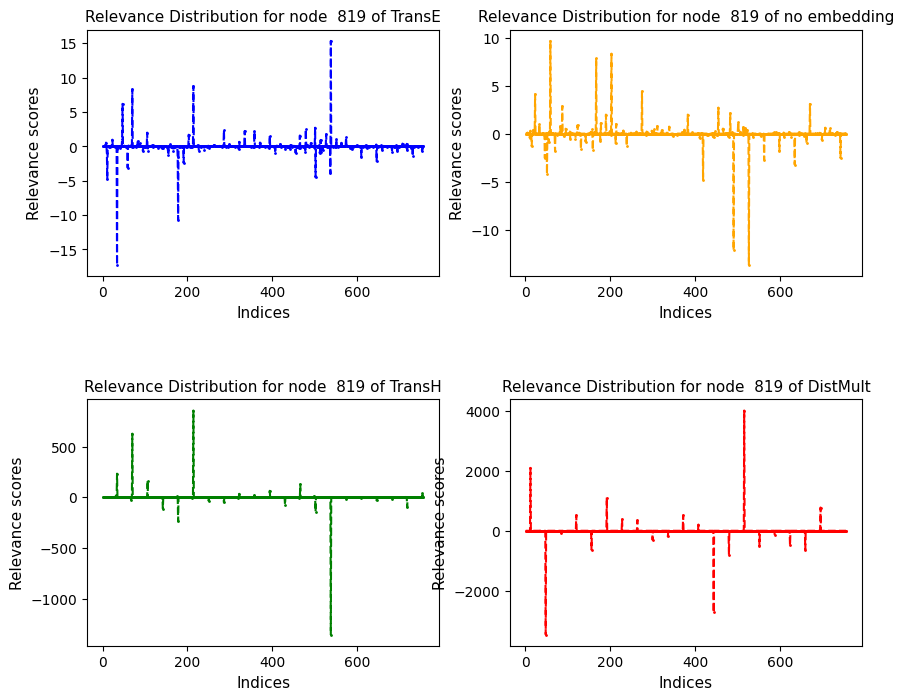

<Figure size 900x600 with 0 Axes>

relevances_edge_821.pt 821


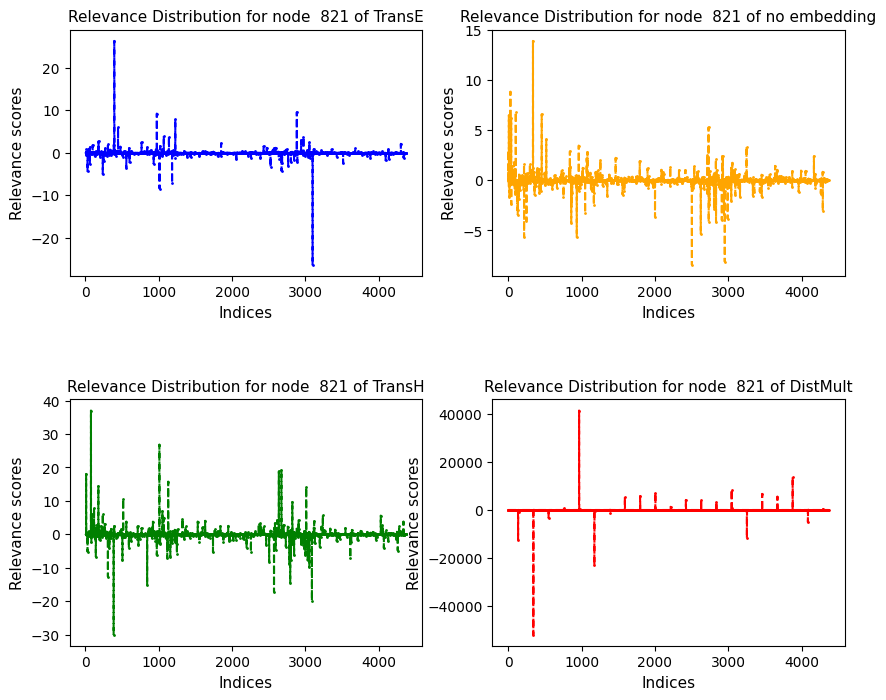

<Figure size 900x600 with 0 Axes>

relevances_edge_83.pt 83


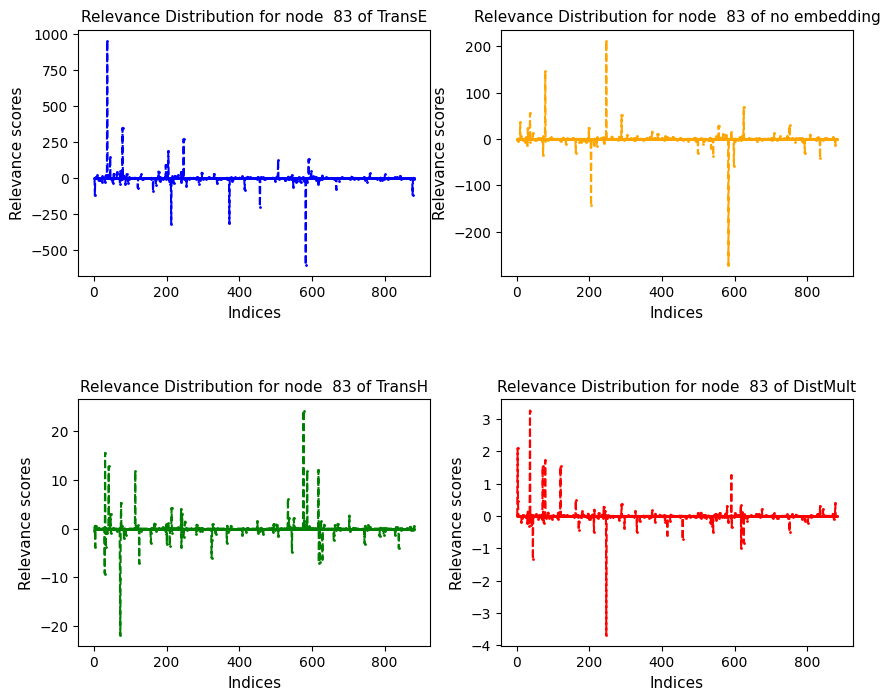

<Figure size 900x600 with 0 Axes>

relevances_edge_856.pt 856


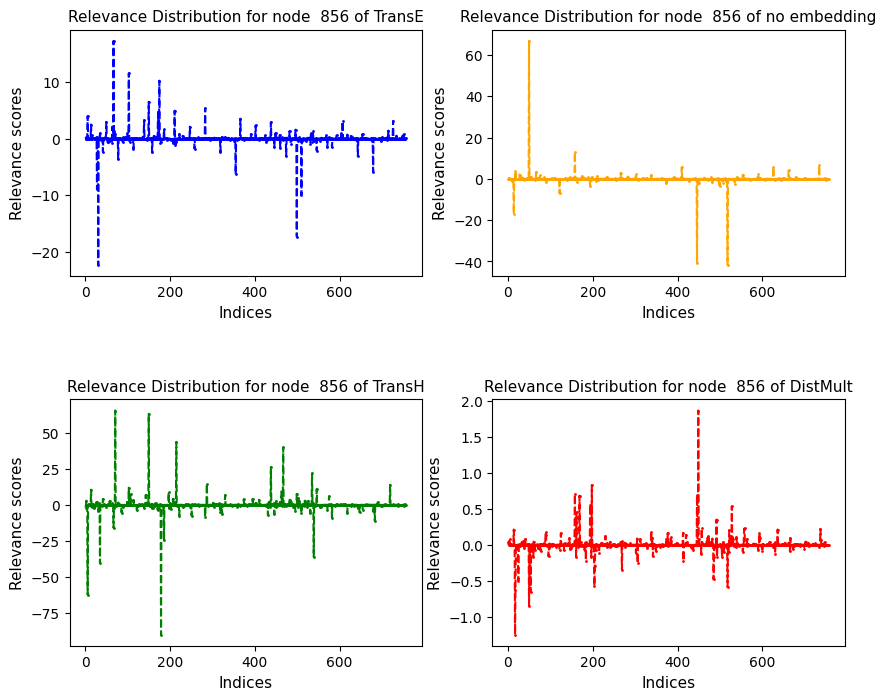

<Figure size 900x600 with 0 Axes>

In [31]:
path = 'out/AIFB/RGAT_no_emb/relevances/'
path_dist = 'out/AIFB/RGAT_emb/DistMult/relevances/'
path_transe = 'out/AIFB/RGAT_emb/TransE/relevances/'
path_transh = 'out/AIFB/RGAT_emb/TransH/relevances/'
fil = os.listdir(path)
fil_transe = os.listdir('out/AIFB/RGAT_emb/TransE/relevances/')
fil_transh = os.listdir('out/AIFB/RGAT_emb/TransH/relevances/')
fil_dist = os.listdir('out/AIFB/RGAT_emb/DistMult/relevances/')
rel_no = [file for file in fil if file.startswith("relevances_edge_")]
rel_transe = [file for file in fil if file.startswith("relevances_edge_")]
rel_transh = [file for file in fil if file.startswith("relevances_edg_")]
rel_dist = [file for file in fil if file.startswith("relevances_edge_")]

dfs = []
for rel in rel_transe:
    rte = torch.load(path_transe+rel).to_dense().detach().numpy()
    node_name = rel.split('edge_')[1].split('.')[0]
    print(rel, node_name)
    rno = torch.load(path+rel).to_dense().detach().numpy()
    rth = torch.load(path_transh+rel).to_dense().detach().numpy()
    rdi = torch.load(path_dist+rel).to_dense().detach().numpy()
    XX,YY = np.meshgrid(np.arange(rno.shape[1]),np.arange(rno.shape[0]))
    table = np.vstack((rte.ravel(),rno.ravel(),rth.ravel(), rdi.ravel(),XX.ravel(),YY.ravel())).T
    table = table[(table[:,0] != 0) & (table[:,1] != 0) & (table[:,2] != 0) & (table[:,3] != 0)]

    indices = np.arange(1, len(table[:,0]) + 1)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 8), gridspec_kw={'hspace': 0.5})
    # Create a line plot with different line styles and markers
    plt.figure(figsize=(9, 6))
    axes[0,0].plot(indices, table[:,0], color='blue', linestyle='--', marker='.', markersize=2, label='Relevance TransE')
    axes[0,1].plot(indices, table[:,1], color='orange', linestyle='--', marker='.', markersize=2, label='Relevance no embedding')
    axes[1,0].plot(indices, table[:,2], color='green', linestyle='--', marker='.', markersize=2, label='Relevance TransH')
    axes[1,1].plot(indices, table[:,3], color='red', linestyle='--', marker='.', markersize=2, label='Relevance DistMult')
    emb_type = ['TransE', 'no embedding', 'TransH', 'DistMult']
    plt.tight_layout()
    for i, ax in enumerate(axes.flatten()):
        ax.set_xlabel('Indices', fontsize=11)
        ax.set_ylabel('Relevance scores', fontsize=11)
        ax.set_title('Relevance Distribution for node  {} of {}'.format(node_name, emb_type[i]), fontsize=11)


    plt.show()



# TRANS H RGCN

In [109]:
model = 'TransH'
csv = readallcsvinpath('out/AIFB/RGAT_emb/')
pred_before = torch.load('out/AIFB/RGAT_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/AIFB/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/AIFB/RGAT_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[2])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://www.aifb.uni-karlsruhe.de/Personen/viewPersonOWL/id2137instance
12
12
12
12
13
13
12
12
12
12
13
13
12
12 432 148
[ 1  5  7 11 14 17 18 22 23 26 32 35]
0.3425925925925926


(array([0, 2, 3], dtype=int64), array([23, 10,  3], dtype=int64))

In [107]:
diff[0]-diff[3]

array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 3.71932983e-05, -1.23381615e-05, -2.22921371e-05,
        -2.47731805e-06],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
      

12
0
pred_after2433adapt_2186_12.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.5637     0.07600447 0.23029734 0.12999807]
 [0.17683917 0.02752678 0.7217034  0.07393058]
 [0.08337584 0.04056025 0.7609103  0.11515365]
 [0.25620702 0.0

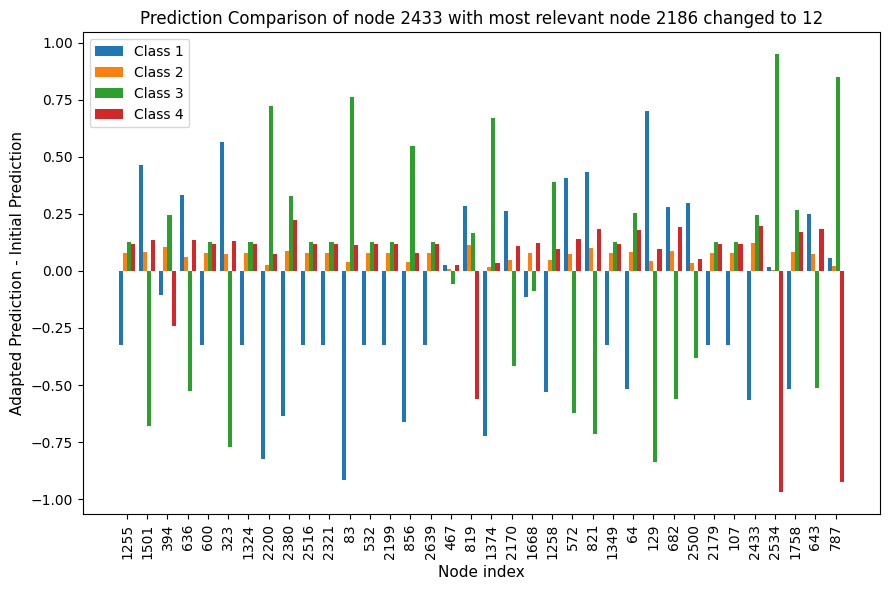

1
pred_after2433adapt_677_11.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.5637     0.07600447 0.23029734 0.12999807]
 [0.17683917 0.02752678 0.7217034  0.07393058]
 [0.08337584 0.04056025 0.7609103  0.11515365]
 [0.25620702 0.03776

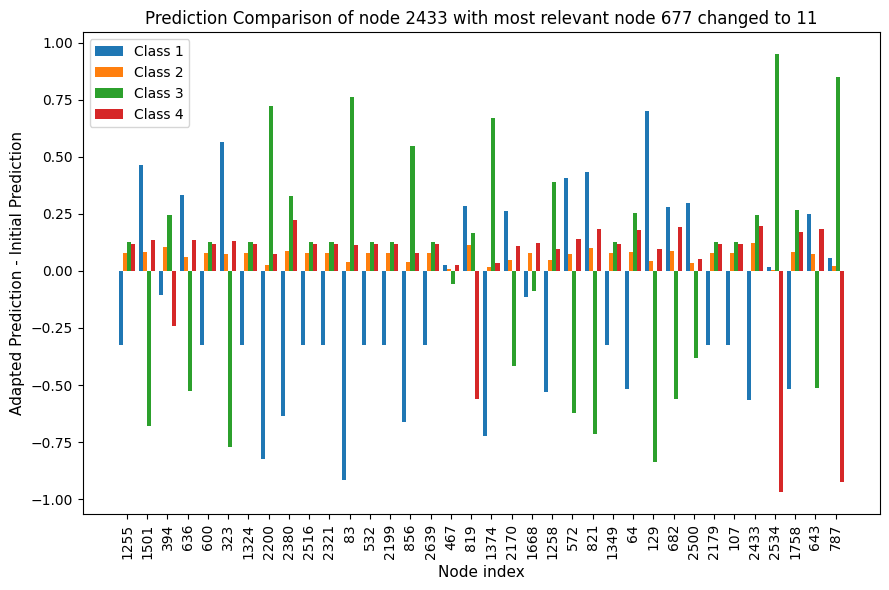

2
pred_after394adapt_346_12.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.5637     0.07600447 0.23029734 0.12999807]
 [0.17683417 0.02752744 0.72170675 0.07393177]
 [0.08337584 0.04056025 0.7609103  0.11515365]
 [0.25620264 0.037768

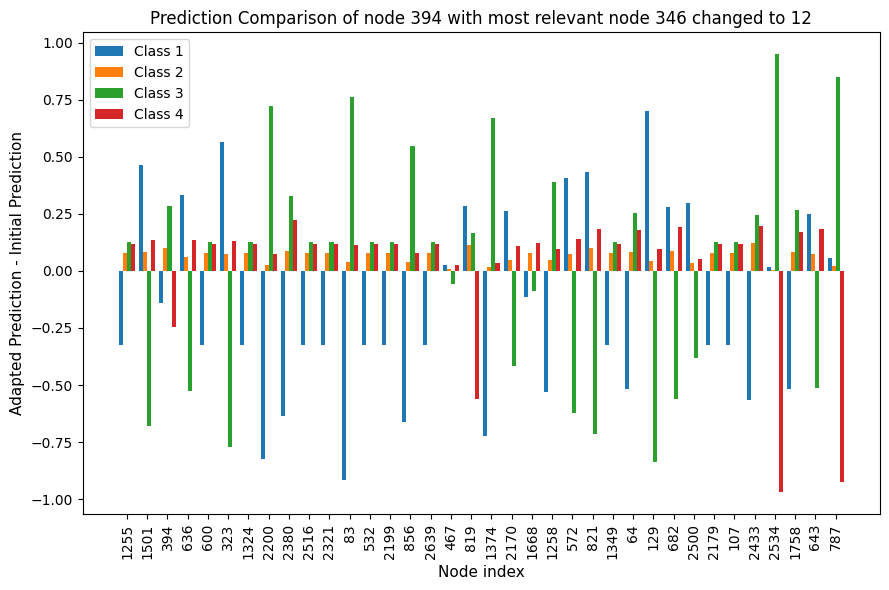

3
pred_after394adapt_84_18.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [4.8477361e-01 1.4860542e-02 3.0907344e-02 4.6945849e-01]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.15508984 0.10808104 0.43584234 0.3009868 ]
 [0.5637     0.07600447 0.23029734 0.12999807]
 [0.176839

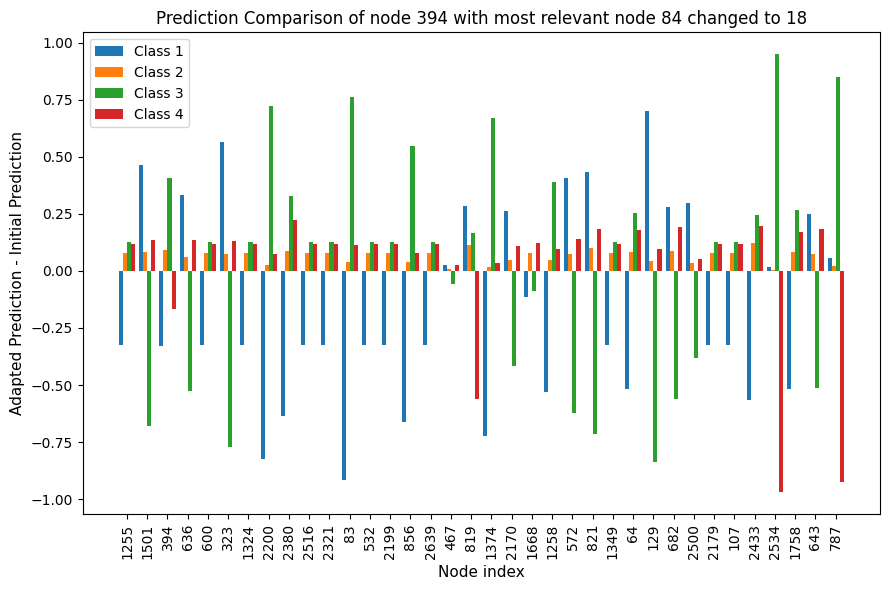

4
pred_after394adapt_tensor([   0, 1849])_12.pt
Prediction Score before:  [[4.8477361e-01 1.4860542e-02 3.0907344e-02 4.6945849e-01]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9964273e-01 1.6370046e-05 1.5975156e-06 3.3938064e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [7.3786092e-01 8.4584703e-05 2.6131955e-01 7.3491310e-04]
 [9.9925178e-01 3.8993549e-06 7.0808845e-04 3.6191876e-05]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [9.2672223e-01 2.8510133e-03 5.7289912e-03 6.4697862e-02]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [9.9749339e-01 3.8099046e-05 2.5556972e-06 2.4661240e-03]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.17918998 0.20329441 0.34737575 0.27013984]
 [0.10466488 0.0344426  0.78215677 0.07873569]
 [0.23491281 0.12125273 0.38598204 0.25

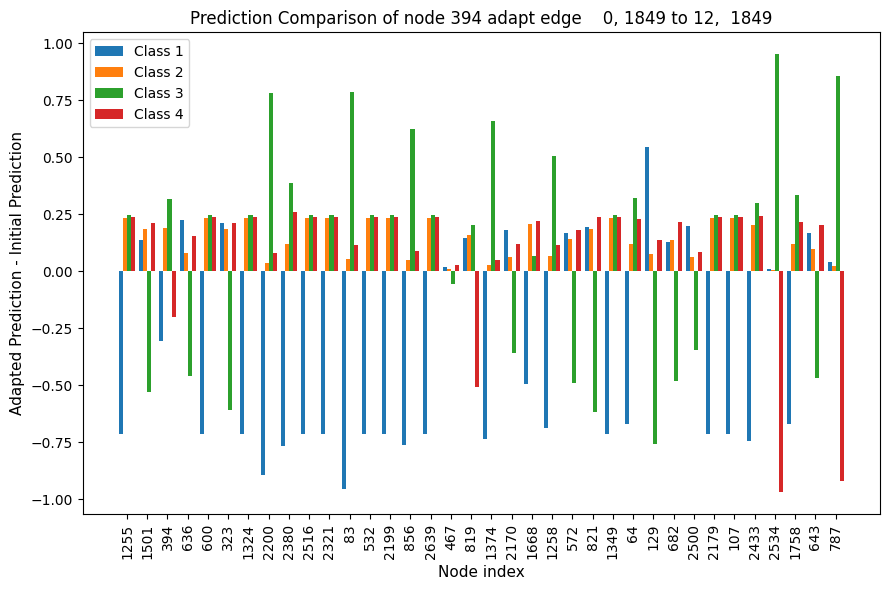

5
pred_after394adapt_tensor([   2, 1849])_13.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.5637     0.07600447 0.23029734 0.12999807]
 [0.17683917 0.02752678 0.7217034  0.07393058]
 [0.08337584 0.04056025 0.7609103  0.11515365]
 [0.

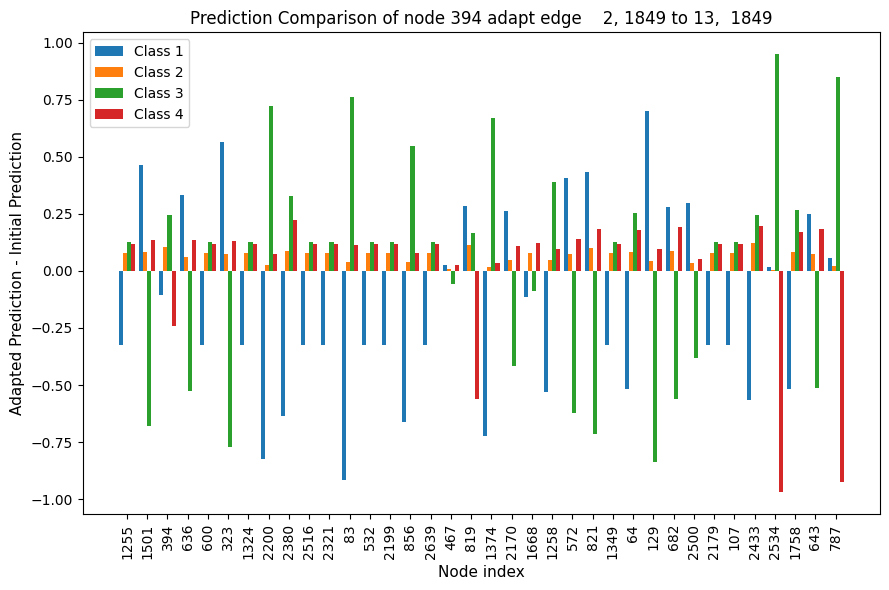

6
pred_after636adapt_tensor([   0, 1515])_8.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.52317435 0.08080887 0.25951907 0.1364977 ]
 [0.5635258  0.076042   0.2303947  0.13003759]
 [0.17673236 0.02754388 0.7217674  0.07395627]
 [0.08336595 0.04055188 0.7609728  0.11510942]
 [0.2

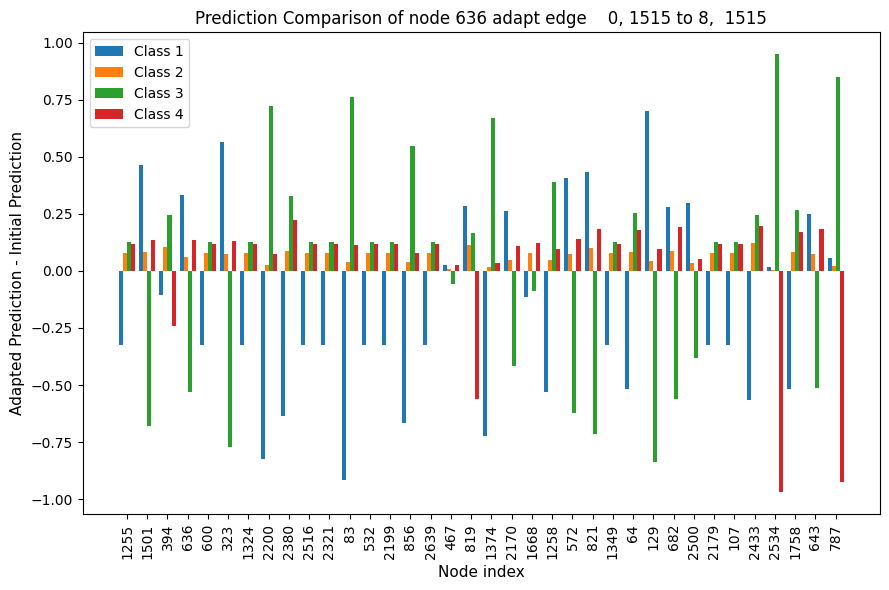

7
pred_after636adapt_tensor([   5, 1515])_16.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5237324  0.08078045 0.25904945 0.13643761]
 [0.5637128  0.07600106 0.23029287 0.12999323]
 [0.17683917 0.02752678 0.7217034  0.07393058]
 [0.08337584 0.04056025 0.7609103  0.11515365]
 [0.

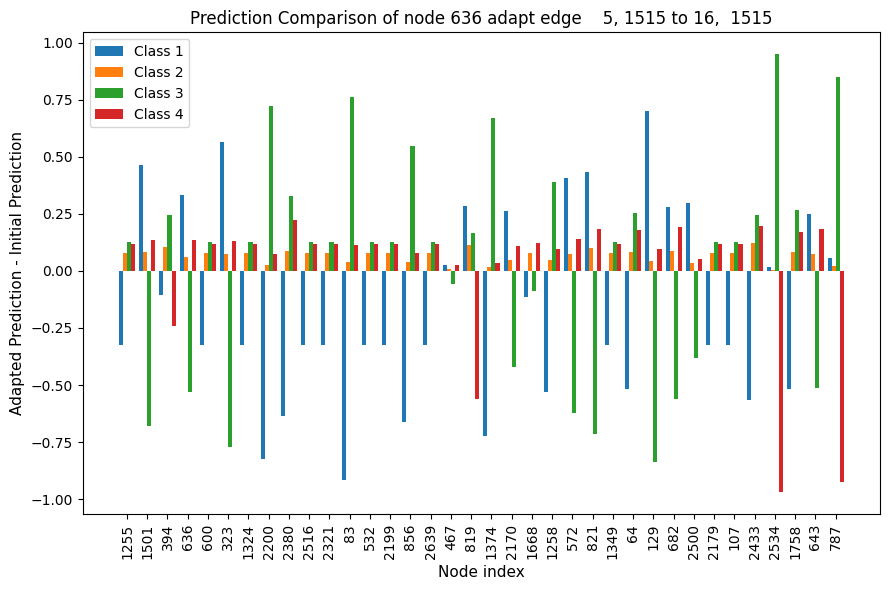

8
pred_after64adapt_1144_4.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.5637     0.07600447 0.23029734 0.12999807]
 [0.17685202 0.02752513 0.7216952  0.07392766]
 [0.08337584 0.04056025 0.7609103  0.11515365]
 [0.2562181  0.0377665

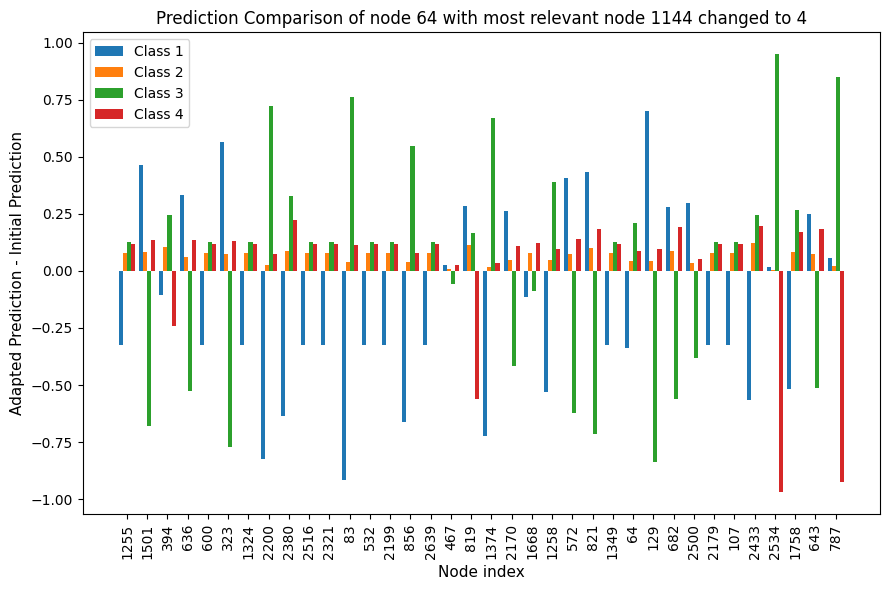

9
pred_after64adapt_902_3.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [9.9578804e-01 1.9156204e-04 3.3662631e-04 3.6837130e-03]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.5636982  0.07600449 0.23029907 0.12999825]
 [0.1768852  0.02752001 0.72167635 0.07391835]
 [0.0833758

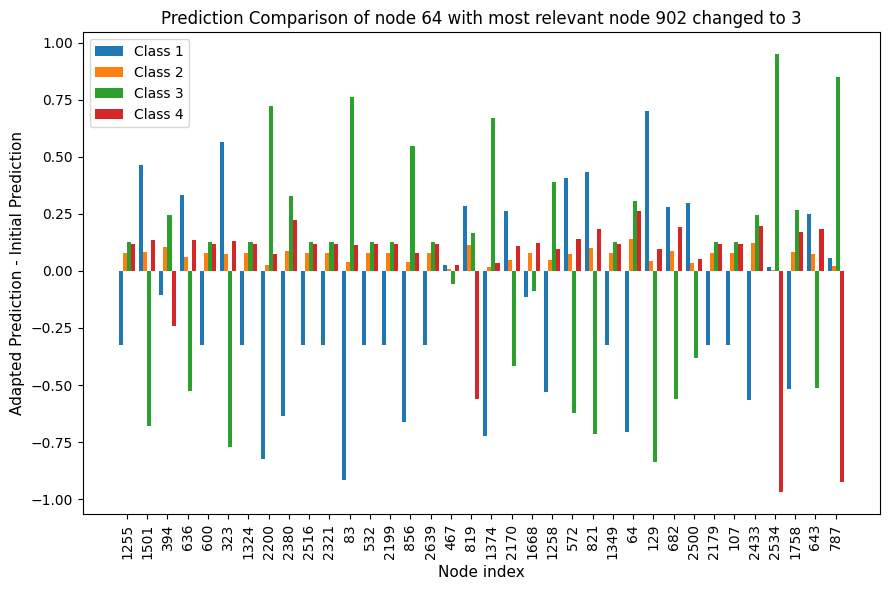

10
pred_after64adapt_tensor([   0, 1144])_5.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [9.9578804e-01 1.9156204e-04 3.3662631e-04 3.6837130e-03]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.5637     0.07600447 0.23029734 0.12999807]
 [0.17683917 0.02752678 0.7217034  0.073

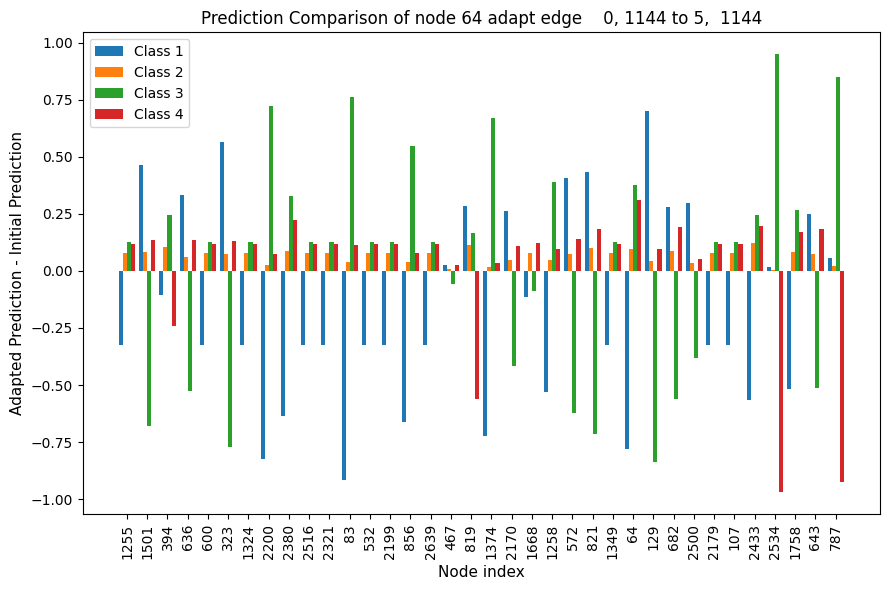

11
pred_after64adapt_tensor([   1, 1144])_18.pt
Prediction Score before:  [[6.0542706e-02 4.5707144e-05 9.3887269e-01 5.3895591e-04]
 [3.9932980e-05 7.1488898e-08 9.9995828e-01 1.7083293e-06]
 [9.9925321e-01 2.2808794e-05 4.9817204e-06 7.1905134e-04]
 [9.9916744e-01 3.6083296e-05 1.9446499e-05 7.7706290e-04]
 [9.2021257e-01 1.2235186e-04 7.8218758e-02 1.4463809e-03]
 [1.5815237e-01 9.3978131e-03 5.0644676e-04 8.3194333e-01]
 [7.6732790e-01 3.5922180e-04 2.2943541e-01 2.8775784e-03]
 [5.6655271e-11 4.2342449e-11 1.0000000e+00 4.0411368e-08]
 [7.9678812e-11 4.5509204e-11 1.0000000e+00 2.2468218e-08]
 [7.8299103e-11 3.9554471e-11 1.0000000e+00 3.3285009e-08]
 [2.8615142e-03 1.5322265e-03 2.5609953e-04 9.9535012e-01]
 [6.4532477e-03 2.2288645e-03 2.1676622e-04 9.9110121e-01]] Prediction Score after:  [[0.5234445  0.08078307 0.25931996 0.13645245]
 [0.5637     0.07600447 0.23029734 0.12999807]
 [0.17683917 0.02752678 0.7217034  0.07393058]
 [0.08337584 0.04056025 0.7609103  0.11515365]
 [0.

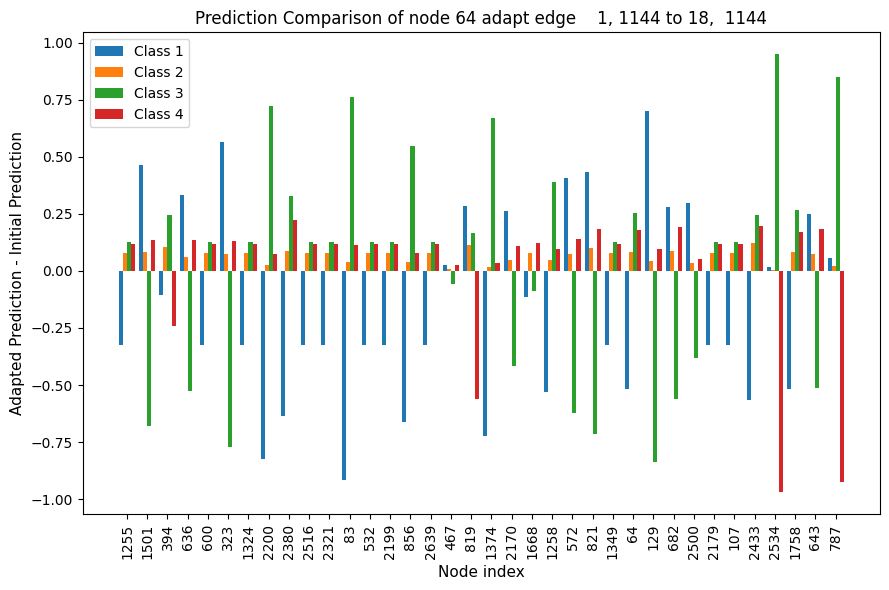

In [33]:
path = 'out/AIFB/RGAT_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(36)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=10)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=11)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()

# RGAT DistMult

In [108]:
model = 'DistMult'
csv = readallcsvinpath('out/AIFB/RGAT_emb/')
pred_before = torch.load('out/AIFB/RGAT_emb/'+model+'/pred_before.pt').to_dense().detach().numpy()
test_file = pd.read_csv('data/AIFB/testSet.tsv', sep='\t')

i2n = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/i2n.pkl')
n2i = {n:i for i, n in enumerate(i2n)}
i2r = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/i2r.pkl')

test_list = pd.read_pickle('out/AIFB/RGAT_emb/'+model+'/test_list.pkl')
test_idx = [n2i[name] for name, _ in test_list.items()]
for i,n in enumerate(i2n):
    if i == 234:
        print(n)

i2r
r2i = {r:i for i, r in enumerate(i2r)}
path = 'out/AIFB/RGAT_emb/'+model+'/'
pred_before = pred_before[test_idx]
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
fil.sort()
dfs = []
fil = fil[:len(fil)-1]
for file in fil:
    dfs.append(torch.load(path + file).to_dense()[test_idx].detach().numpy())
print(len(fil))
diff = {}
i=0                                
for i in range(len(fil)):
    minus = (dfs[i] - pred_before)
    diff[i] = minus
    # if minus.sum() != 0:
    #     diff[i] = minus
#len(diff)
classes_before = pred_before.argmax(axis=1)
count_changed,total_pred = 0,0
ch_index = []
cl_after = []
count_cl_after = []
for i in range(len(dfs)):
    classes = dfs[i].argmax(axis=1)
    changed_pred = np.sum([classes != classes_before])
    changed_index = np.where(classes != classes_before)[0]
    count_changed += changed_pred
    total_pred += len(classes)
    ch_index.append(changed_index)
    cl_after.append(classes)
    count_cl_after.append(np.unique(classes, return_counts=True))
    print(changed_pred)
print(len(dfs), total_pred,  count_changed)
score = count_changed / total_pred
print(ch_index[1])
print(score)
count_classes_before = np.unique(classes_before, return_counts=True)
count_classes_before

http://www.aifb.uni-karlsruhe.de/Personen/viewPersonOWL/id2137instance
12
18
18
18
18
18
18
18
18
18
18
18
18
12 432 216
[ 1  2  3  5  7 14 16 17 19 21 22 23 26 27 31 32 34 35]
0.5


(array([0, 1, 2], dtype=int64), array([20,  5, 11], dtype=int64))

12
0
pred_after129adapt_tensor([   1, 1935])_4.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653

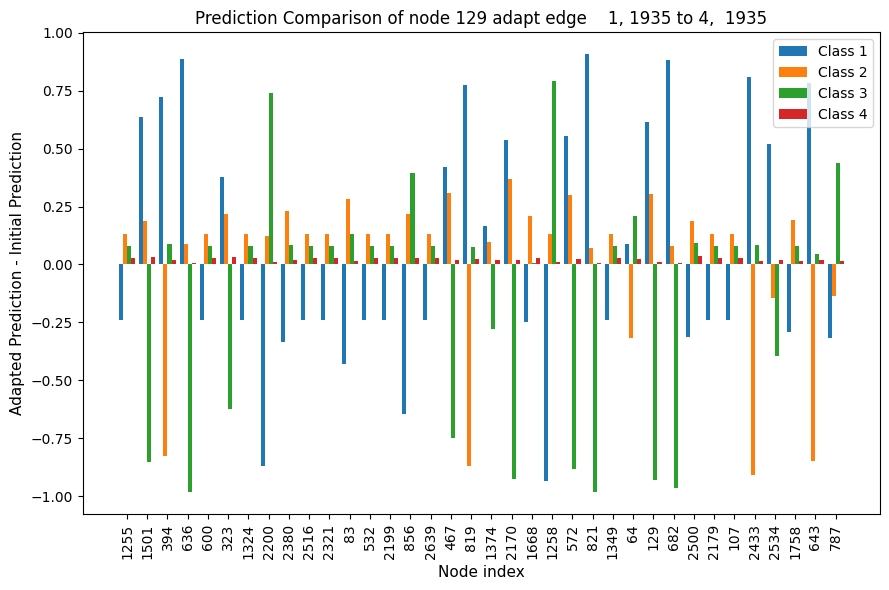

1
pred_after129adapt_tensor([   4, 1935])_1.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-0

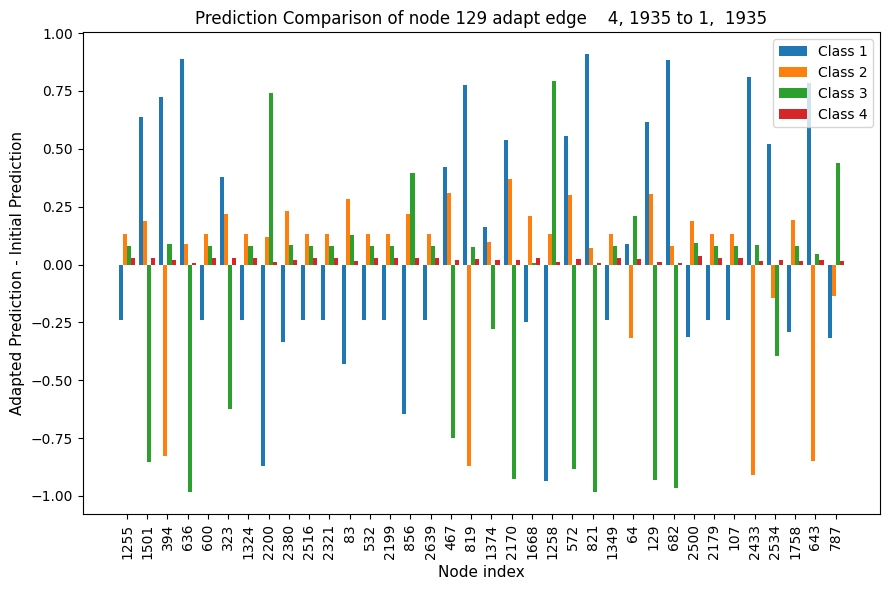

2
pred_after2200adapt_1709_9.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-01 5.6569326e-07

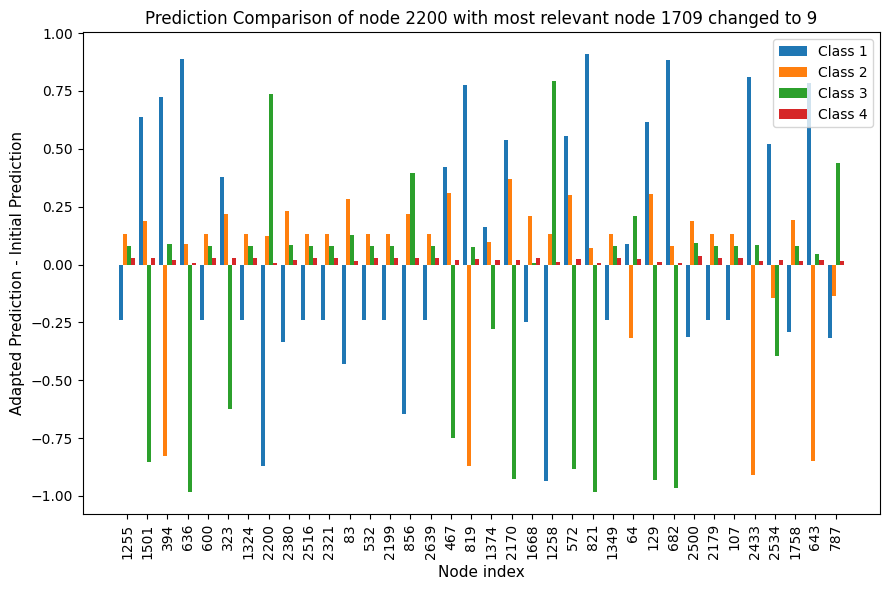

3
pred_after2200adapt_811_16.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-01 5.6569326e-07

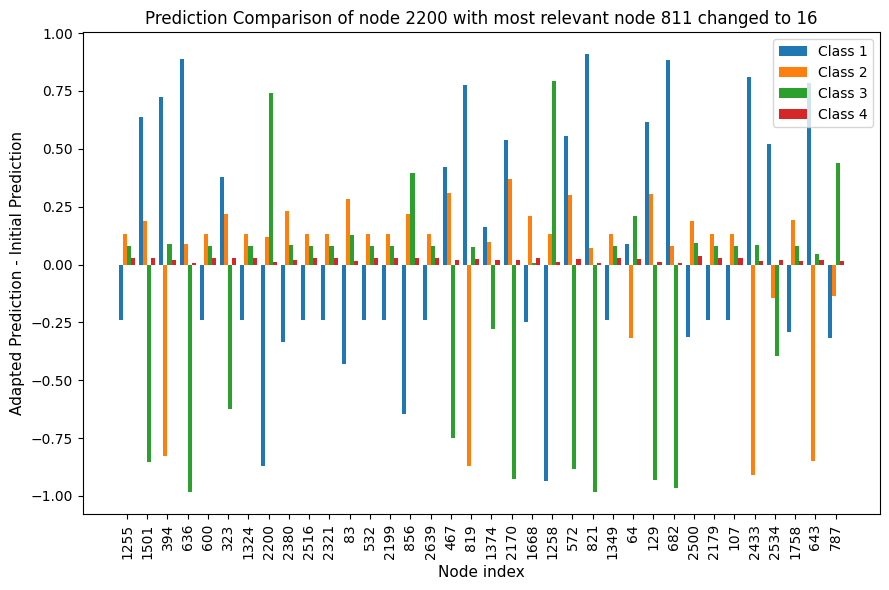

4
pred_after323adapt_24_5.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-01 5.6569326e-07]
 

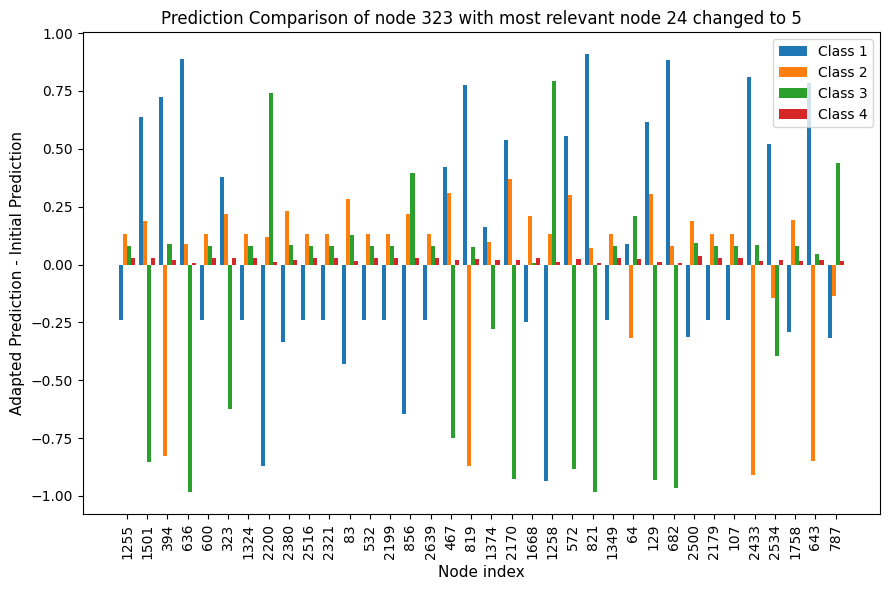

5
pred_after323adapt_914_3.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-01 5.6569326e-07]


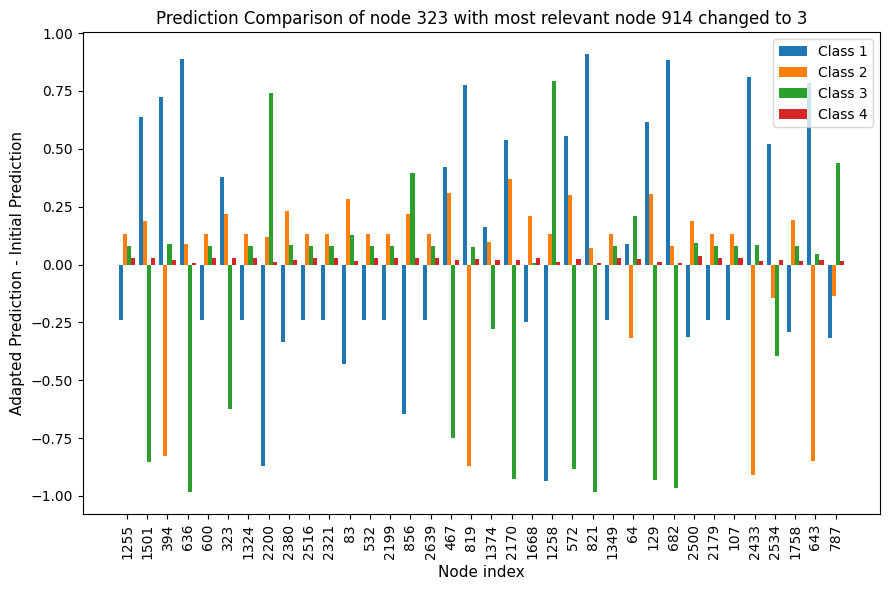

6
pred_after682adapt_tensor([   1, 1935])_0.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-0

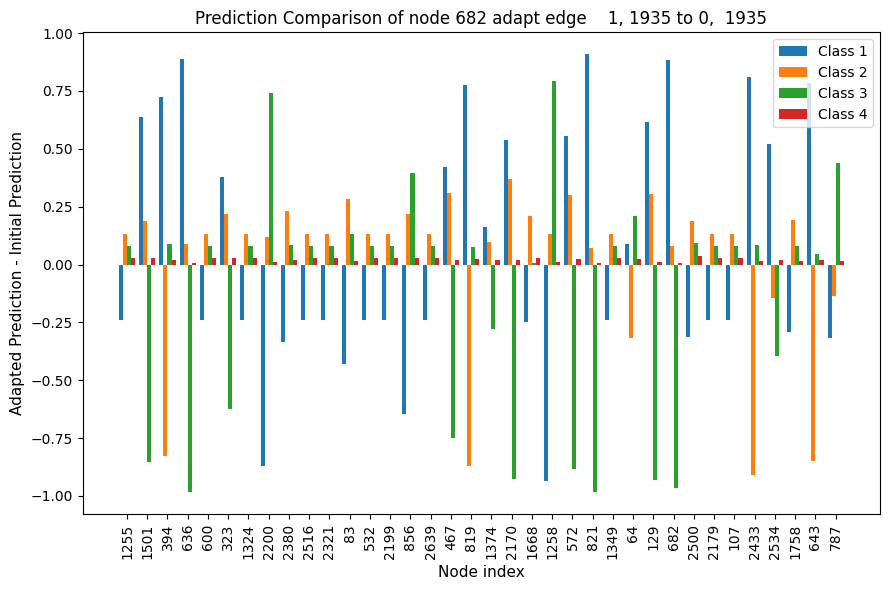

7
pred_after682adapt_tensor([   4, 1935])_2.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-0

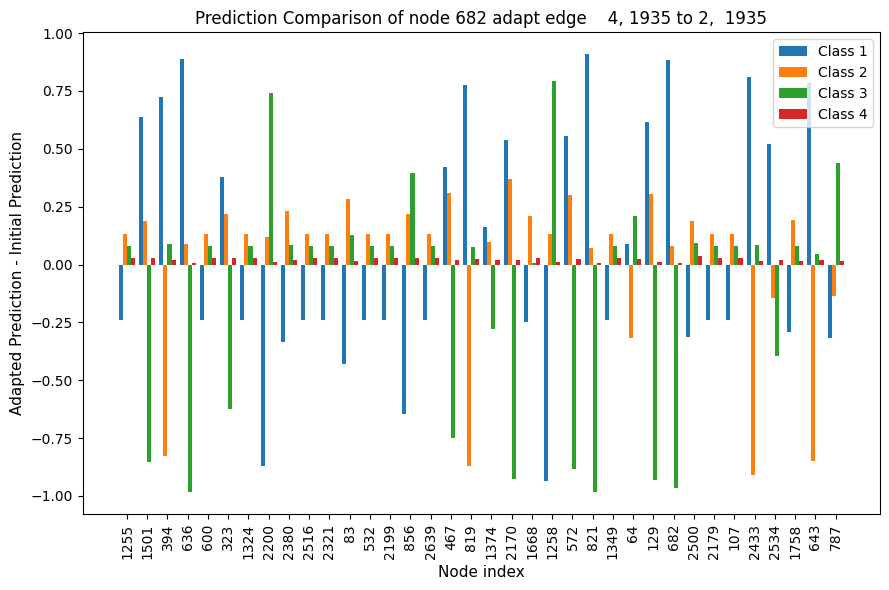

8
pred_after787adapt_195_7.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-01 5.6569326e-07]


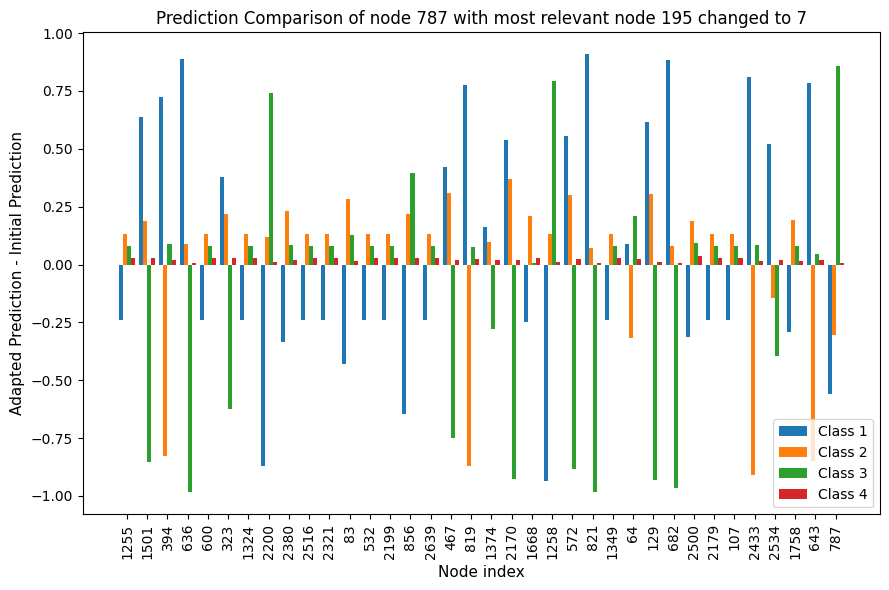

9
pred_after787adapt_857_2.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-01 5.6569326e-07]


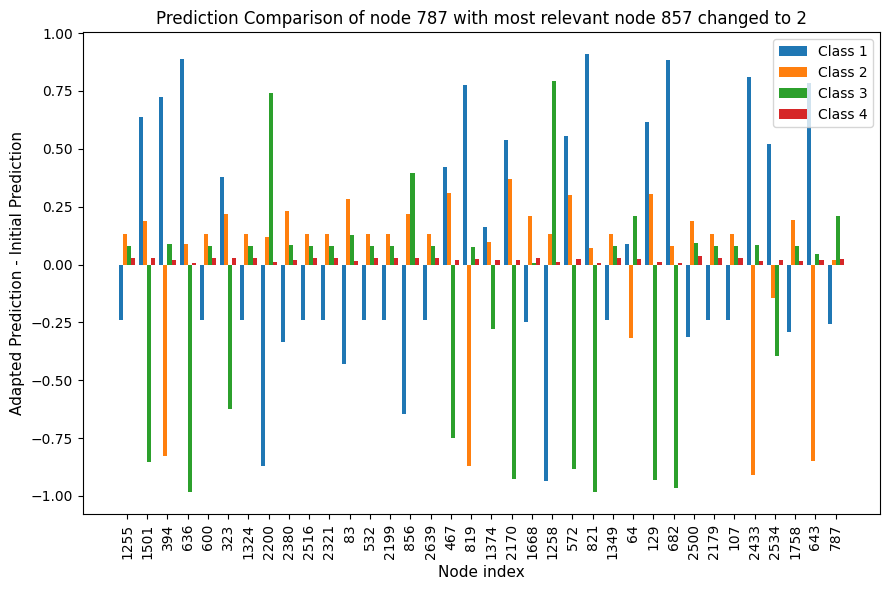

10
pred_after821adapt_tensor([   1, 1935])_6.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-

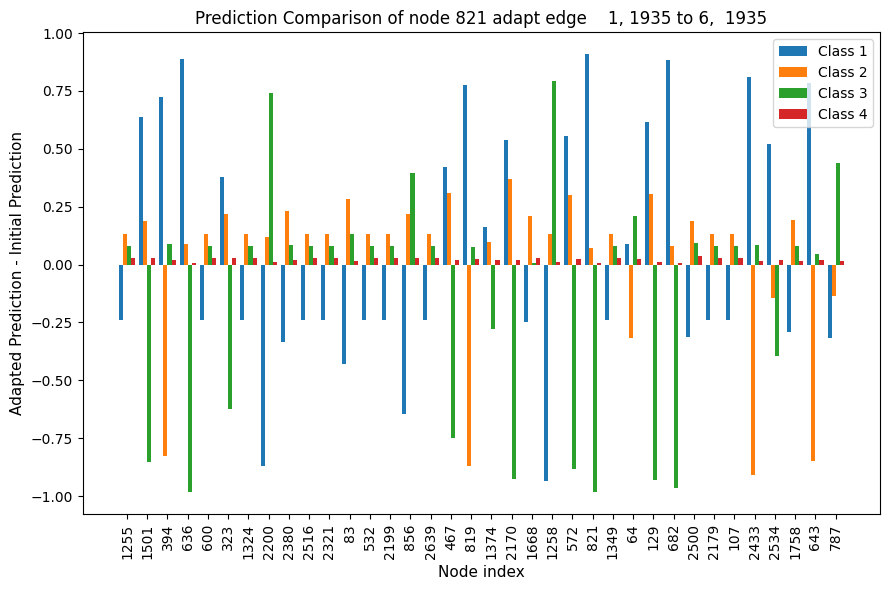

11
pred_after821adapt_tensor([   4, 1935])_1.pt
Prediction Score before:  [[1.2301741e-02 4.8403855e-04 9.8721409e-01 1.3087161e-07]
 [2.2023569e-05 9.9997795e-01 3.8942513e-08 1.2910220e-09]
 [1.4775635e-08 5.2635464e-06 9.9999475e-01 3.4137127e-12]
 [1.3795226e-07 3.2930746e-08 9.9999988e-01 5.4888468e-12]
 [9.9964786e-01 3.5216403e-04 1.2549587e-08 1.7069650e-10]
 [9.9464524e-01 4.0901559e-03 1.2640731e-03 5.9118383e-07]
 [1.7352787e-12 3.9211825e-09 1.0000000e+00 3.2076507e-15]
 [2.0106207e-03 9.9798942e-01 3.9360348e-08 2.7501336e-08]
 [2.1169588e-09 1.5880327e-06 9.9999845e-01 7.0496874e-13]
 [9.9947637e-01 5.2290410e-04 7.7241560e-07 6.7768036e-09]
 [6.5996327e-12 1.4580100e-09 1.0000000e+00 4.7353589e-15]
 [2.8418214e-11 4.2054850e-08 1.0000000e+00 6.1485132e-14]
 [6.9001451e-13 1.0056456e-09 1.0000000e+00 1.8576500e-15]
 [1.4883553e-13 1.8931425e-09 1.0000000e+00 9.1654259e-16]
 [5.3020666e-04 9.9946827e-01 1.5197761e-06 1.5391210e-08]
 [4.2793110e-02 4.1525978e-01 5.4194653e-

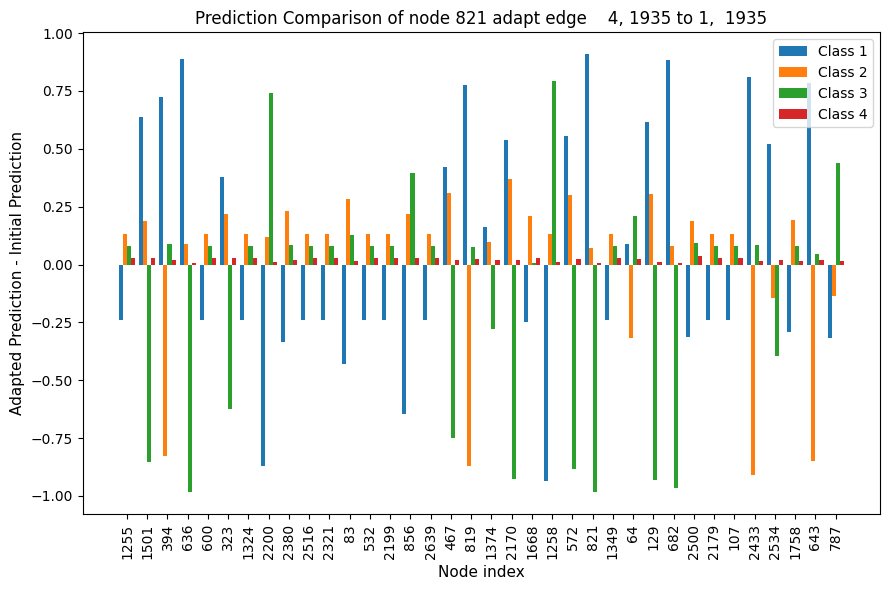

In [35]:
path = 'out/AIFB/RGAT_emb/'+model+'/'
fil = os.listdir(path)
fil = [file for file in fil if file.endswith(".pt")]
print(len(diff))
for i in diff:
    print(i)
    percentage_changes = diff[i]
    name = fil[i]
    print(name)
    
    start_node = name.split('pred_after')[1].split('adapt')[0]
    if ch_index[i].size != 0:
        pb = pred_before[ch_index[i]]
        pa = dfs[i][ch_index[i]]
        print('Prediction Score before: ',pb, 'Prediction Score after: ', pa)
        print(test_idx[ch_index[i][0]])
    print(count_classes_before, count_cl_after[i])
    
    # Set the width of each bar
    bar_width = 0.2
    x_positions = np.arange(36)
    # Create a bar plot for each class
    plt.figure(figsize=(9, 6))
    plt.bar(x_positions - 1.5*bar_width, percentage_changes[:, 0], width=bar_width, label='Class 1')
    plt.bar(x_positions - 0.5*bar_width, percentage_changes[:, 1], width=bar_width, label='Class 2')
    plt.bar(x_positions + 0.5*bar_width, percentage_changes[:, 2], width=bar_width, label='Class 3')
    plt.bar(x_positions + 1.5*bar_width, percentage_changes[:, 3], width=bar_width, label='Class 4')

    # Set x-axis labels and tick positions
    plt.xticks(x_positions, test_idx, rotation='vertical', fontsize=10)
    plt.xlabel('Node index', fontsize=11)
    plt.ylabel('Adapted Prediction - Initial Prediction' , fontsize=11)
    if 'adapt_tensor' in name:
        relevant_edge = name.split('[')[1].split(']')[0]
        adapt_edge = name.split('_')[-1].split('.')[0]
        second_node = relevant_edge.split(',')[1]
        plt.title('Prediction Comparison of node {} adapt edge {} to {}, {}'.format(start_node, relevant_edge, adapt_edge, second_node))

    else:
        adapt_to = name.split('_')[2].split('_')[0]
        to_node = name.split('_')[3].split('.')[0]
        plt.title('Prediction Comparison of node {} with most relevant node {} changed to {}'.format(start_node, adapt_to,to_node))
    plt.legend()
    plt.tight_layout()
    plt.show()